In [1]:
import math
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif']=['SimHei'] #用来正常显示中文标签
plt.rcParams['axes.unicode_minus']=False #用来正常显示负号
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split,cross_validate,GridSearchCV
import lightgbm as lgb
import seaborn as sns

# 读取数据 分析

In [2]:
xlsx_file = pd.ExcelFile('./2021-2022_O3&气象五参.xlsx')
sheet_names = xlsx_file.sheet_names
data = pd.DataFrame()

# datat= pd.read_excel('./预测数据.xlsx')
# datat

#得到2021和2022年的数据
df1 = xlsx_file.parse(sheet_names[0])
df2 = xlsx_file.parse(sheet_names[1])
data = pd.concat([df1,df2])
data = data.reset_index(drop=True)
# datat.info()
columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
        if column in data.columns:
            data[column] = data[column].interpolate(method='linear')

def daypart(hour):
    if hour in [2,3,4,5]:
        return "dawn"
    elif hour in [6,7,8,9]:
        return "morning"
    elif hour in [10,11,12,13]:
        return "noon"
    elif hour in [14,15,16,17]:
        return "afternoon"
    elif hour in [18,19,20,21]:
        return "evening"
    else: return "midnight"
data['C1705_DATETIME'] = pd.to_datetime(data['C1705_DATETIME'])
data['year'] = data.C1705_DATETIME.dt.year
data['month'] = data.C1705_DATETIME.dt.month
data['day'] = data.C1705_DATETIME.dt.day
data['hour'] = data.C1705_DATETIME.dt.hour
# data['weekday'] = data.C1705_DATETIME.dt.weekday
# data['day_of_Week'] = data.C1705_DATETIME.dt.dayofweek
to_one_hot = data['C1705_DATETIME'].dt.day_name()
# second: one hot encode to 7 columns
days = pd.get_dummies(to_one_hot)
#display data
for column in days.columns:
    data[column] = days[column]
    
raw_dayparts = data['hour'].apply(daypart)
# one hot encoding
dayparts = pd.get_dummies(raw_dayparts)
for column in dayparts.columns:
    data[column] = dayparts[column]


mask = data['O3VAL'] < 0  # 创建一个布尔掩码，表示负值
data.loc[mask, 'O3VAL'] *= -1  # 将负值取反
data1 = data[data['C0007_PNAME']=='八大关街道']
data2 = data[data['C0007_PNAME']=='北宅街道']
data3 = data[data['C0007_PNAME']=='登州路街道']
data4 = data[data['C0007_PNAME']=='上马街道']
data5 = data[data['C0007_PNAME']=='兴城路街道']


import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import STL
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()


# ------归一化数据---------------

# data1['O3VAL'] = scaler.fit_transform(np.array(data1['O3VAL'].values.reshape(-1, 1)))
data1['QIWENVAL'] = scaler.fit_transform(np.array(data1['QIWENVAL'].values.reshape(-1, 1)))
data1['FSVAL'] = scaler.fit_transform(np.array(data1['FSVAL'].values.reshape(-1, 1)))
data1['FXVAL'] = scaler.fit_transform(np.array(data1['FXVAL'].values.reshape(-1, 1)))
data1['SHIDUVAL'] = scaler.fit_transform(np.array(data1['SHIDUVAL'].values.reshape(-1, 1)))
data1['YALIVAL'] = scaler.fit_transform(np.array(data1['YALIVAL'].values.reshape(-1, 1)))

# data1['O3VAL'] = np.sqrt(data1['O3VAL'])
# 创建一个示例时间序列数据
# dates = pd.date_range(start='2021-01-01 00:00:00',end='2022-12-17 23:00:00',freq='H')
# print(data1[data1['C1705_DATETIME'] == '2021-12-31 23:00:00'])
# ts = pd.Series(scaler.fit_transform(data1.loc[0:82703]['O3VAL'].values.reshape(-1, 1)).flatten(), index=dates)

dates = pd.date_range(start='2021-01-01 00:00:00',end='2021-12-31 23:00:00',freq='H')
ts = pd.Series(data1.loc[0:30480]['O3VAL'].values.reshape(-1, 1).flatten(), index=dates)
# 进行STL分解
stl = STL(ts)  # seasonal参数表示季节性周期，这里设定为13表示大约一个季度
result = stl.fit()

dates1 = pd.date_range(start='2022-01-01 00:00:00',end='2022-12-31 23:00:00',freq='H')
ts1 = pd.Series(data1.loc[30480:]['O3VAL'].values.reshape(-1, 1).flatten(), index=dates1)
# 进行STL分解
stl1 = STL(ts1)  # seasonal参数表示季节性周期，这里设定为13表示大约一个季度
result1 = stl1.fit()

# 获取分解后的趋势、季节性和残差
trend = result.trend.values
seasonal = result.seasonal.values
residual = result.resid.values

trend1 = result1.trend.values
seasonal1 = result1.seasonal.values
residual1 = result1.resid.values

mean_trend = (trend + trend1) / 2
mean_seasonal = (seasonal + seasonal1) / 2
mean_residual = (residual + residual1) / 2
time_dates = pd.date_range(start='2024-04-01 00:00:00',end='2024-6-30 23:00:00',freq='H')
trend_scaled = scaler.fit_transform(np.array(mean_trend.reshape(-1, 1)))[2160:4344]
seasonal_scaled = scaler.fit_transform(np.array(mean_seasonal.reshape(-1, 1)))[2160:4344]

trend_array = {}
seasonal_array = {}
for i in range(0, 2184):
    trend_array[time_dates[i]] = trend_scaled[i][0]
    seasonal_array[time_dates[i]] = seasonal_scaled[i][0]

C:\Users\lenovo\AppData\Local\Temp\ipykernel_25340\951876144.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['QIWENVAL'] = scaler.fit_transform(np.array(data1['QIWENVAL'].values.reshape(-1, 1)))
C:\Users\lenovo\AppData\Local\Temp\ipykernel_25340\951876144.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['FSVAL'] = scaler.fit_transform(np.array(data1['FSVAL'].values.reshape(-1, 1)))
C:\Users\lenovo\AppData\Local\Temp\ipykernel_25340\951876144.py:73: SettingWithCopyWarning: 
A value is tr

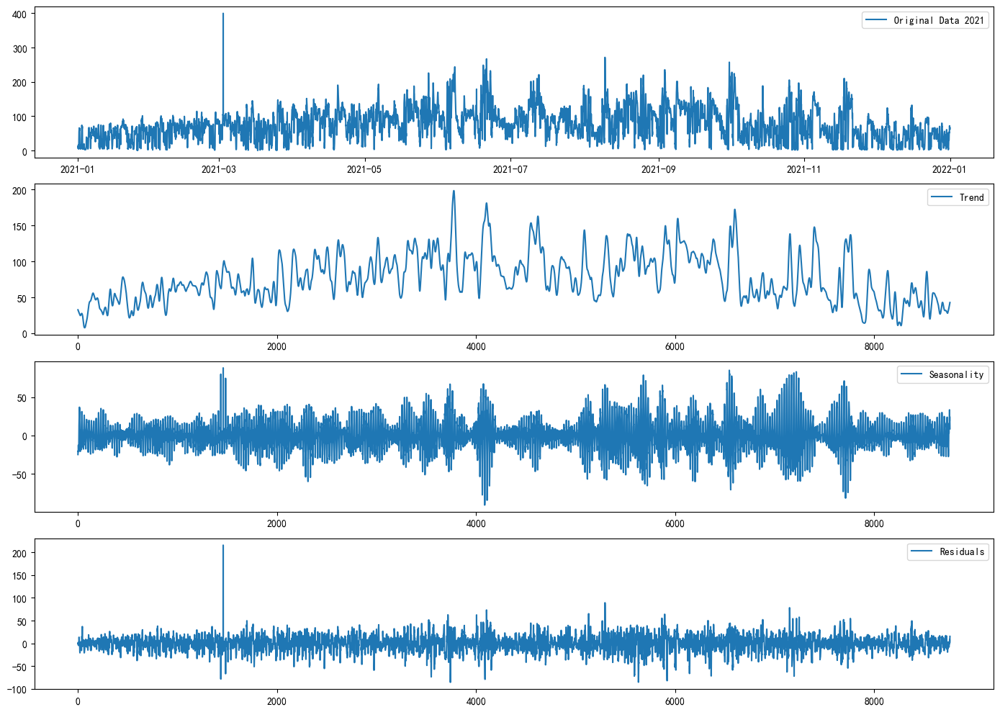

In [3]:
# 可视化
plt.figure(figsize=(14, 10))

# 原始时间序列
plt.subplot(4, 1, 1)
plt.plot(ts, label='Original Data 2021')
plt.legend(loc='best')

# 趋势
plt.subplot(4, 1, 2)
plt.plot(trend, label='Trend')
plt.legend(loc='best')

# 季节性
plt.subplot(4, 1, 3)
plt.plot(seasonal, label='Seasonality')
plt.legend(loc='best')

# 残差
plt.subplot(4, 1, 4)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')

plt.tight_layout()
plt.show()

# 截取对应街道数据，特征工程

In [26]:
datat= pd.read_excel('7.30预测.xls')
datat = datat[datat['C0007_PNAME'] == '八大关街道']
datat = datat.rename(columns={"TO_CHAR(H.C1705_DATETIME,'YYYY": '日期'})
datat
zhihou = 28*24+1

### 将我们需要的气象特征转换构建出来

In [27]:
import os
import pandas as pd
def get_season(month):
    if month in [2, 3, 4]:
        return 1
    elif month in [5, 6, 7, 8]:
        return 2
    elif month in [9, 10, 11]:
        return 3
    elif month in [12, 1]:
        return 4
def calculate_wind_speed(U, V):
    return np.sqrt(U**2 + V**2)   

def calculate_wind_direction(U, V):
    # 确保U和V没有缺失值
    U = np.nan_to_num(U)
    V = np.nan_to_num(V)
    direction = np.arctan2(U, V) * (180 / np.pi)  # 转换为角度
    direction = np.mod(direction + 360, 360)  # 确保风向在0到360度之间
    return direction

folder_path = "./wrfout/"
files = os.listdir(folder_path)
columns_to_convert = ['U10', 'V10', '气温开尔文', 'YALIVAL', 'SHIDUVAL']
df_list = []
date_format = "%Y-%m-%d_%H_%M_%S"
for file in files:
    # 获取完整路径
    file_path = os.path.join(folder_path, file)
    data = pd.read_csv(file_path, delimiter='\s+', header=None, engine='python',skiprows=1,
                       usecols=[0, 1, 2, 3, 5, 6, 7],
                       names=['日期', '站点', 'U10', 'V10', '气温开尔文', 'YALIVAL', 'SHIDUVAL'])
    data = data[data['站点'] == 'badaguan']
    data['year'] = data['日期'].str[:4].astype(int)
    data['month'] = data['日期'].str[5:7].astype(int)
    data['day'] = data['日期'].str[8:10].astype(int)
    data['hour'] = data['日期'].str[11:13].astype(int)
    for column in columns_to_convert:
        data[column] = pd.to_numeric(data[column], errors='coerce')
        data['FSVAL'] = calculate_wind_speed(data['U10'], data['V10'])
        data['FXVAL'] = calculate_wind_direction(data['U10'], data['V10'])
    data['QIWENVAL'] = data['气温开尔文'] - 273.15
    columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
    for column in columns_to_interpolate:
        if column in data.columns:
            data[column] = data[column].interpolate(method='linear')
    data['日期'] = pd.to_datetime(data['日期'], format=date_format)
    df_list.append(data)

def is_weekend_series(series):
    def is_weekday(date):
        weekday = date.weekday()
        return weekday >= 5

    return series.apply(is_weekday)

df_list 

[                     日期        站点   U10   V10   气温开尔文  YALIVAL  SHIDUVAL  \
 0   2024-05-09 00:00:00  badaguan  0.32  3.55  286.04  1020.40     89.04   
 5   2024-05-09 01:00:00  badaguan  0.20  2.87  286.09  1020.71     85.99   
 10  2024-05-09 02:00:00  badaguan  0.69  3.01  286.22  1020.68     84.68   
 15  2024-05-09 03:00:00  badaguan  1.51  3.34  286.32  1020.68     81.08   
 20  2024-05-09 04:00:00  badaguan  1.29  3.57  286.38  1021.05     76.11   
 ..                  ...       ...   ...   ...     ...      ...       ...   
 935 2024-05-16 19:00:00  badaguan -5.53  0.98  286.32  1019.16     95.80   
 940 2024-05-16 20:00:00  badaguan -3.45  2.11  286.48  1019.44     93.52   
 945 2024-05-16 21:00:00  badaguan -1.97  2.36  286.28  1019.73     94.75   
 950 2024-05-16 22:00:00  badaguan -1.91  3.01  286.31  1020.01     95.36   
 955 2024-05-16 23:00:00  badaguan -3.69  2.96  286.19  1019.79     96.77   
 
      year  month  day  hour     FSVAL       FXVAL  QIWENVAL  
 0    2024 

In [28]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL
0,13736,八大关街道,2024-04-01 00,7.076,1.612,152.584,90.135,1012.000,50.0
1,13736,八大关街道,2024-04-01 01,7.065,1.369,151.632,91.046,1012.000,52.0
2,13736,八大关街道,2024-04-01 02,6.944,1.016,152.115,92.292,1012.000,52.0
3,13736,八大关街道,2024-04-01 03,6.811,1.000,150.058,93.811,1012.000,51.0
4,13736,八大关街道,2024-04-01 04,6.886,1.194,148.999,94.834,1012.000,43.0
...,...,...,...,...,...,...,...,...,...
2144,13736,八大关街道,2024-06-30 19,24.399,1.502,157.755,86.446,999.000,139.0
2145,13736,八大关街道,2024-06-30 20,22.789,0.938,155.991,93.312,999.000,128.0
2146,13736,八大关街道,2024-06-30 21,22.389,0.925,158.244,95.964,999.725,110.0
2147,13736,八大关街道,2024-06-30 22,22.390,0.998,155.351,96.874,1000.000,95.0


### 时间相关特征

In [29]:
from datetime import date
from datetime import date 
from sklearn.compose import ColumnTransformer
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(2 * np.pi * x / period))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(2 * np.pi * x / period))

cyclic_cossin_transformer = ColumnTransformer(
    transformers=[
        ("month_sin", sin_transformer(12), ["month"]),
        ("month_cos", cos_transformer(12), ["month"]),
        ("day_sin", sin_transformer(7), ["day"]),
        ("day_cos", cos_transformer(7), ["day"]),
        ("hour_sin", sin_transformer(24), ["hour"]),
        ("hour_cos", cos_transformer(24), ["hour"]),
    ],
    remainder=MinMaxScaler(),
)
o3_columns = ['O3VAL_' + str(i) for i in range(1,28*24+1)]
holidays_2024 = [
    "2024-01-01 00:00:00",  # 元旦
    "2024-02-10 00:00:00",  # 除夕
    "2024-02-11 00:00:00",  # 春节（初一）
    "2024-02-12 00:00:00",  # 春节（初二）
    "2024-02-13 00:00:00",  # 春节（初三）
    "2024-02-14 00:00:00",  # 春节（初四）
    "2024-02-15 00:00:00",  # 春节（初五）
    "2024-02-16 00:00:00",  # 春节（初六）
    "2024-04-04 00:00:00",  # 清明节
    "2024-05-01 00:00:00",  # 劳动节
    "2024-06-10 00:00:00",  # 端午节
    "2024-09-17 00:00:00",  # 中秋节
    "2024-10-01 00:00:00",  # 国庆节
    "2024-10-02 00:00:00",  # 国庆节
    "2024-10-03 00:00:00",  # 国庆节
    "2024-10-04 00:00:00",  # 国庆节
    "2024-10-05 00:00:00",  # 国庆节
    "2024-10-06 00:00:00",  # 国庆节
    "2024-10-07 00:00:00"   # 国庆节
]
datat['日期'] = pd.to_datetime(datat['日期'])
datat['year'] = datat.日期.dt.year
datat['month'] = datat.日期.dt.month
datat['day'] = datat.日期.dt.day
datat['hour'] = datat.日期.dt.hour

X_transformed = cyclic_cossin_transformer.fit_transform(datat[['month','day','hour']])
X_transformed_df = pd.DataFrame(X_transformed, columns=['month_sin','month_cos','day_sin','day_cos','hour_sin','hour_cos'])
datat = pd.concat([datat, X_transformed_df], axis=1)


datat['quarter']=datat['日期'].dt.quarter
datat['hour_section'] = (datat['hour'] // 6)
datat['diff'] = datat['日期'] - pd.Timestamp('2024-01-01')
datat['diff_hours'] = datat['diff'].values.astype("timedelta64[h]").astype('int')


datat['is_weekend'] = is_weekend_series(datat.日期)
datat['day_of_year'] = datat.日期.dt.dayofyear
datat['day_of_week'] = datat.日期.dt.dayofweek
datat['week_of_year'] = datat.日期.dt.isocalendar().week
datat['is_year_start']    = datat['日期'].dt.is_year_start
datat['is_year_end']    = datat['日期'].dt.is_year_end
datat['is_quarter_start'] = datat['日期'].dt.is_quarter_start 
datat['is_quarter_end'] = datat['日期'].dt.is_quarter_end
datat['is_month_start']   = datat['日期'].dt.is_month_start 
datat['is_month_end']     = datat['日期'].dt.is_month_end
datat['day_to_year_start'] = (datat['日期'] - pd.to_datetime(datat['日期'].dt.year, format='%Y')) / pd.Timedelta(days=1)
datat['is_holiday'] = datat['日期'].apply(lambda x: 1 if x in holidays_2024 else 0)
day_of_week = datat['日期'].dt.dayofweek
datat['day_to_weekend'] = (6 - day_of_week) % 7 
# datat1['O3_roll_mean_24'] = datat1['O3VAL'].rolling(window=24).mean()
# datat1['O3_roll_max_24'] = datat1['O3VAL'].rolling(window=24).max()
# datat1['O3_roll_min_24'] = datat1['O3VAL'].rolling(window=24).min()


columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
    if column in datat.columns:
        datat[column] = datat[column].interpolate(method='linear')


to_one_hot1 = datat['日期'].dt.day_name()
days1 = pd.get_dummies(to_one_hot1)
for column in days1.columns:
    datat[column] = days[column]
    
raw_dayparts = datat['hour'].apply(daypart)
dayparts = pd.get_dummies(raw_dayparts)
for column in dayparts.columns:
    datat[column] = dayparts[column]
datat['Trend'] = 0
datat['Seasonal'] = 0
# datat['O3VAL'] = np.sqrt(datat['O3VAL'])
# datat['O3_roll_mean_24'] = datat['O3VAL'].rolling(window=24).mean()
# datat['O3_roll_max_24'] = datat['O3VAL'].rolling(window=24).max()
# datat['O3_roll_min_24'] = datat['O3VAL'].rolling(window=24).min()
num = 0
for index, row in datat.iterrows():
    
    # if row['日期'].strftime('%Y-%m-%d %H:%M:%S') == '2024-05-09 00:00:00':
    #     num = 1
    # # if row['日期'].strftime('%Y-%m-%d %H:%M:%S') == '2024-05-17 00:00:00':
    # #     num = 0   
    # if num != 0:
    #     if num > 24:
    #         row['O3_roll_mean_24'] = 0
    #         row['O3_roll_max_24'] = 0
    #         row['O3_roll_min_24'] = 0
    #     else:
    #         row['O3_roll_mean_24'] = datat.loc[index-num, 'O3_roll_mean_24']
    #         row['O3_roll_max_24'] = datat.loc[index-num, 'O3_roll_max_24']
    #         row['O3_roll_min_24'] = datat.loc[index-num, 'O3_roll_min_24']
    #     num += 1
    if row['日期'] in trend_array:
        datat.loc[index, 'Trend'] = trend_array[row['日期']]
        datat.loc[index, 'Seasonal'] = seasonal_array[row['日期']]

C:\Users\lenovo\AppData\Local\Temp\ipykernel_33324\1964280320.py:128: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.5549449492302162' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  datat.loc[index, 'Trend'] = trend_array[row['日期']]
C:\Users\lenovo\AppData\Local\Temp\ipykernel_33324\1964280320.py:129: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.49536897355973414' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  datat.loc[index, 'Seasonal'] = seasonal_array[row['日期']]


In [30]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL,year,...,Tuesday,Wednesday,afternoon,dawn,evening,midnight,morning,noon,Trend,Seasonal
0,13736,八大关街道,2024-04-01 00:00:00,7.076,1.612,152.584,90.135,1012.000,50.0,2024,...,False,False,False,False,False,True,False,False,0.554945,0.495369
1,13736,八大关街道,2024-04-01 01:00:00,7.065,1.369,151.632,91.046,1012.000,52.0,2024,...,False,False,False,False,False,True,False,False,0.560208,0.480302
2,13736,八大关街道,2024-04-01 02:00:00,6.944,1.016,152.115,92.292,1012.000,52.0,2024,...,False,False,False,True,False,False,False,False,0.564411,0.407304
3,13736,八大关街道,2024-04-01 03:00:00,6.811,1.000,150.058,93.811,1012.000,51.0,2024,...,False,False,False,True,False,False,False,False,0.567635,0.485951
4,13736,八大关街道,2024-04-01 04:00:00,6.886,1.194,148.999,94.834,1012.000,43.0,2024,...,False,False,False,True,False,False,False,False,0.570004,0.502452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,13736,八大关街道,2024-06-30 19:00:00,24.399,1.502,157.755,86.446,999.000,139.0,2024,...,False,True,False,False,True,False,False,False,0.289190,0.435789
2145,13736,八大关街道,2024-06-30 20:00:00,22.789,0.938,155.991,93.312,999.000,128.0,2024,...,False,True,False,False,True,False,False,False,0.288798,0.454295
2146,13736,八大关街道,2024-06-30 21:00:00,22.389,0.925,158.244,95.964,999.725,110.0,2024,...,False,True,False,False,True,False,False,False,0.288568,0.434222
2147,13736,八大关街道,2024-06-30 22:00:00,22.390,0.998,155.351,96.874,1000.000,95.0,2024,...,False,True,False,False,False,True,False,False,0.288434,0.514828


In [31]:
# 滞后特征
def add_columns(df):
    for i in range(1, 28*24+1):  # Loop through 1 to 24
        new_col_name = f"O3VAL_{i}"  # New column name based on index
        df[new_col_name] = df['O3VAL'].shift(i)
    # 结束之后
    # df.dropna(axis=0,
    #       how='any',
    #       subset=None,
    #       inplace=True)
    # for i in range(2, 7*24+1):
    #     old_col_name = f"O3VAL_{i-1}"
    #     cur_col_name = f"O3VAL_{i}"
    #     df[cur_col_name] = df[old_col_name] + df[cur_col_name]

    # sum = 0
    # label_sum = 1
    # for i in range(7*24 + 1, 28*24 + 1):
    #     # 构建列名
    #     col_name = f"WEEK_O3VAL_{label_sum}"
    #     del_col_name = f"O3VAL_{i}"
    #     fur_col_name = f"O3VAL_{i + 1}"
    #     if i == 7 * 24 + 7*24+1 or i == 7 * 24 + 14*24+1 or i == 7 * 24 + 21*24:
    #         del_col_name = f"WEEK_O3VAL_{label_sum -1}"
    #     # 累加本周的值
    #     if fur_col_name in df.columns:
    #         df[fur_col_name] = df[del_col_name] + df[fur_col_name]
    #     else:
    #         df[col_name] = df[del_col_name]
    #     del_col_name = f"O3VAL_{i}"
    #     # 计算累加和
    #     sum += 1
        
    #     # 如果累加到一周 (7 * 24 个时间步)
    #     if sum == 7 * 24:
    #         # 构建新特征列
    #         df[col_name] = df[del_col_name]
    #         # 重置累加器
    #         sum = 0
    #         label_sum += 1
    #     df.drop(del_col_name, axis=1, inplace=True)



# Call the function to add columns
add_columns(datat)
datat.dropna(axis=0,
          how='any',
          subset=None,
          inplace=True)
# datat['max_O3'] = datat[o3_columns].max(axis=1)
# datat['min_O3'] = datat[o3_columns].min(axis=1)
# datat['avg_O3'] = datat[o3_columns].mean(axis=1)
# datat['median_O3'] = datat[o3_columns].median(axis=1)
# datat['stddev_O3'] = datat[o3_columns].std(axis=1)

C:\Users\lenovo\AppData\Local\Temp\ipykernel_33324\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[new_col_name] = df['O3VAL'].shift(i)
C:\Users\lenovo\AppData\Local\Temp\ipykernel_33324\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[new_col_name] = df['O3VAL'].shift(i)
C:\Users\lenovo\AppData\Local\Temp\ipykernel_33324\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joini

# 提取出特征、标签

In [32]:
# Merge the DataFrames on the date
# pd.set_option('display.max_rows', None)  # 取消行数限制
# pd.set_option('display.max_columns', None)  # 取消列数限制
sta_data = pd.read_csv('sta.csv')
day_time_columns = ['dawn','morning','noon','afternoon','evening','midnight']
which_day = ['month_sin','month_cos','day_sin','day_cos','hour_sin','hour_cos','diff_hours', 'hour_section','quarter','is_weekend', 'day_of_year', 'day_of_week',  
               'is_year_start', 'is_year_end', 'is_quarter_start', 'is_quarter_end',
               'is_month_start', 'is_month_end', 'day_to_year_start', 'is_holiday', 'day_to_weekend']
windows_columns = ['max_O3','min_O3','avg_O3','median_O3','stddev_O3']
# windows_o3 = ['O3_roll_mean_24','O3_roll_max_24','O3_roll_min_24']
merged_df_list = [] 
X_list = []
y_list = []
for i in range(len(df_list)):
    merged_df = pd.merge_asof(df_list[i], datat[['日期', 'O3VAL','Trend','Seasonal']+o3_columns+which_day], left_on='日期', right_on='日期', direction='nearest')
    # merged_df['O3VAL'] = scaler.fit_transform(np.array(merged_df['O3VAL'].values.reshape(-1, 1)))

    # merged_df['QIWENVAL'] = scaler.fit_transform(np.array(merged_df['QIWENVAL'].values.reshape(-1, 1)))
    # merged_df['FSVAL'] = scaler.fit_transform(np.array(merged_df['FSVAL'].values.reshape(-1, 1)))
    # merged_df['FXVAL'] = scaler.fit_transform(np.array(merged_df['FXVAL'].values.reshape(-1, 1)))
    # merged_df['SHIDUVAL'] = scaler.fit_transform(np.array(merged_df['SHIDUVAL'].values.reshape(-1, 1)))
    # merged_df['YALIVAL'] = scaler.fit_transform(np.array(merged_df['YALIVAL'].values.reshape(-1, 1)))

    # merged_df['O3VAL'] = np.sqrt(merged_df['O3VAL'])
    merged_df_list.append(merged_df)
    X = merged_df[['year', 'month', 'day', 'hour'] +o3_columns+which_day+['QIWENVAL'	,'FSVAL'	,'SHIDUVAL'	,'YALIVAL']]
    y = merged_df['O3VAL']
    X = pd.merge(X , sta_data, on=['month', 'day', 'hour'], how='left')
    # X['max_O3'] = np.sqrt(X['max_O3'])
    # X['min_O3'] = np.sqrt(X['min_O3'])
    # X['avg_O3'] = np.sqrt(X['avg_O3'])
    # X['median_O3'] = np.sqrt(X['median_O3'])
    # X['stddev_O3'] = np.sqrt(X['stddev_O3'])
    X_list.append(X)
    y_list.append(y)
    print(X)


     year  month  day  hour  O3VAL_1  O3VAL_2  O3VAL_3  O3VAL_4  O3VAL_5  \
0    2024      5    9     0    116.0    129.0    120.0    123.0    142.0   
1    2024      5    9     1    109.0    116.0    129.0    120.0    123.0   
2    2024      5    9     2    109.0    109.0    116.0    129.0    120.0   
3    2024      5    9     3     96.0    109.0    109.0    116.0    129.0   
4    2024      5    9     4     81.0     96.0    109.0    109.0    116.0   
..    ...    ...  ...   ...      ...      ...      ...      ...      ...   
187  2024      5   16    19    155.0    161.0    151.0    149.0    128.0   
188  2024      5   16    20    155.0    155.0    161.0    151.0    149.0   
189  2024      5   16    21    135.0    155.0    155.0    161.0    151.0   
190  2024      5   16    22    128.0    135.0    155.0    155.0    161.0   
191  2024      5   16    23    125.0    128.0    135.0    155.0    155.0   

     O3VAL_6  ...  day_to_weekend  QIWENVAL     FSVAL  SHIDUVAL  YALIVAL  \
0      147.

# 加载模型推理

In [33]:
model = lgb.Booster(model_file='lgb_first_attempt2.txt')

In [34]:
y_pred_list = []
import random
for i in range(len(X_list)):
    y_pred = np.array([])
    X_test = X_list[i].values
    for i, x in enumerate(X_test):
        y_pred = np.append(y_pred, model.predict(x.reshape(1, -1)))
        for j in range(1,min(28*24+1, len(X_test) - i)):  # Loop through 1 to 48
            # if 0.8 < random.random():
                X_test[i+j,3+j]= y_pred[i]
    y_pred_list.append(y_pred)
    # data1['max_O3'] = data1[o3_columns].max(axis=1)
    # data1['min_O3'] = data1[o3_columns].min(axis=1)
    # data1['avg_O3'] = data1[o3_columns].mean(axis=1)
    # data1['median_O3'] = data1[o3_columns].median(axis=1)
    # data1['stddev_O3'] = data1[o3_columns].std(axis=1)
    # y_pred = np.append(y_pred, model.predict(x.reshape(1, -1)))
    # old_sum = 0
    # if i != 0:
    #     if i < 7 * 24 + 5:
    #         old_sum = X_test[i, i-1]
    #     else:
    #         old_sum = X_test[7 * 24 + 5, 7 * 24 + 4]
    # for j in range(1, 7*24+1):
    #     if i + j < 8 * 24:
    #         if j == 1:
    #             X_test[i+j, 4+j] = y_pred[i]
    #         else:
    #             X_test[i+j, 4+j] = X_test[i+j, 4+j] - old_sum + y_pred[i]
    # for j in range(3):
    #     if i + j < 8 * 24:
    #         X_test[i+j, 173 +j] = X_test[i+j, 173 +j] - old_sum +  y_pred[i]

    
    

    # for j in range(1,min(171, len(X_test) - i)): # Loop through 1 to 48
    #     X_test[i+j, 4+j] = y_pred[i] 


# 可视化

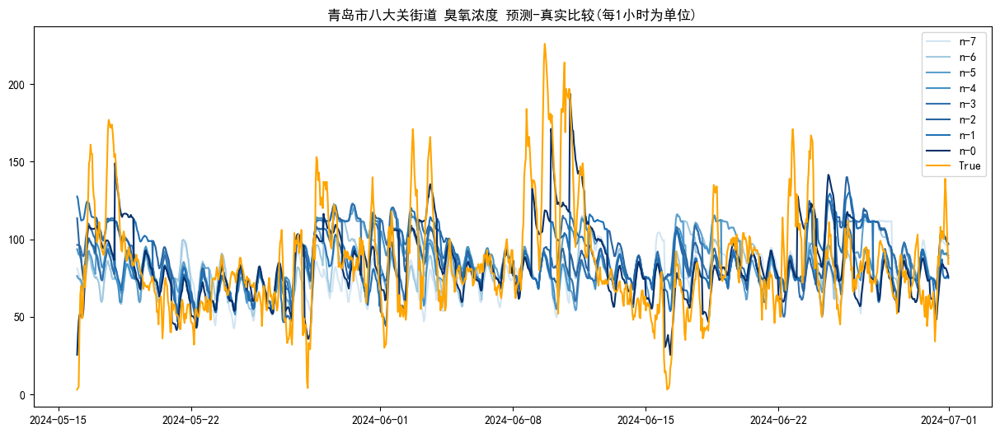

n-7 MASE: 34.59425129285216
n-7 R2: -0.039344099645731934
n-6 MASE: 33.85848833841885
n-6 R2: 0.004396047017231841
n-5 MASE: 33.391752674277875
n-5 R2: 0.031655448482665105
n-4 MASE: 32.79810160738994
n-4 R2: 0.06578056641386598
n-3 MASE: 31.74069384816895
n-3 R2: 0.12504782395833158
n-2 MASE: 32.21709968768285
n-2 R2: 0.09858586252274615
n-1 MASE: 31.049236406375297
n-1 R2: 0.16275351798596993
n-0 MASE: 24.540769335428944
n-0 R2: 0.4769685183786666


In [35]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
import matplotlib.dates as mdates
from datetime import datetime, timedelta
date_range_list = []
start_date111 = datetime(2024, 5, 16, 0, 0, 0) 
end_date111 = datetime(2024, 6, 30, 23, 0, 0)
true_value_list = []
date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
merged_data = pd.merge(pd.DataFrame(date_range111, columns=['日期']), datat, on='日期', how='inner')

true_value_list = merged_data['O3VAL'].tolist()

start_date = datetime(2024, 5, 16, 0, 0, 0) 
end_date = datetime(2024, 5, 16, 23, 0, 0)
while end_date < datetime(2024, 7, 1, 0, 0, 0):
    date_range = pd.date_range(start=start_date, end=end_date, freq='H')
    date_range_list.append(date_range)
    end_date += timedelta(hours=1)
    start_date = end_date
    end_date += timedelta(days=1)
    end_date -= timedelta(hours=1)

num = 0
colors = [
 '#d3e5f3','#a1cae1', 
    '#5d9fcd', '#4292c6',  '#3171ad',
    '#2864a0', '#2171b5',   '#08306b','orange'
]
true_legend_added = 0 
pred_value_list_7 = np.array([])
pred_value_list_6 = np.array([])
pred_value_list_5 = np.array([])
pred_value_list_4 = np.array([])
pred_value_list_3 = np.array([])
pred_value_list_2 = np.array([])
pred_value_list_1 = np.array([])
pred_value_list_0 = np.array([])

for date_ranges in date_range_list:
    num = 7
    for i in range(len(df_list)):
        is_in_list = df_list[i]['日期'].isin(date_ranges)
        rmse_list = []
        r2_list = []
        if is_in_list.any():
            matching_indices = df_list[i].index[is_in_list].tolist()
            matching_values = df_list[i].loc[is_in_list, '日期'].tolist()
            if num == 7:
                pred_value_list_7 = np.concatenate((pred_value_list_7, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 6:
                pred_value_list_6 = np.concatenate((pred_value_list_6, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 5:
                pred_value_list_5 = np.concatenate((pred_value_list_5, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 4:
                pred_value_list_4 = np.concatenate((pred_value_list_4, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 3:
                pred_value_list_3 = np.concatenate((pred_value_list_3, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 2:
                pred_value_list_2 = np.concatenate((pred_value_list_2, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 1:
                pred_value_list_1 = np.concatenate((pred_value_list_1, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 0:
                pred_value_list_0 = np.concatenate((pred_value_list_0, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            num-=1



plt.figure(figsize=(15, 6))
plt.title("青岛市八大关街道 臭氧浓度 预测-真实比较(每1小时为单位)")
plt.plot(date_range111,pred_value_list_7,color=colors[0], label='n-7')
plt.plot(date_range111,pred_value_list_6,color=colors[1], label='n-6')
plt.plot(date_range111,pred_value_list_5,color=colors[2], label='n-5')
plt.plot(date_range111,pred_value_list_4,color=colors[3], label='n-4')
plt.plot(date_range111,pred_value_list_3,color=colors[4], label='n-3')
plt.plot(date_range111,pred_value_list_2,color=colors[5], label='n-2')
plt.plot(date_range111,pred_value_list_1,color=colors[6], label='n-1')
plt.plot(date_range111,pred_value_list_0,color=colors[7], label='n-0')
plt.plot(date_range111,true_value_list,color=colors[-1], label='True')
plt.legend()
plt.show()   


print('n-7 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_7)))
print('n-7 R2:',r2_score(true_value_list, pred_value_list_7))
print('n-6 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_6)))
print('n-6 R2:',r2_score(true_value_list, pred_value_list_6))
print('n-5 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_5)))
print('n-5 R2:',r2_score(true_value_list, pred_value_list_5))
print('n-4 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_4)))
print('n-4 R2:',r2_score(true_value_list, pred_value_list_4))
print('n-3 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_3)))
print('n-3 R2:',r2_score(true_value_list, pred_value_list_3))
print('n-2 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_2)))
print('n-2 R2:',r2_score(true_value_list, pred_value_list_2))
print('n-1 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_1)))
print('n-1 R2:',r2_score(true_value_list, pred_value_list_1))
print('n-0 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_0)))
print('n-0 R2:',r2_score(true_value_list, pred_value_list_0))

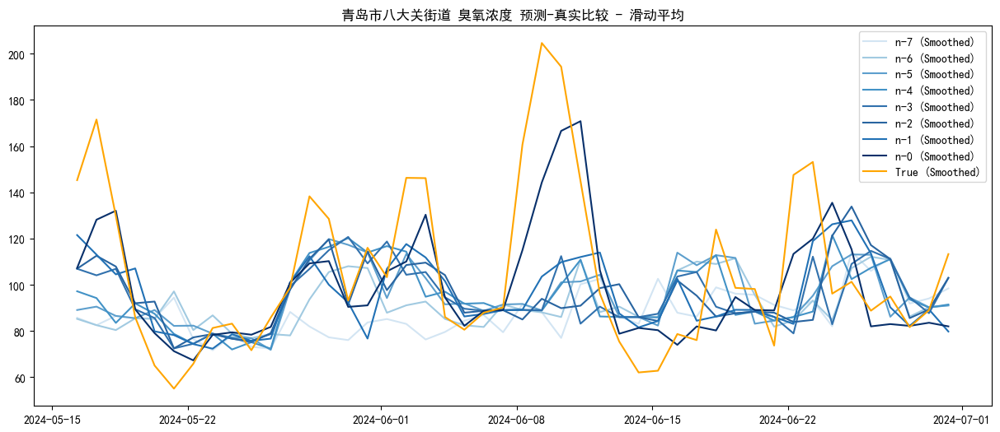

n-7 RMSE: 41.22496086680917
n-7 R2: -0.357498496989479
n-6 RMSE: 39.11480409742003
n-6 R2: -0.22208432092407904
n-5 RMSE: 36.012156398160826
n-5 R2: -0.03589827164930748
n-4 RMSE: 35.921977464856404
n-4 R2: -0.030716730327232877
n-3 RMSE: 34.39971501598597
n-3 R2: 0.054789488576777456
n-2 RMSE: 35.69900931684702
n-2 R2: -0.01796109836022519
n-1 RMSE: 32.10206650410485
n-1 R2: 0.17683891009623576
n-0 RMSE: 22.278062529772782
n-0 R2: 0.6035634477707713


In [36]:
def sliding_window_average(data, window_size):
    # 保存滑动平均值的列表
    averaged_data = []
    # 用滑动窗口计算平均值
    len1 = len(data)
    for i in range(len1 - window_size + 1):
        avg = np.mean(data[i:i + window_size])
        averaged_data.append(avg)
    return averaged_data


def max_values(data, interval):
    averaged_data = []
    for i in range(0, len(data), 16):
        avg = max(data[i:i+interval])
        averaged_data.append(avg)
    return averaged_data
# 使用滑动窗口大小为8来计算滑动平均值
window_size = 8

# 对每个预测值列表应用滑动窗口函数
smoothed_pred_value_list_7 = sliding_window_average(pred_value_list_7, window_size)
smoothed_pred_value_list_6 = sliding_window_average(pred_value_list_6, window_size)
smoothed_pred_value_list_5 = sliding_window_average(pred_value_list_5, window_size)
smoothed_pred_value_list_4 = sliding_window_average(pred_value_list_4, window_size)
smoothed_pred_value_list_3 = sliding_window_average(pred_value_list_3, window_size)
smoothed_pred_value_list_2 = sliding_window_average(pred_value_list_2, window_size)
smoothed_pred_value_list_1 = sliding_window_average(pred_value_list_1, window_size)
smoothed_pred_value_list_0 = sliding_window_average(pred_value_list_0, window_size)

# 对真实值列表应用滑动窗口函数
smoothed_true_value_list = sliding_window_average(true_value_list, window_size)

# 再次应用 max_values 函数
interval = 24
smoothed_pred_value_list_7 = max_values(smoothed_pred_value_list_7, interval)
smoothed_pred_value_list_6 = max_values(smoothed_pred_value_list_6, interval)
smoothed_pred_value_list_5 = max_values(smoothed_pred_value_list_5, interval)
smoothed_pred_value_list_4 = max_values(smoothed_pred_value_list_4, interval)
smoothed_pred_value_list_3 = max_values(smoothed_pred_value_list_3, interval)
smoothed_pred_value_list_2 = max_values(smoothed_pred_value_list_2, interval)
smoothed_pred_value_list_1 = max_values(smoothed_pred_value_list_1, interval)
smoothed_pred_value_list_0 = max_values(smoothed_pred_value_list_0, interval)

# 由于 max_values 可能会减少列表长度，我们也需要对 smoothed_true_value_list 应用相同的操作
smoothed_true_value_list = max_values(smoothed_true_value_list, interval)

# 获取用于绘图的时间范围，减去窗口大小 + 1，以匹配滑动平均后的长度
# 并且需要进一步减去由 max_values 函数导致的长度减少
smoothed_date_range111 = date_range111[window_size - 1::interval]

plt.figure(figsize=(15, 6))
plt.title("青岛市八大关街道 臭氧浓度 预测-真实比较 - 滑动平均")
plt.plot(smoothed_date_range111, smoothed_pred_value_list_7, color=colors[0], label='n-7 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_6, color=colors[1], label='n-6 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_5, color=colors[2], label='n-5 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_4, color=colors[3], label='n-4 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_3, color=colors[4], label='n-3 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_2, color=colors[5], label='n-2 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_1, color=colors[6], label='n-1 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_0, color=colors[7], label='n-0 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_true_value_list, color=colors[-1], label='True (Smoothed)')
plt.legend()
plt.show()

# 计算滑动平均后的性能指标
print('n-7 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_7)))
print('n-7 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_7))
print('n-6 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_6)))
print('n-6 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_6))
print('n-5 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_5)))
print('n-5 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_5))
print('n-4 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_4)))
print('n-4 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_4))
print('n-3 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_3)))
print('n-3 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_3))
print('n-2 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_2)))
print('n-2 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_2))
print('n-1 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_1)))
print('n-1 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_1))
print('n-0 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_0)))
print('n-0 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_0))

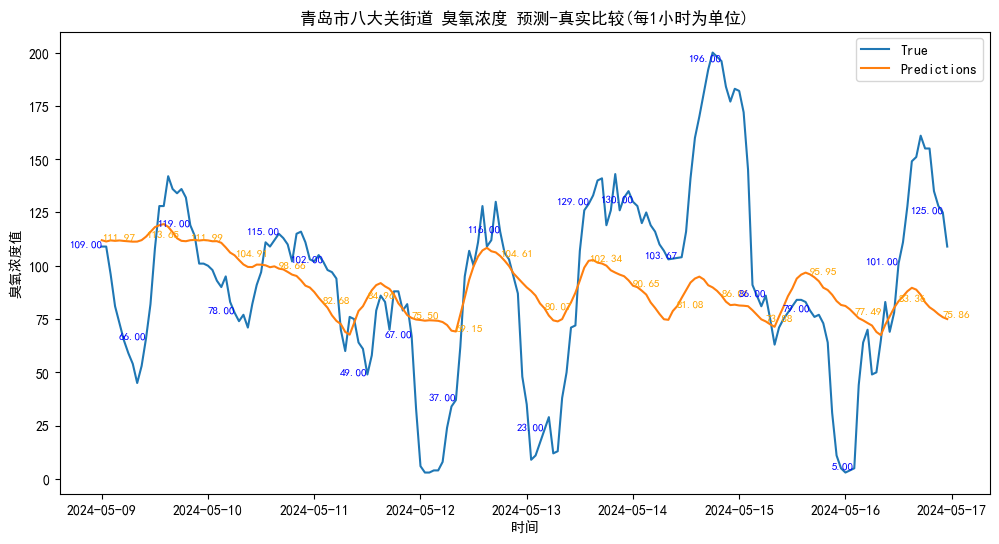

rmse: 41.410661621200525
r2 score: 0.10104758788572099
all
rmse: 41.410661621200525
r2 score: 0.10104758788572099
all-1
rmse: 40.394866832877696
r2 score: 0.12381909024118942
all-2
rmse: 32.36317608424173
r2 score: 0.24410354579247884


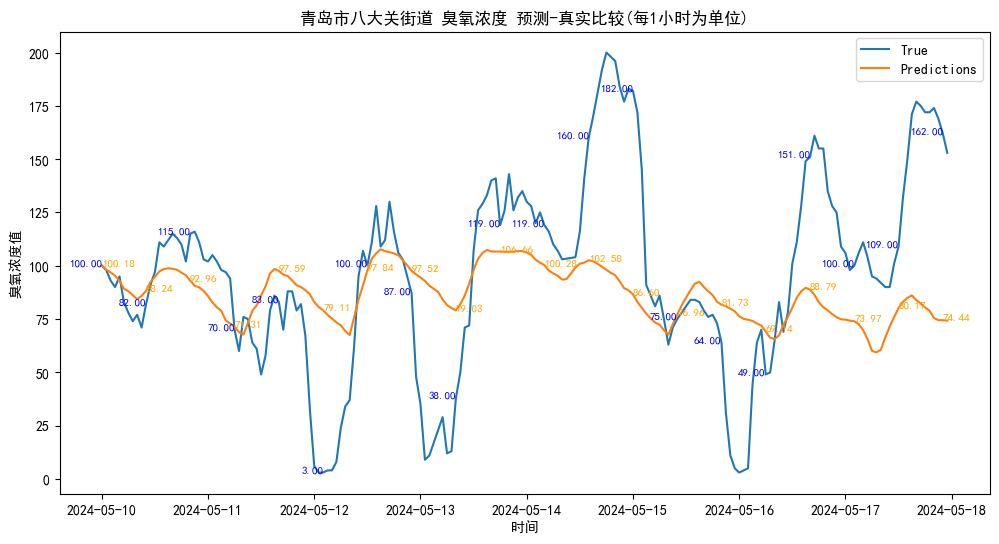

rmse: 43.904740960767924
r2 score: 0.07631939315417524
all
rmse: 43.904740960767924
r2 score: 0.07631939315417524
all-1
rmse: 39.465829971487004
r2 score: 0.21536447224189836
all-2
rmse: 39.670245607607654
r2 score: 0.23223093427783603


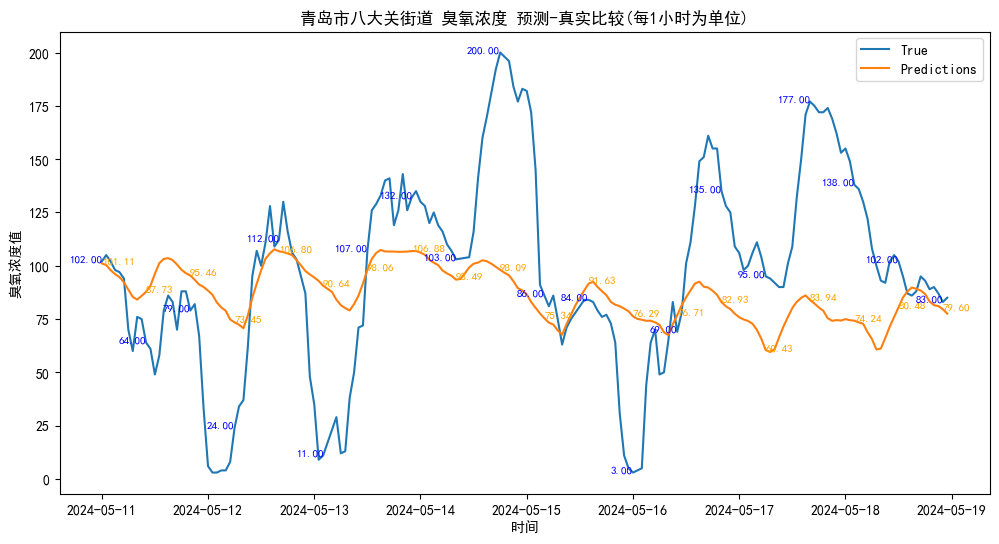

rmse: 45.78765574161585
r2 score: 0.013776696283780976
all
rmse: 45.78765574161585
r2 score: 0.013776696283780976
all-1
rmse: 43.78079111386055
r2 score: 0.1826435185049089
all-2
rmse: 43.53592051857005
r2 score: 0.1878157732635658


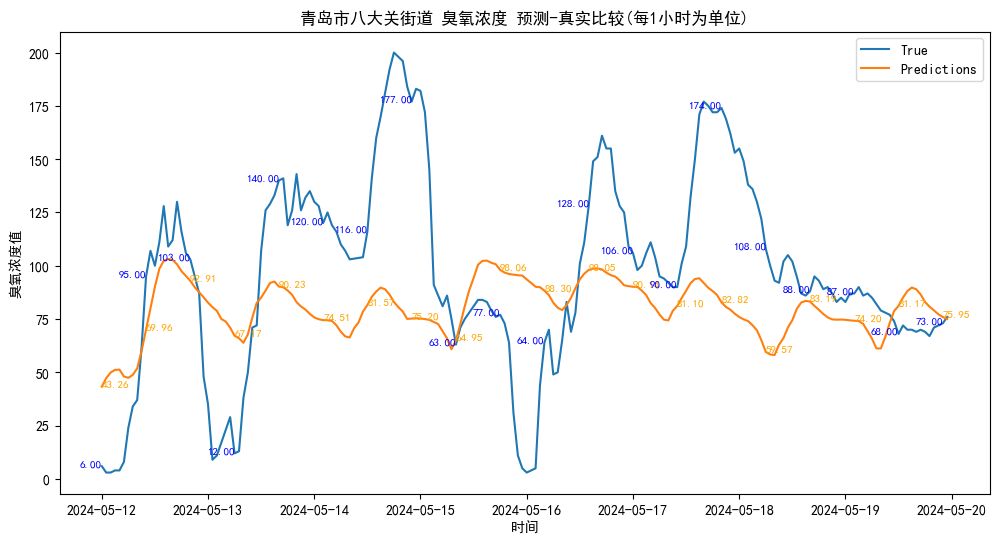

rmse: 46.58868342842938
r2 score: -0.03456751022442539
all
rmse: 46.58868342842938
r2 score: -0.03456751022442539
all-1
rmse: 51.007900966922
r2 score: 0.011148666824093767
all-2
rmse: 50.19243728338553
r2 score: 0.07092143843295184


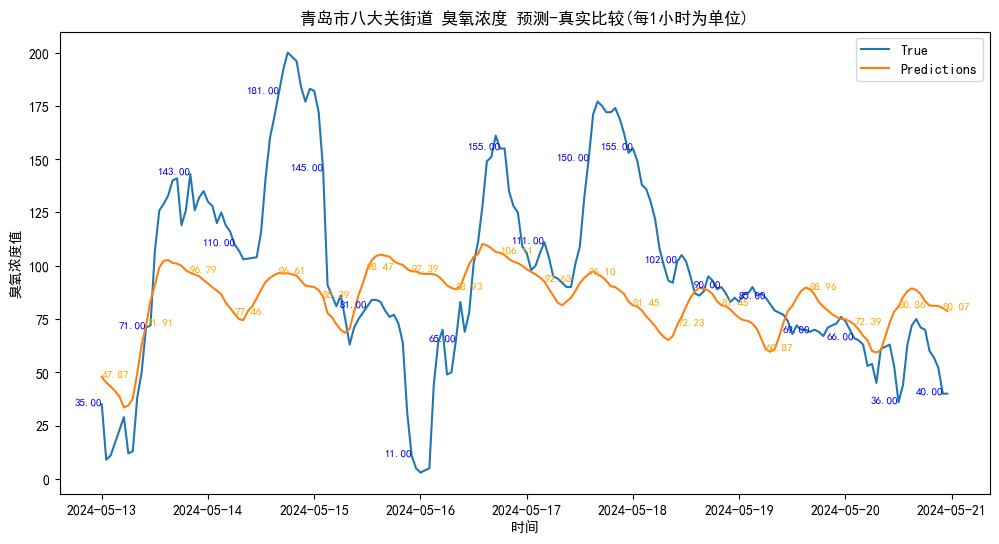

rmse: 40.684558631779396
r2 score: 0.1405307779908327
all
rmse: 40.684558631779396
r2 score: 0.1405307779908327
all-1
rmse: 45.727975128173405
r2 score: 0.031234981996092426
all-2
rmse: 47.58427110025456
r2 score: 0.0944066144748642


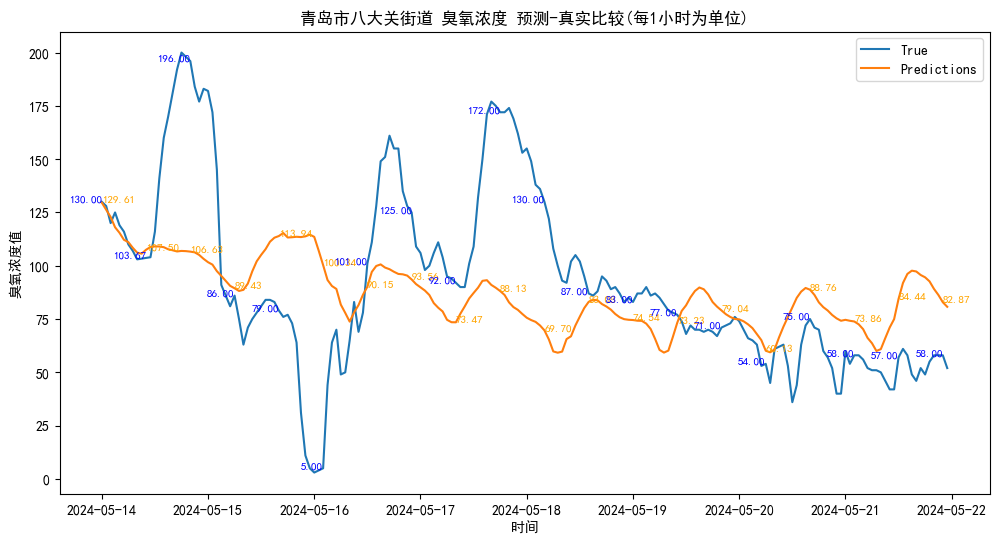

rmse: 41.139394935863066
r2 score: 0.05074349666860456
all
rmse: 41.139394935863066
r2 score: 0.05074349666860456
all-1
rmse: 45.16520069113064
r2 score: -0.16257712477501896
all-2
rmse: 49.030575935824764
r2 score: -0.25956419804813113


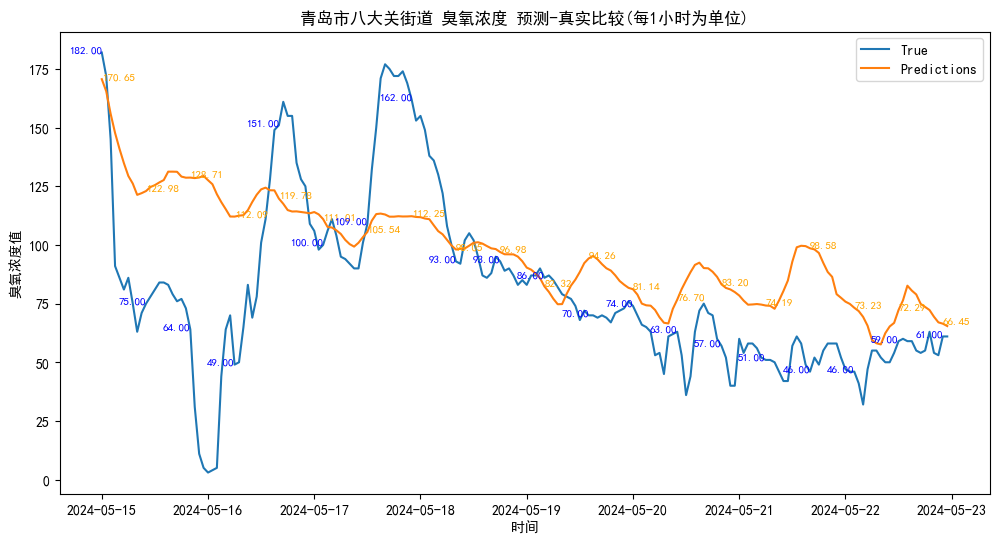

rmse: 36.74841492227378
r2 score: 0.0057607996578112886
all
rmse: 36.74841492227378
r2 score: 0.0057607996578112886
all-1
rmse: 39.416439171066095
r2 score: -0.07270771932333941
all-2
rmse: 41.73625995271851
r2 score: -0.18267904022933923


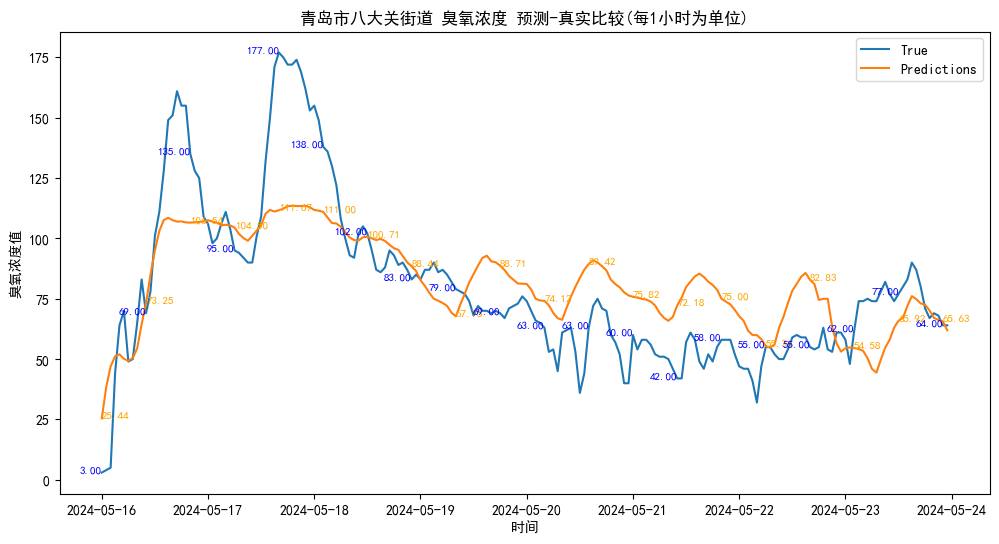

rmse: 22.975505287791734
r2 score: 0.5542079044923452
all
rmse: 22.975505287791734
r2 score: 0.5542079044923452
all-1
rmse: 24.61939079669126
r2 score: 0.565054681410857
all-2
rmse: 24.82312926193463
r2 score: 0.5635597044385898


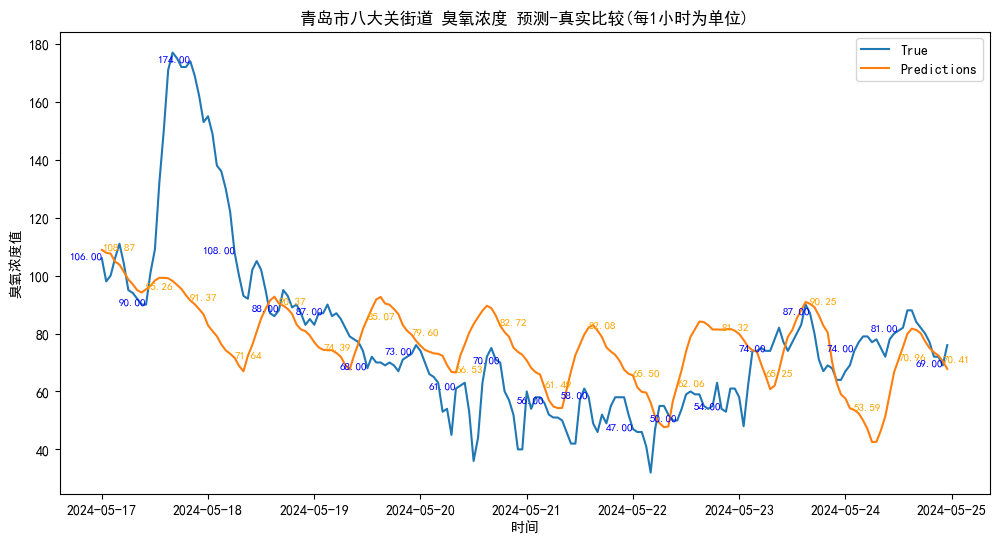

rmse: 25.904508606308838
r2 score: 0.22791189556056135
all
rmse: 25.904508606308838
r2 score: 0.22791189556056135
all-1
rmse: 28.61913044929073
r2 score: 0.2777347347276825
all-2
rmse: 30.131485718509175
r2 score: 0.23327307385791196


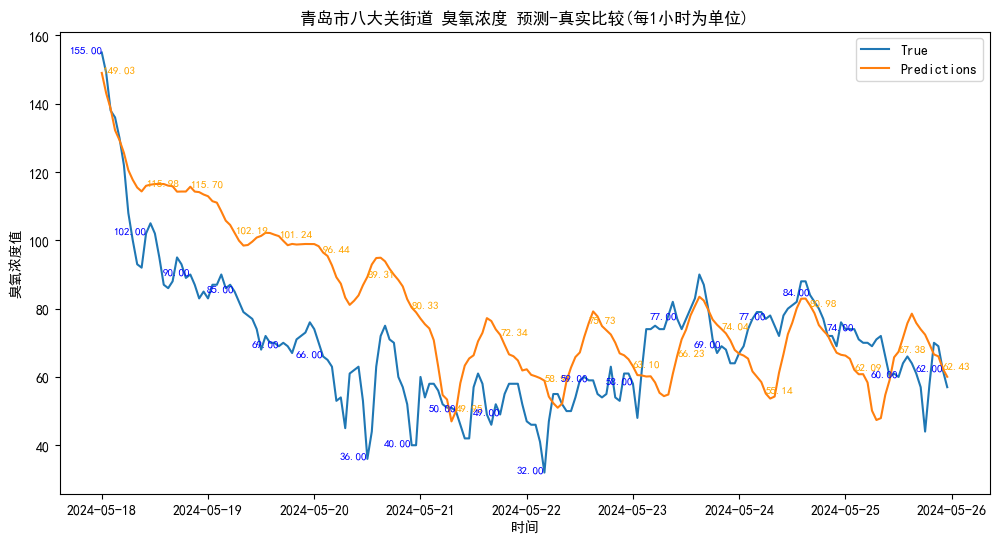

rmse: 19.29882431175909
r2 score: -0.026126204232628902
all
rmse: 19.29882431175909
r2 score: -0.026126204232628902
all-1
rmse: 21.12108450027579
r2 score: 0.0260198136995744
all-2
rmse: 22.594316537644158
r2 score: 0.03727041634119088


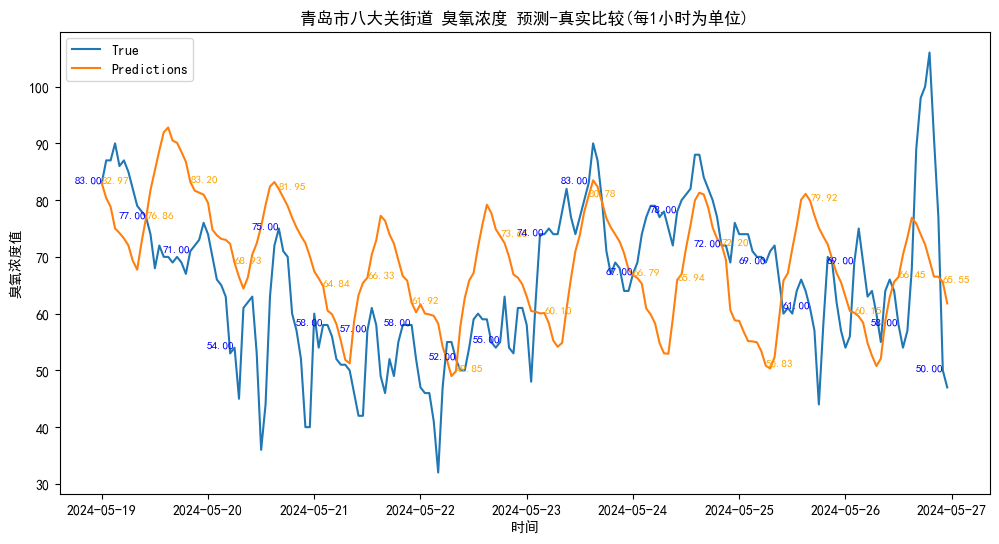

rmse: 14.658032737782293
r2 score: -0.25024663920851165
all
rmse: 14.658032737782293
r2 score: -0.25024663920851165
all-1
rmse: 14.416611067719158
r2 score: -0.18539298483832356
all-2
rmse: 14.7301946076337
r2 score: -0.27927343386336934


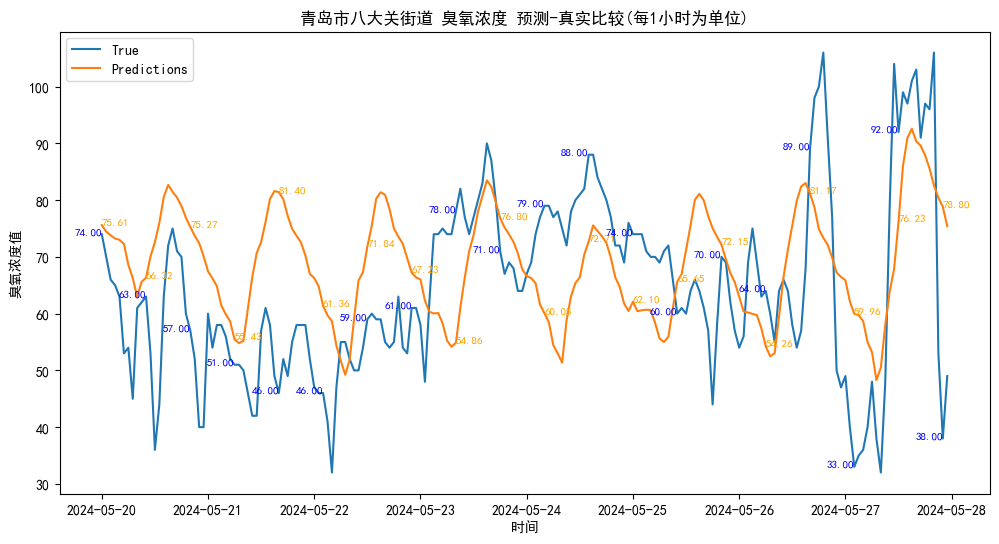

rmse: 16.11211029609707
r2 score: -0.03879399831281227
all
rmse: 16.11211029609707
r2 score: -0.03879399831281227
all-1
rmse: 15.48549595987601
r2 score: -0.6074520183297838
all-2
rmse: 15.833920832607747
r2 score: -0.4892468289396401


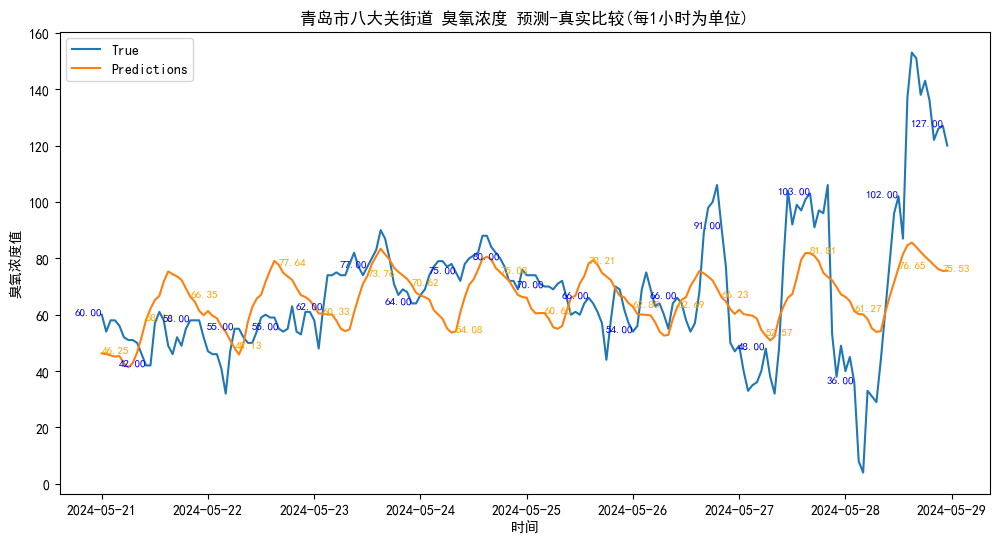

rmse: 20.170523141272472
r2 score: 0.2831185663760515
all
rmse: 20.170523141272472
r2 score: 0.2831185663760515
all-1
rmse: 13.166773511618043
r2 score: -0.015687436117166165
all-2
rmse: 12.777368861077957
r2 score: -0.09675573761834522


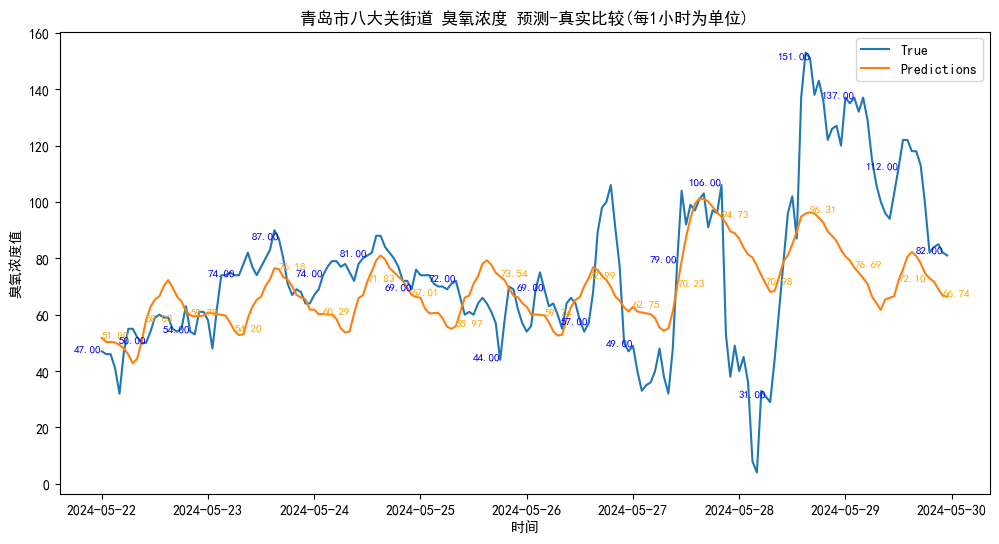

rmse: 24.09477888654459
r2 score: 0.22890863757309066
all
rmse: 24.09477888654459
r2 score: 0.22890863757309066
all-1
rmse: 14.282738664765999
r2 score: 0.25028038838486455
all-2
rmse: 12.44490932392083
r2 score: 0.059052551219484495


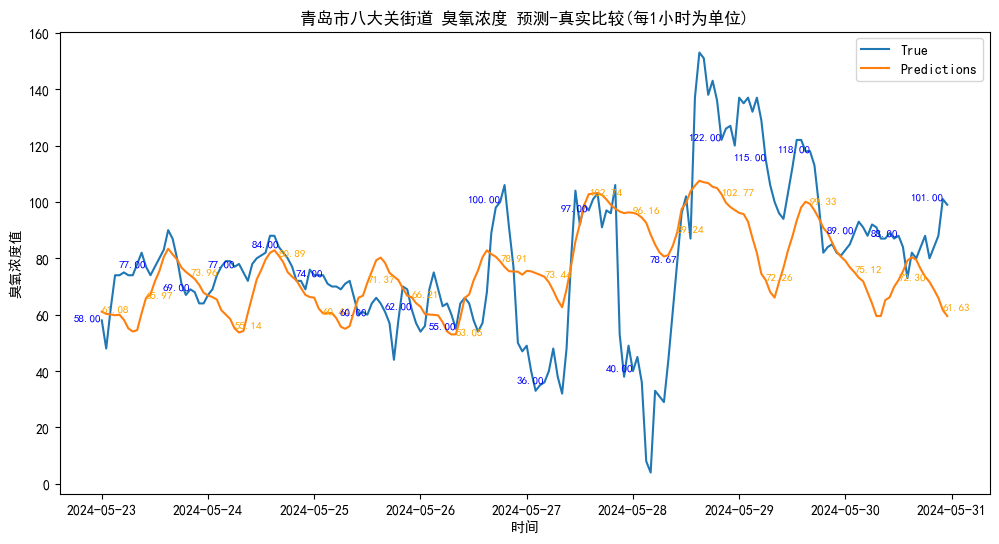

rmse: 23.947269553907972
r2 score: 0.1694826941187999
all
rmse: 23.947269553907972
r2 score: 0.1694826941187999
all-1
rmse: 23.333083398290803
r2 score: 0.15674637192442387
all-2
rmse: 16.816842650101407
r2 score: -0.06220062952096339


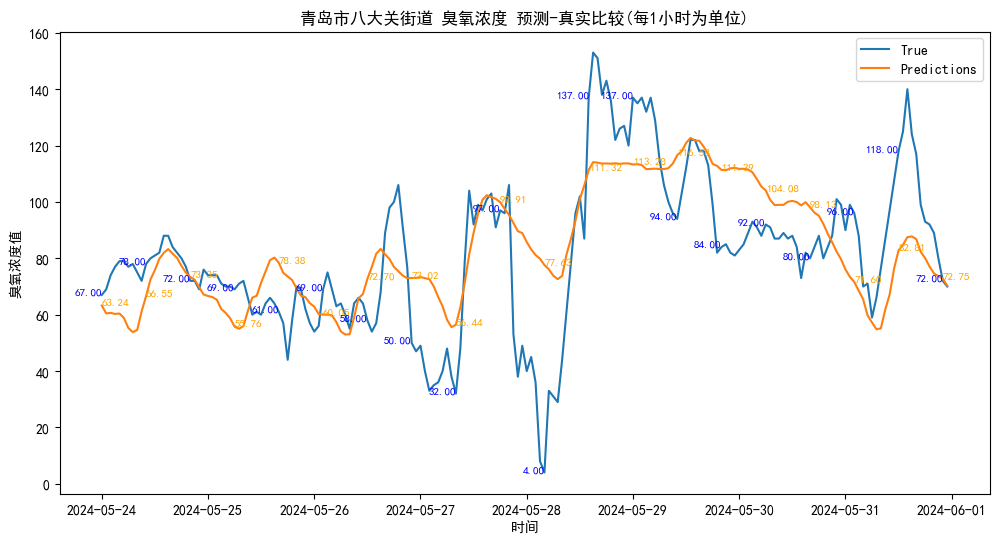

rmse: 21.042822252615053
r2 score: 0.40509755245593204
all
rmse: 21.042822252615053
r2 score: 0.40509755245593204
all-1
rmse: 21.191097459492273
r2 score: 0.491724659431505
all-2
rmse: 21.585656104321963
r2 score: 0.3850768337651922


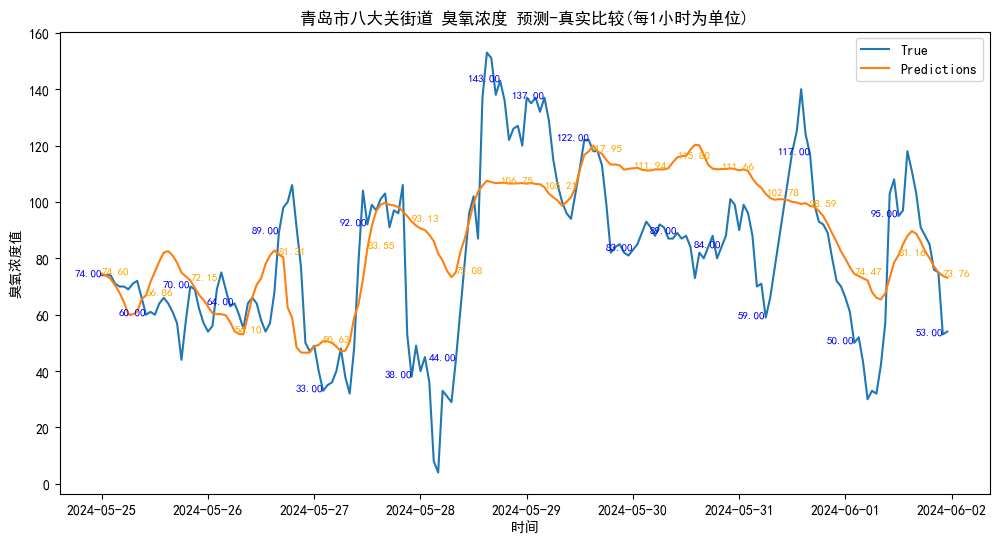

rmse: 24.019509411234004
r2 score: 0.3137236841819472
all
rmse: 24.019509411234004
r2 score: 0.3137236841819472
all-1
rmse: 24.613446282423006
r2 score: 0.3212690165163118
all-2
rmse: 23.99455682825477
r2 score: 0.4536382657022632


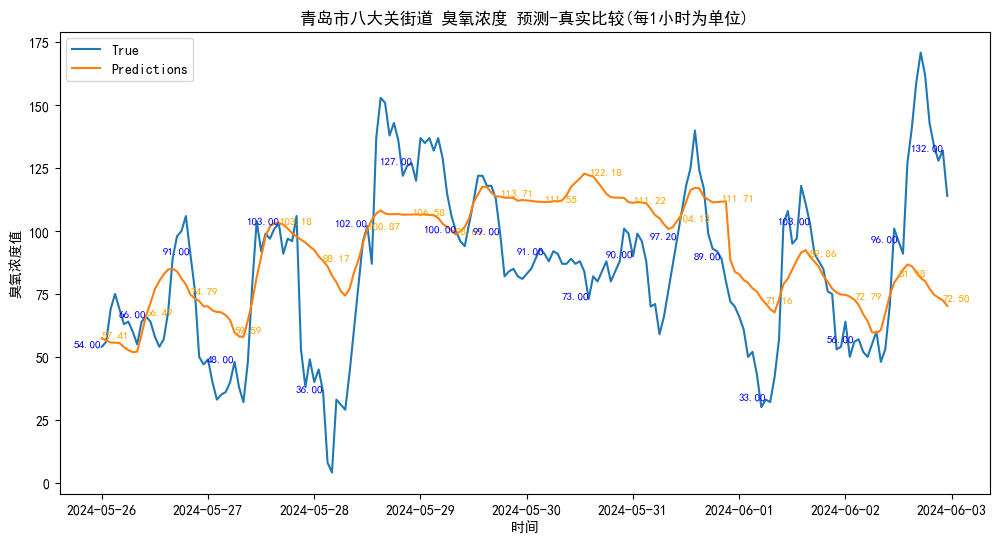

rmse: 28.561740311591254
r2 score: 0.21050302067238857
all
rmse: 28.561740311591254
r2 score: 0.21050302067238857
all-1
rmse: 26.363815725434065
r2 score: 0.24336217049649
all-2
rmse: 27.08207361134509
r2 score: 0.26969867691774574


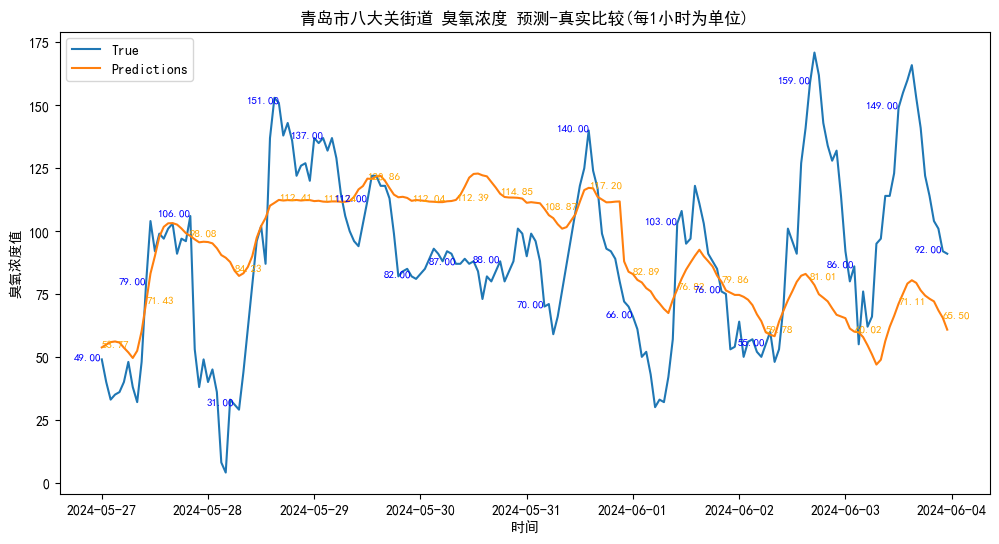

rmse: 33.50740106762315
r2 score: 0.01350707403013629
all
rmse: 33.50740106762315
r2 score: 0.01350707403013629
all-1
rmse: 27.18199107328838
r2 score: 0.24710604390943103
all-2
rmse: 27.937596408060198
r2 score: 0.2088910928485329


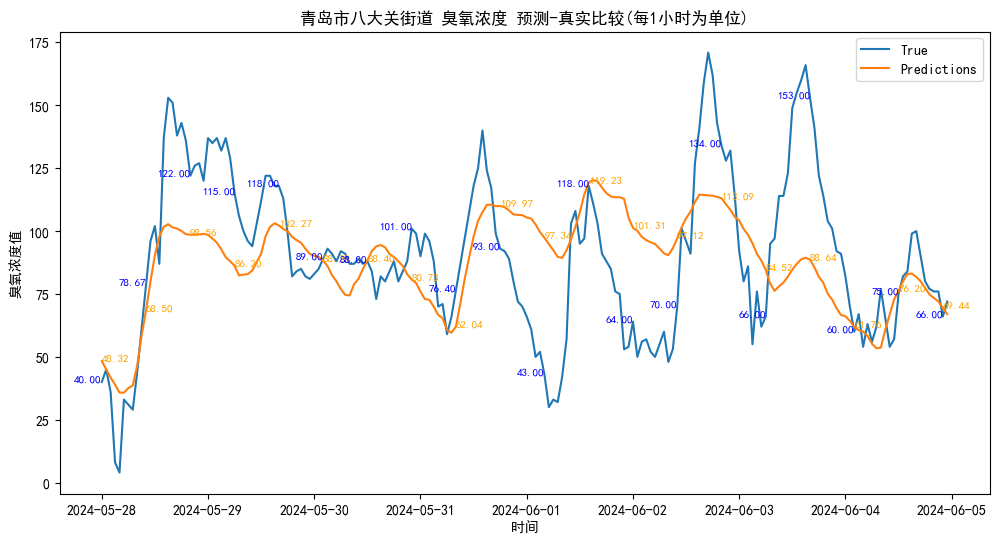

rmse: 28.28129605536431
r2 score: 0.22136892424563637
all
rmse: 28.28129605536431
r2 score: 0.22136892424563637
all-1
rmse: 27.694316188734664
r2 score: 0.2832016416031097
all-2
rmse: 26.096816982716568
r2 score: 0.26835046881173297


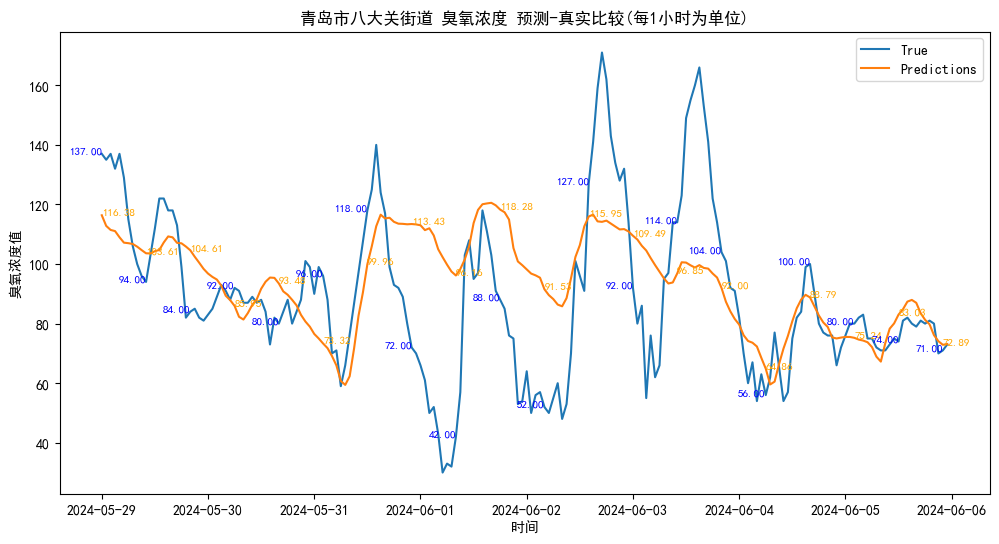

rmse: 25.065834331102334
r2 score: 0.16705082612512023
all
rmse: 25.065834331102334
r2 score: 0.16705082612512023
all-1
rmse: 28.624063585022327
r2 score: 0.0663020095982414
all-2
rmse: 27.376085625144185
r2 score: 0.0711880223540392


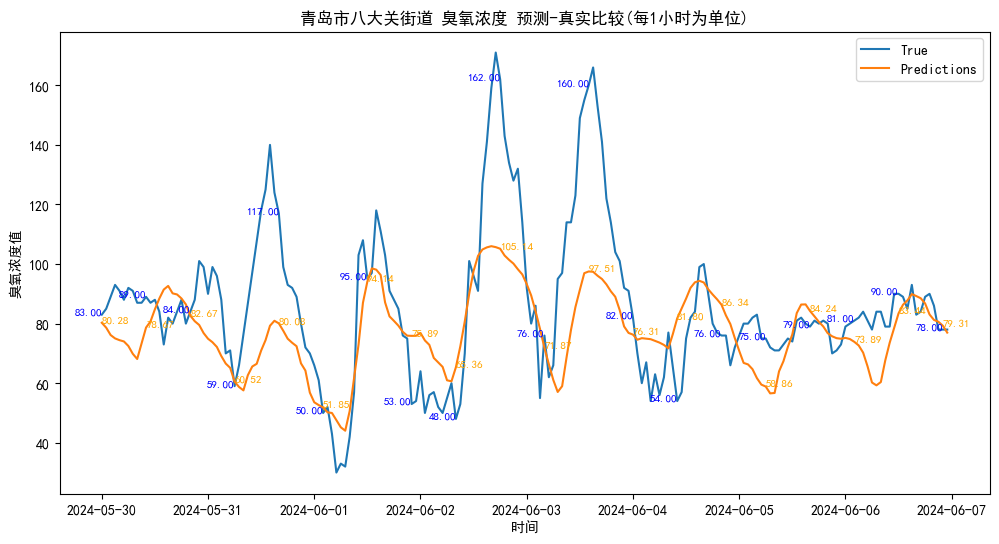

rmse: 21.339910977514577
r2 score: 0.3035173459144752
all
rmse: 21.339910977514577
r2 score: 0.3035173459144752
all-1
rmse: 23.936016140501685
r2 score: 0.32238947239787996
all-2
rmse: 25.568417556704443
r2 score: 0.29255293055190357


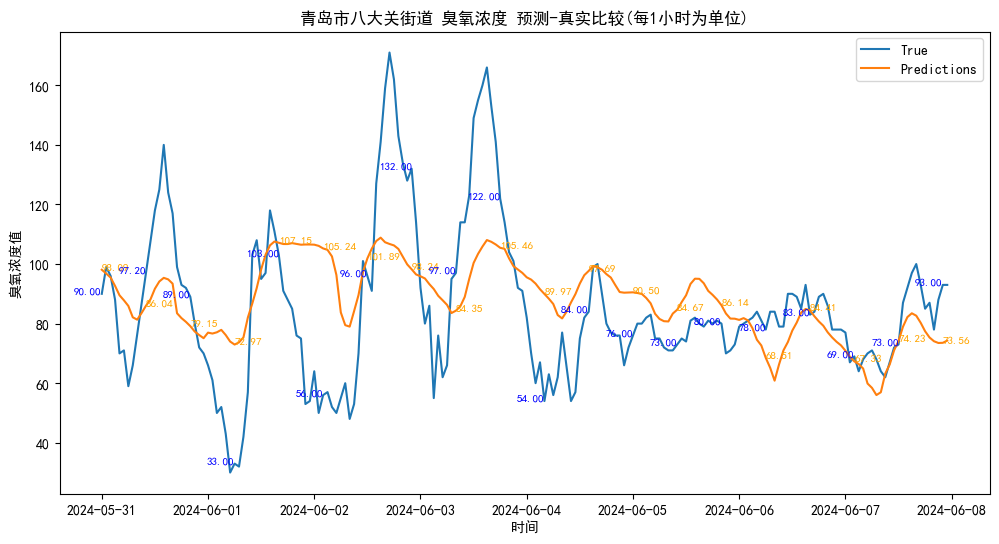

rmse: 22.884324875372325
r2 score: 0.22216401780272022
all
rmse: 22.884324875372325
r2 score: 0.22216401780272022
all-1
rmse: 25.79551613187119
r2 score: 0.22737584630838237
all-2
rmse: 27.834720132610645
r2 score: 0.2310809901919666


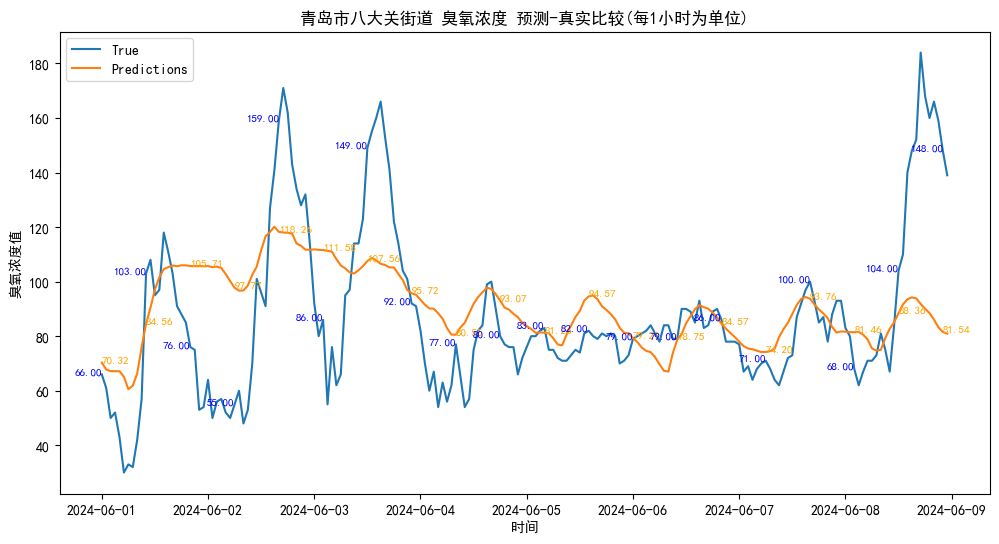

rmse: 26.6066888397713
r2 score: 0.21186845846032099
all
rmse: 26.6066888397713
r2 score: 0.21186845846032099
all-1
rmse: 24.189685664082297
r2 score: 0.2566770677547602
all-2
rmse: 26.3078975410821
r2 score: 0.2636936339731456


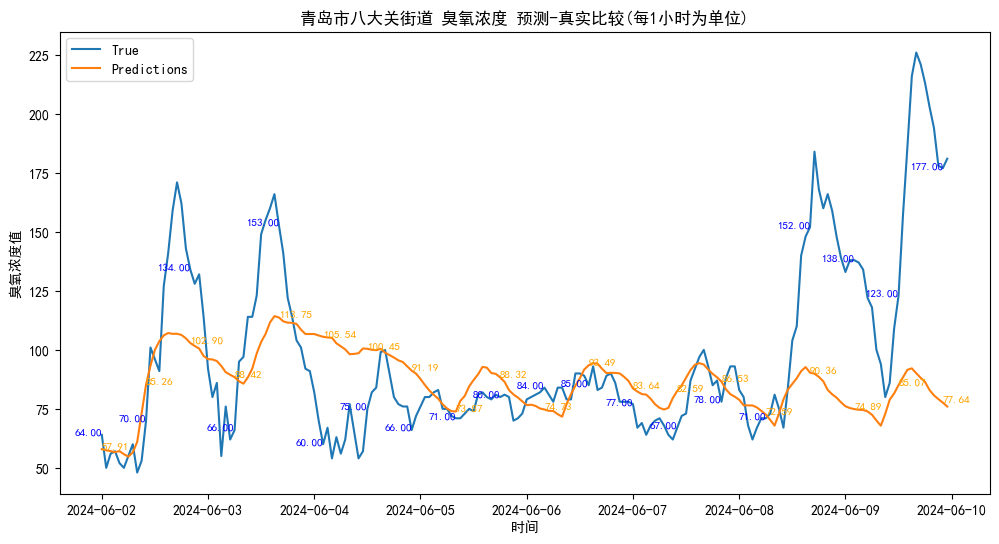

rmse: 38.23440572470575
r2 score: -0.005442597000767657
all
rmse: 38.23440572470575
r2 score: -0.005442597000767657
all-1
rmse: 20.765513287424547
r2 score: 0.35292973687108553
all-2
rmse: 22.278801758562793
r2 score: 0.3450742651352128


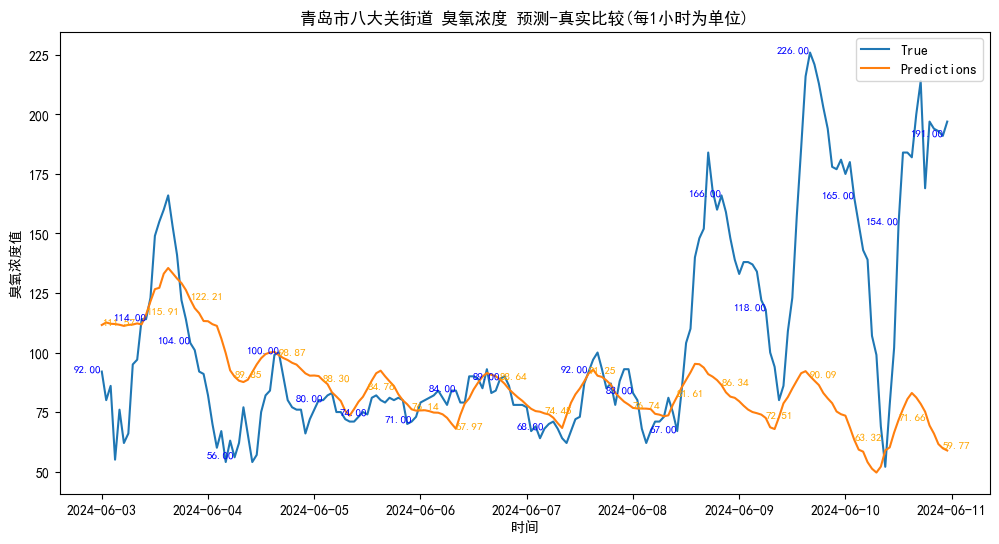

rmse: 50.27297086603453
r2 score: -0.3610340769488596
all
rmse: 50.27297086603453
r2 score: -0.3610340769488596
all-1
rmse: 24.814816213074202
r2 score: 0.16099557090847771
all-2
rmse: 18.121467385485765
r2 score: 0.23492752974285203


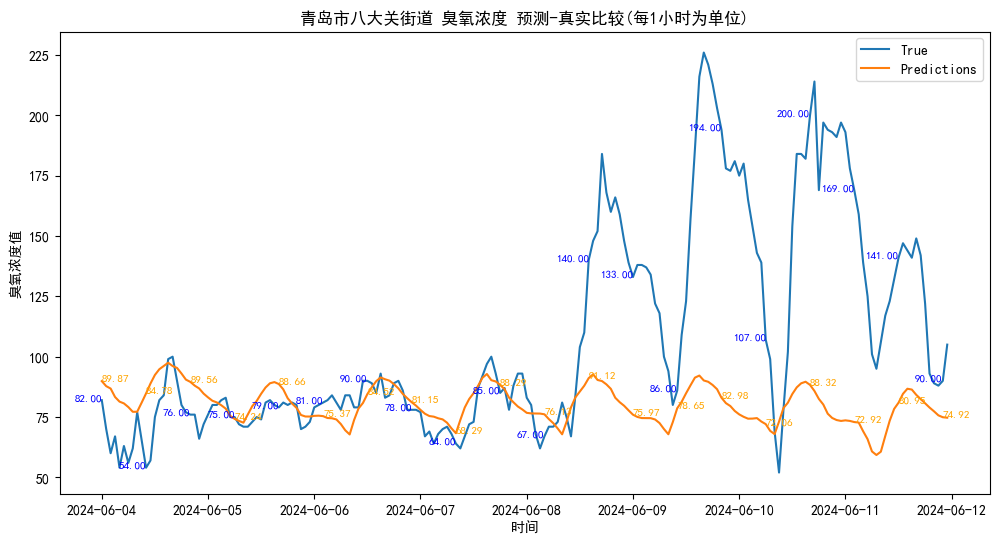

rmse: 51.03243020426033
r2 score: -0.370832416386945
all
rmse: 51.03243020426033
r2 score: -0.370832416386945
all-1
rmse: 39.62863477541575
r2 score: -0.07368503331405996
all-2
rmse: 22.969726734997693
r2 score: 0.0989619066184163


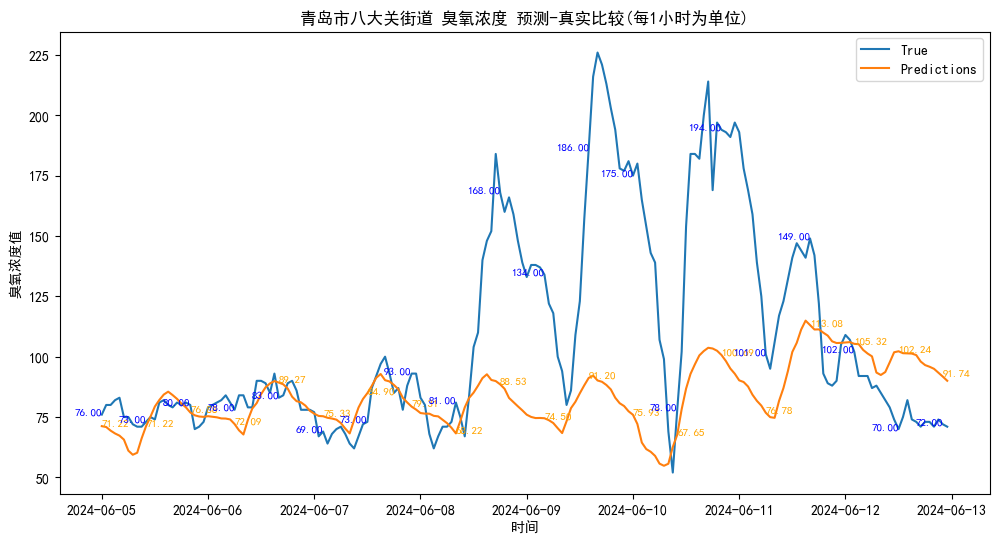

rmse: 47.74492069153188
r2 score: -0.24899828446852634
all
rmse: 47.74492069153188
r2 score: -0.24899828446852634
all-1
rmse: 51.24477985175054
r2 score: -0.25831629459644967
all-2
rmse: 42.77635792976603
r2 score: -0.14791646971067718


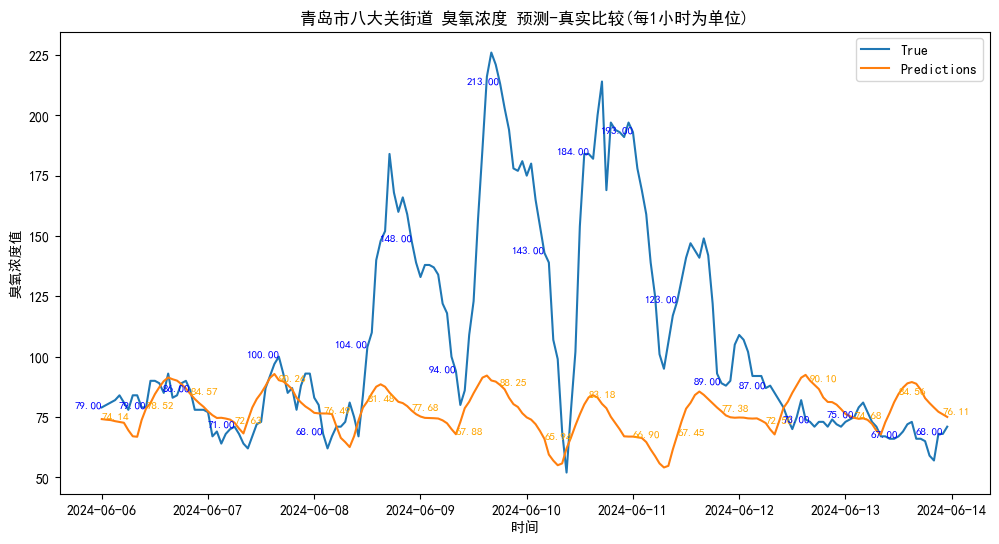

rmse: 53.22193298787868
r2 score: -0.49849471763774966
all
rmse: 53.22193298787868
r2 score: -0.49849471763774966
all-1
rmse: 60.835198145559005
r2 score: -0.8230370845200281
all-2
rmse: 60.05732615194229
r2 score: -0.6072906432537613


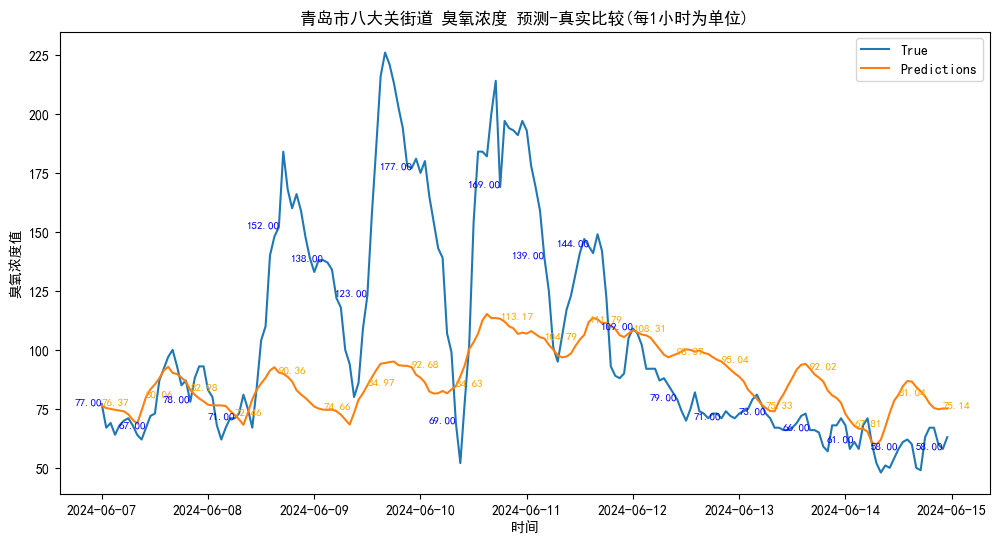

rmse: 43.87030132565448
r2 score: 0.08605072025652127
all
rmse: 43.87030132565448
r2 score: 0.08605072025652127
all-1
rmse: 49.65449169234307
r2 score: -0.1929976903279511
all-2
rmse: 53.70929014645857
r2 score: -0.3462654902743214


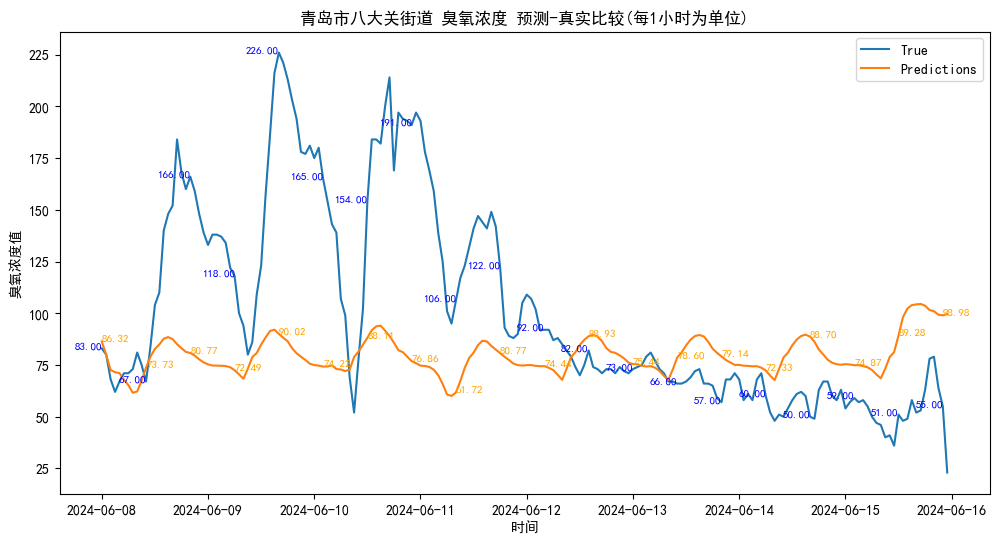

rmse: 53.22955366566055
r2 score: -0.20963021089681777
all
rmse: 53.22955366566055
r2 score: -0.20963021089681777
all-1
rmse: 58.859291082854384
r2 score: -0.5911489159961159
all-2
rmse: 64.21231790471131
r2 score: -0.983293119187538


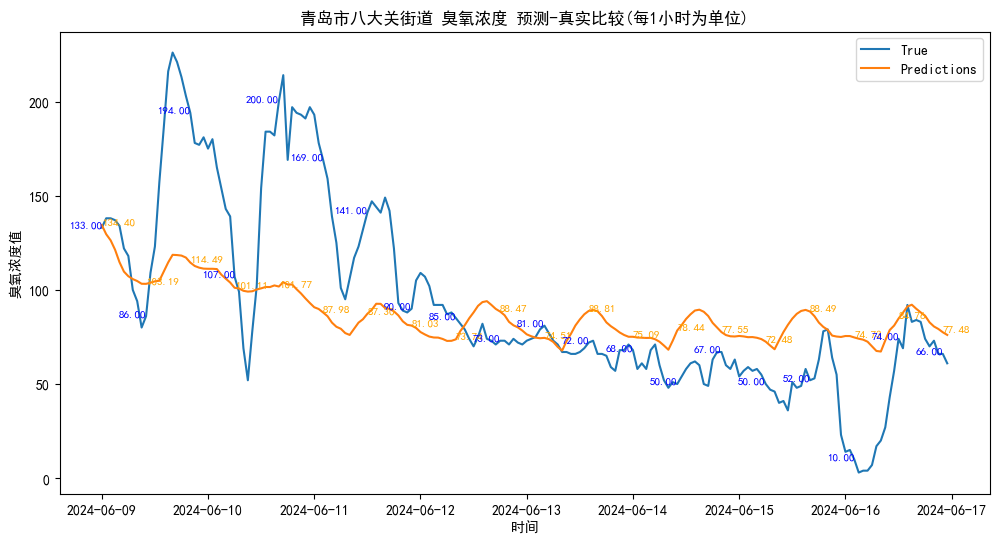

rmse: 41.967775424902975
r2 score: 0.3105299835383263
all
rmse: 41.967775424902975
r2 score: 0.3105299835383263
all-1
rmse: 43.96399506021384
r2 score: 0.18705828839736127
all-2
rmse: 47.20069895790197
r2 score: 0.01990654019396476


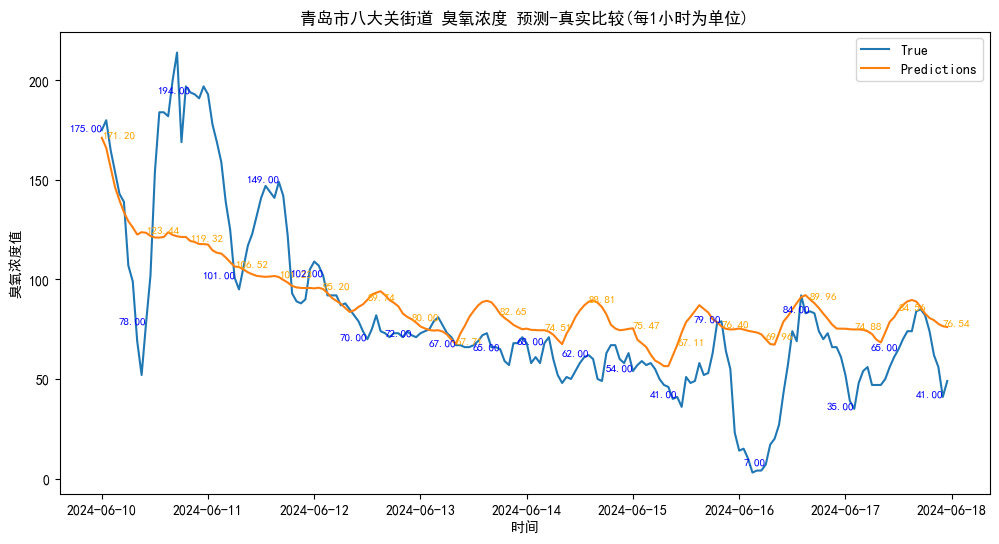

rmse: 30.813565643334766
r2 score: 0.5014961476006699
all
rmse: 30.813565643334766
r2 score: 0.5014961476006699
all-1
rmse: 30.064746264328665
r2 score: 0.5391227748044246
all-2
rmse: 31.228806278027804
r2 score: 0.5064440191319199


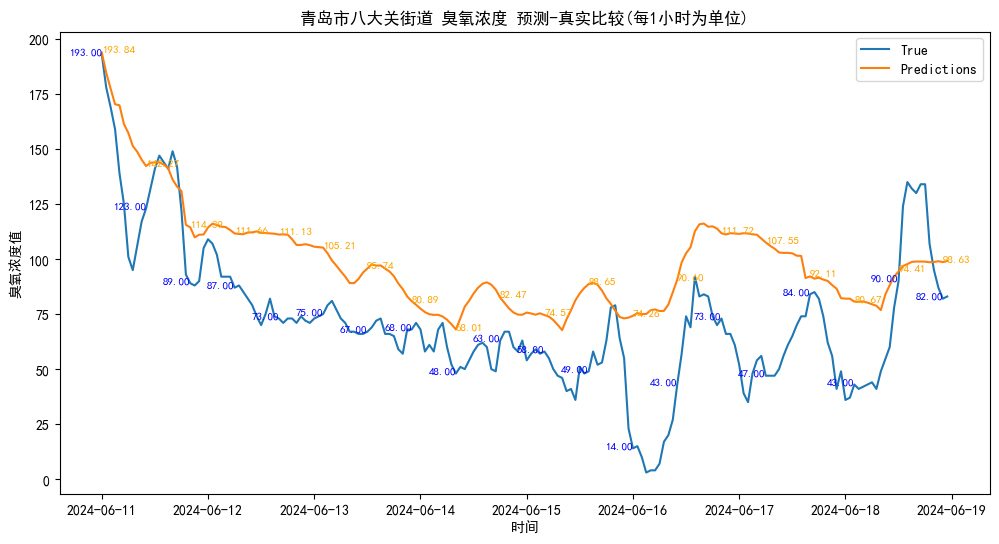

rmse: 33.86171846648906
r2 score: -0.0970233516589396
all
rmse: 33.86171846648906
r2 score: -0.0970233516589396
all-1
rmse: 31.885728126128992
r2 score: 0.07774921210106633
all-2
rmse: 26.201859857066474
r2 score: 0.28612014851909484


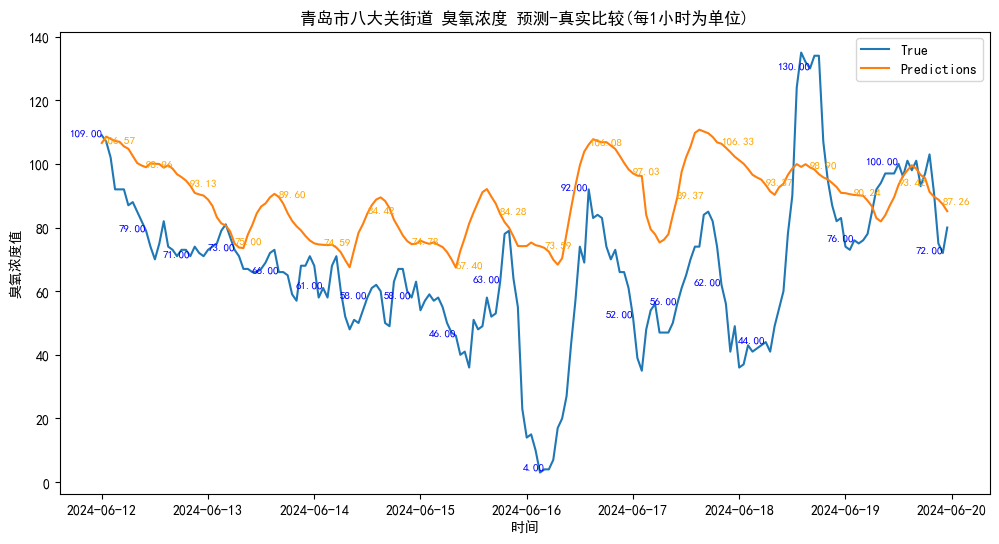

rmse: 30.040321480418626
r2 score: -0.6011804229229949
all
rmse: 30.040321480418626
r2 score: -0.6011804229229949
all-1
rmse: 30.52237395929302
r2 score: -1.4354236356582653
all-2
rmse: 28.43107731891918
r2 score: -0.9380498962712505


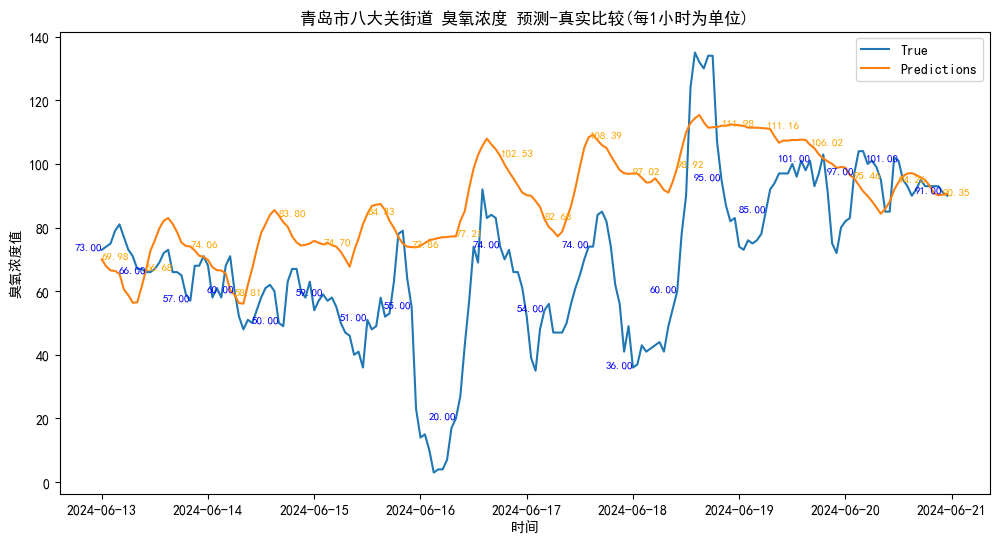

rmse: 28.899635479350557
r2 score: -0.3643722497902109
all
rmse: 28.899635479350557
r2 score: -0.3643722497902109
all-1
rmse: 31.951518828232906
r2 score: -0.8216290679009188
all-2
rmse: 30.650305009579224
r2 score: -1.837914662426999


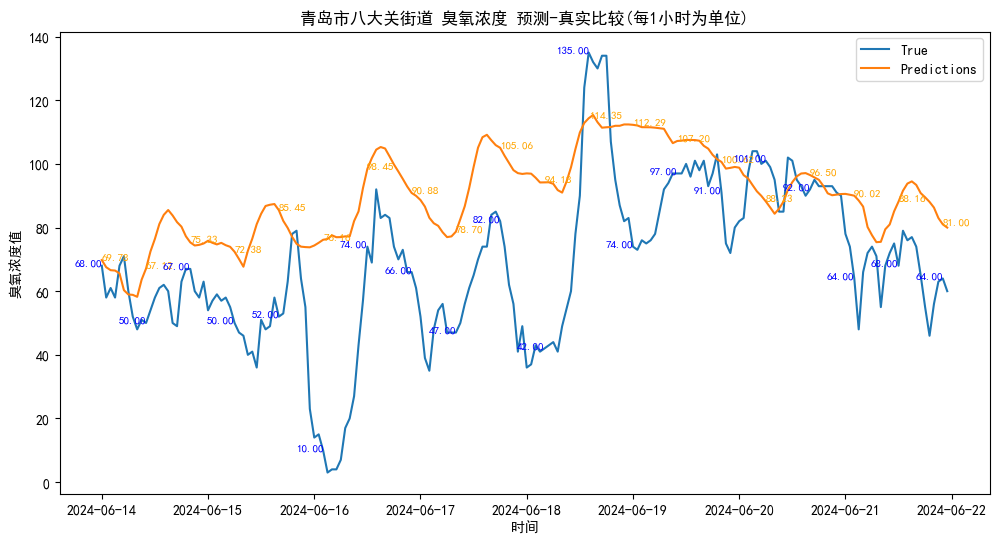

rmse: 29.40079186123635
r2 score: -0.3964175762489657
all
rmse: 29.40079186123635
r2 score: -0.3964175762489657
all-1
rmse: 32.62018405967497
r2 score: -0.5713119183907212
all-2
rmse: 34.333212968494436
r2 score: -0.816991644985354


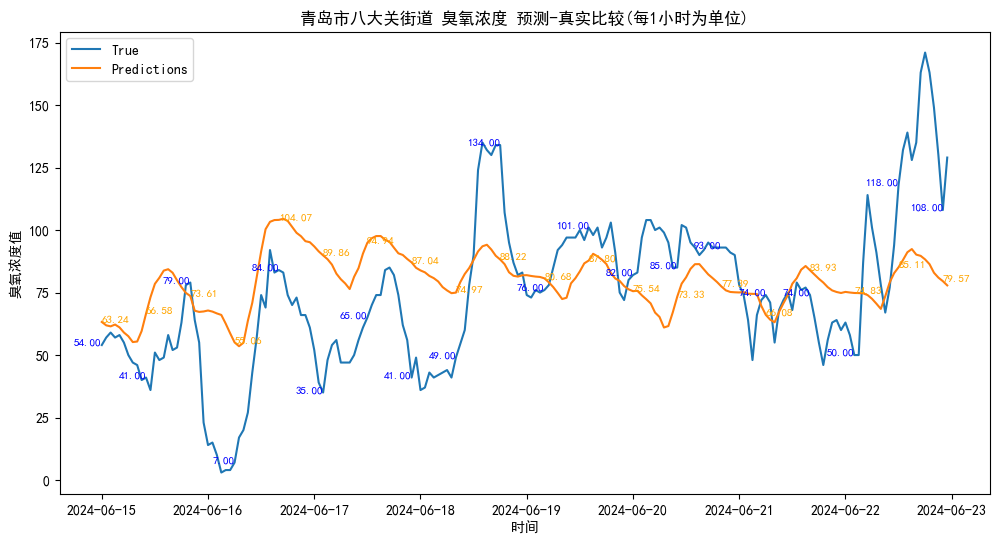

rmse: 28.491775761660637
r2 score: 0.124743985056739
all
rmse: 28.491775761660637
r2 score: 0.124743985056739
all-1
rmse: 27.593462135545472
r2 score: 0.03228296689236376
all-2
rmse: 28.69830859737278
r2 score: -0.032124339218863485


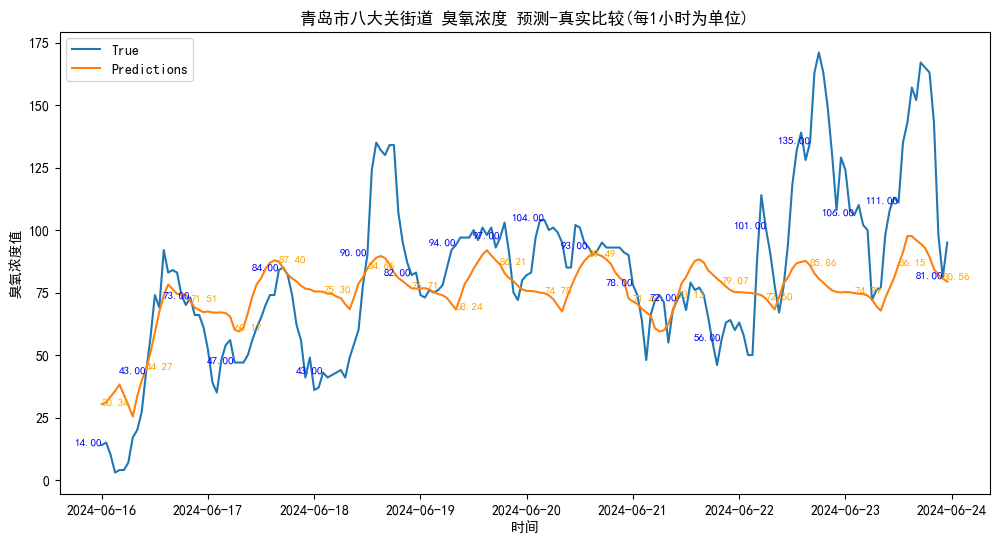

rmse: 27.209916964920954
r2 score: 0.3395795516782707
all
rmse: 27.209916964920954
r2 score: 0.3395795516782707
all-1
rmse: 19.099428831688044
r2 score: 0.4981513107066555
all-2
rmse: 19.89715456911109
r2 score: 0.5331231692387111


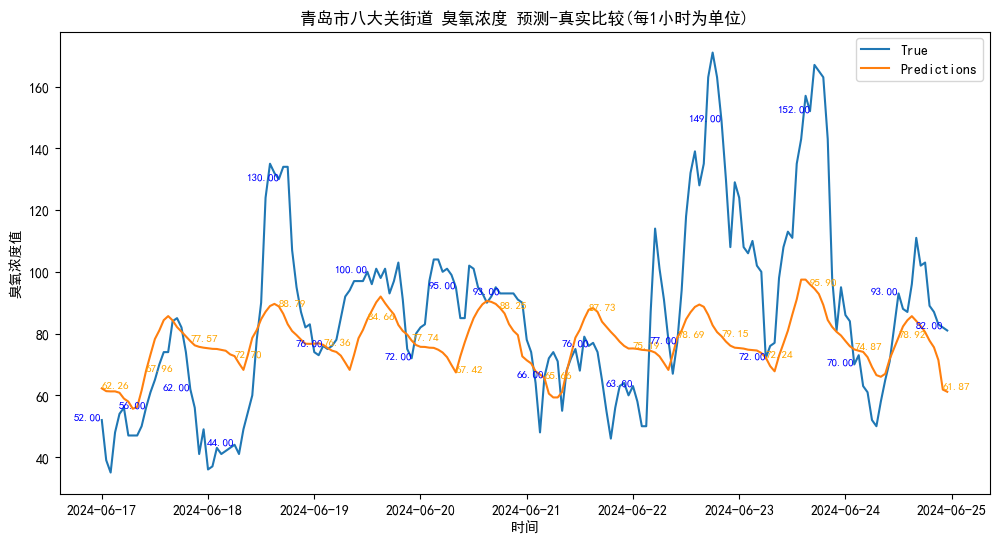

rmse: 26.582132285356366
r2 score: 0.17458957624882643
all
rmse: 26.582132285356366
r2 score: 0.17458957624882643
all-1
rmse: 25.05649632725408
r2 score: 0.19835920023137632
all-2
rmse: 19.162372072774577
r2 score: 0.29706599886469875


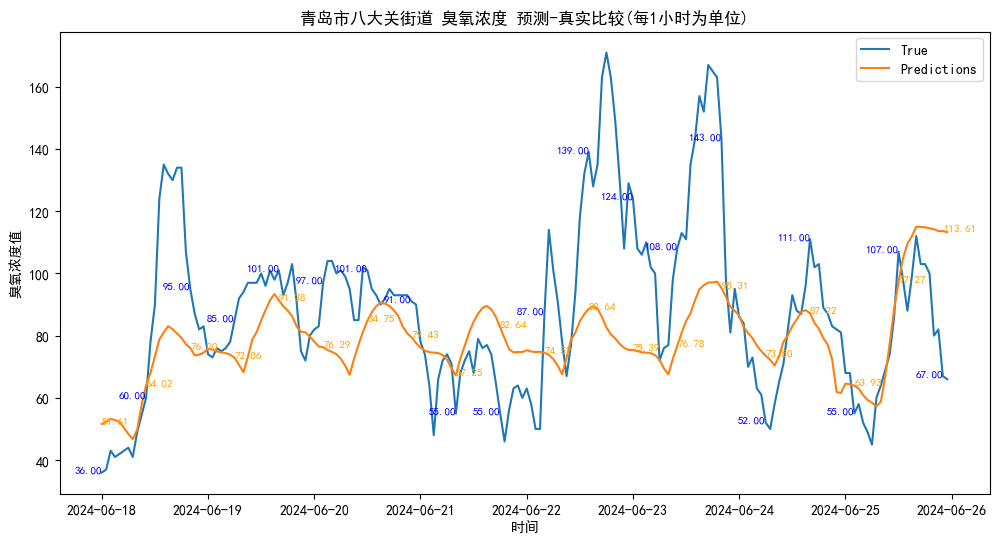

rmse: 26.206260145024114
r2 score: 0.12900637581518093
all
rmse: 26.206260145024114
r2 score: 0.12900637581518093
all-1
rmse: 28.759302368095046
r2 score: 0.07845153102052249
all-2
rmse: 25.871100315713672
r2 score: 0.12313995765928587


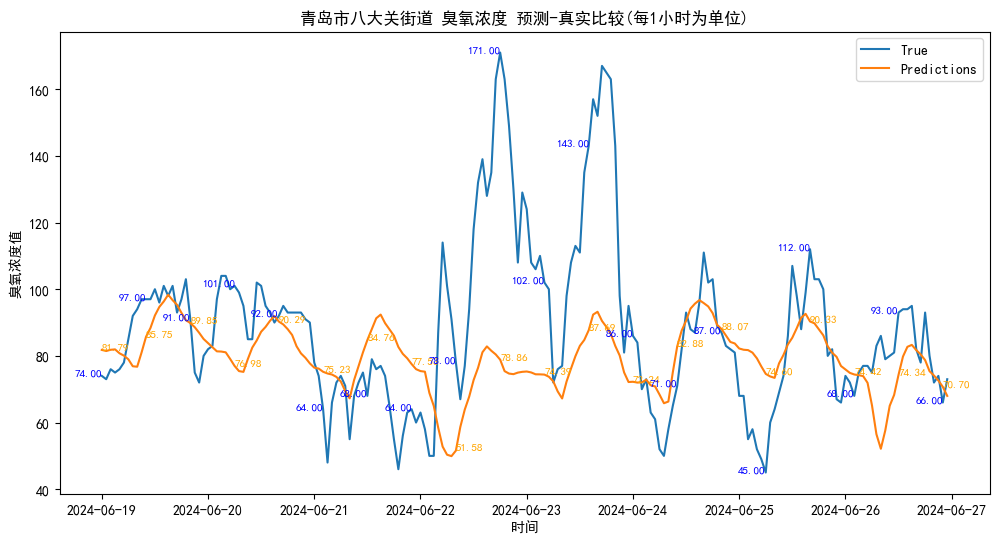

rmse: 26.178759316683767
r2 score: -0.0849626930926548
all
rmse: 26.178759316683767
r2 score: -0.0849626930926548
all-1
rmse: 29.012824318147572
r2 score: -0.1721080100626684
all-2
rmse: 31.533175409661535
r2 score: -0.28339067785101446


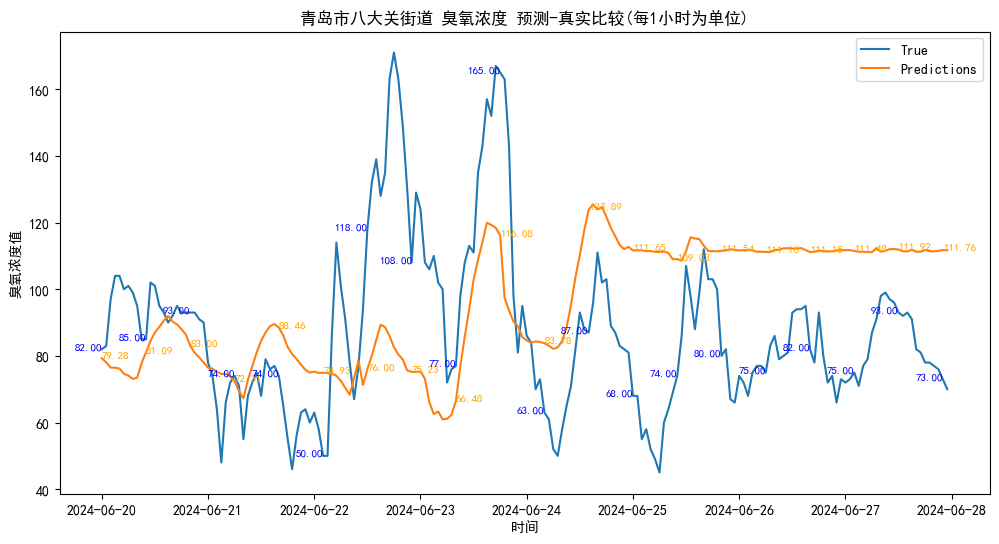

rmse: 31.185241376665278
r2 score: -0.5386886114452638
all
rmse: 31.185241376665278
r2 score: -0.5386886114452638
all-1
rmse: 31.161851370089146
r2 score: -0.21995076302101246
all-2
rmse: 29.212924769814887
r2 score: -0.021899366476375137


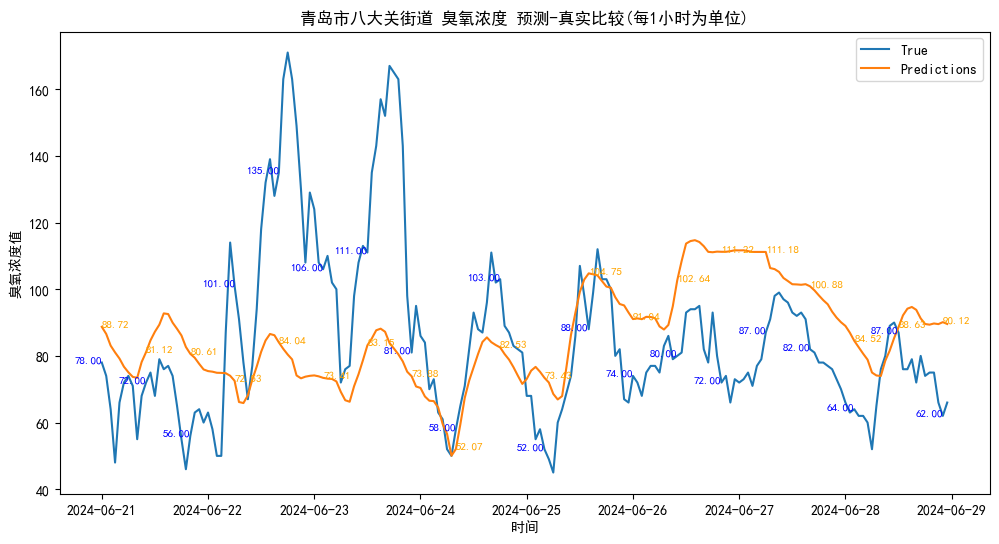

rmse: 28.321095092274458
r2 score: -0.21197520394449065
all
rmse: 28.321095092274458
r2 score: -0.21197520394449065
all-1
rmse: 30.53243402798902
r2 score: -0.14838265706823606
all-2
rmse: 31.506182513447243
r2 score: -0.050903448225419146


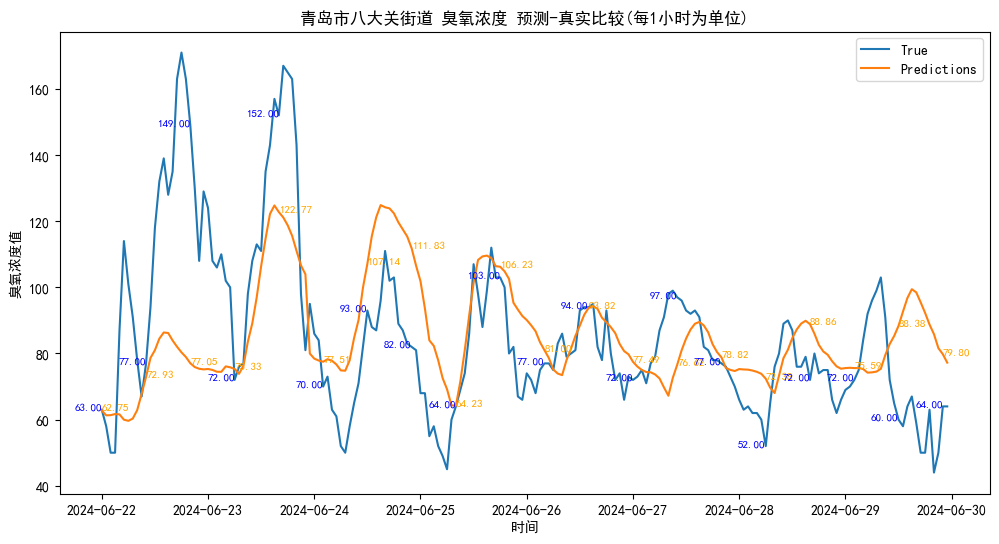

rmse: 24.459309771196956
r2 score: 0.1056438912753701
all
rmse: 24.459309771196956
r2 score: 0.1056438912753701
all-1
rmse: 25.767648185756677
r2 score: 0.09318809274371975
all-2
rmse: 27.739469755079107
r2 score: 0.09128526445732432


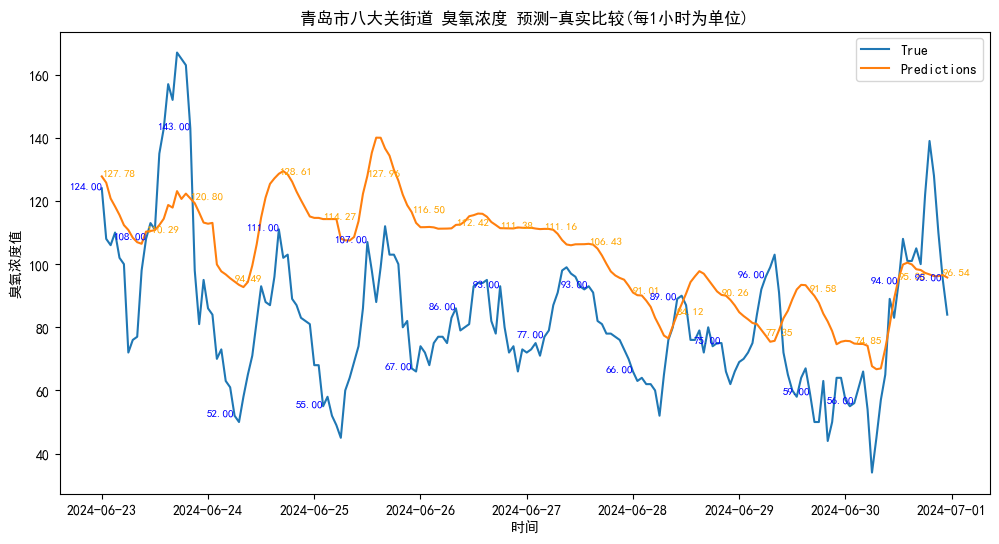

rmse: 28.97587112318465
r2 score: -0.5793631082671242
all
rmse: 28.97587112318465
r2 score: -0.5793631082671242
all-1
rmse: 31.181589940928344
r2 score: -0.9184926753347114
all-2
rmse: 32.98966274267951
r2 score: -0.9880463094285643


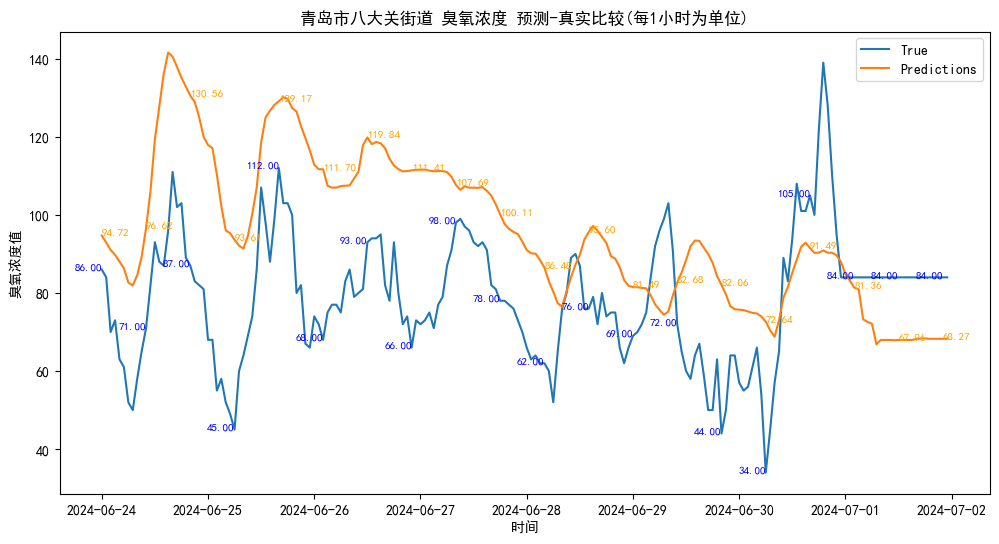

rmse: 26.828894698572803
r2 score: -1.713880507592092
all
rmse: 26.828894698572803
r2 score: -1.713880507592092
all-1
rmse: 29.243612217305856
r2 score: -2.9936176934209073
all-2
rmse: 30.187886942056807
r2 score: -3.703812761267695


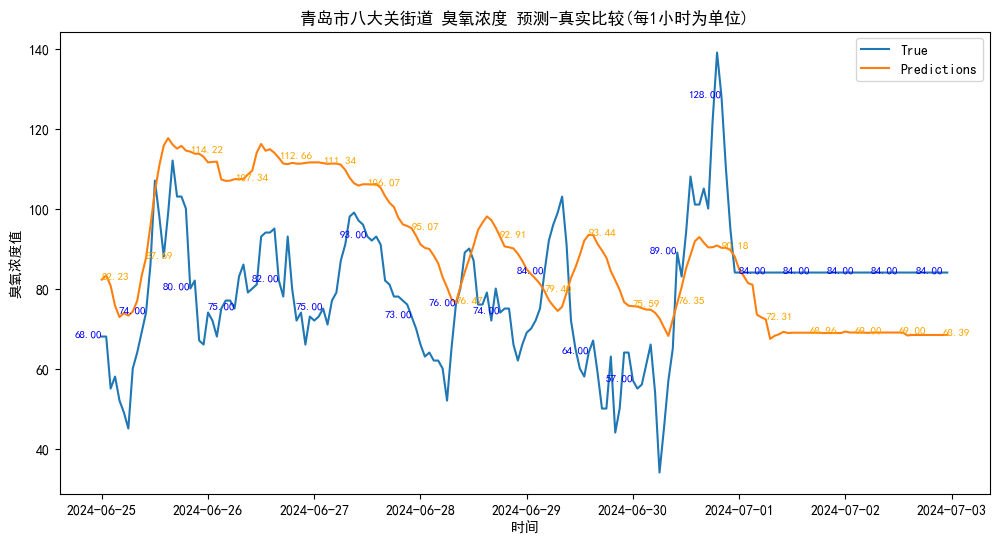

rmse: 22.122665034368918
r2 score: -1.0640367082953417
all
rmse: 22.122665034368918
r2 score: -1.0640367082953417
all-1
rmse: 24.16013937677335
r2 score: -0.9073306030609112
all-2
rmse: 24.783208853655836
r2 score: -1.9945118317038029


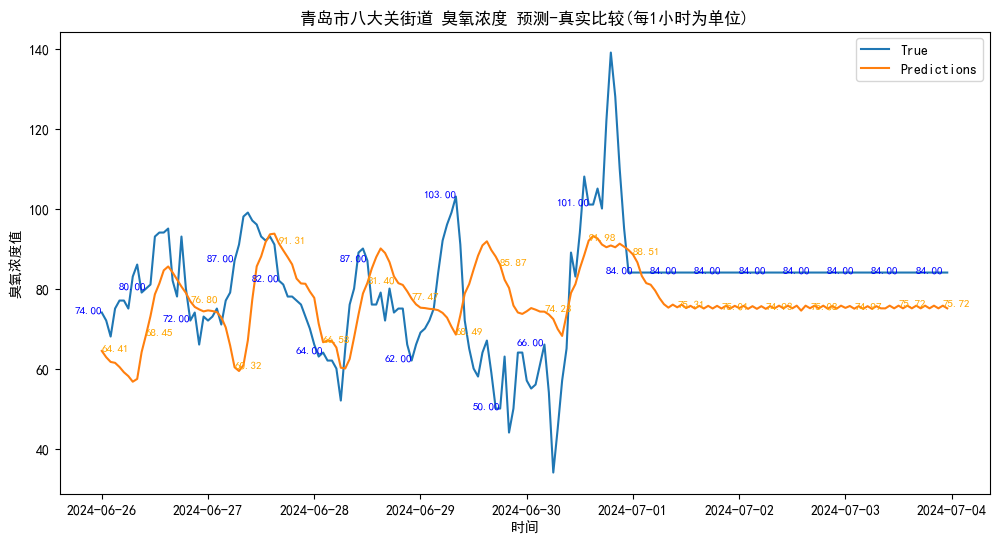

rmse: 14.37205473444403
r2 score: -0.0872013449855622
all
rmse: 14.37205473444403
r2 score: -0.0872013449855622
all-1
rmse: 15.820351888066083
r2 score: -0.015422326343059956
all-2
rmse: 17.003337105977362
r2 score: 0.00035464466828694086


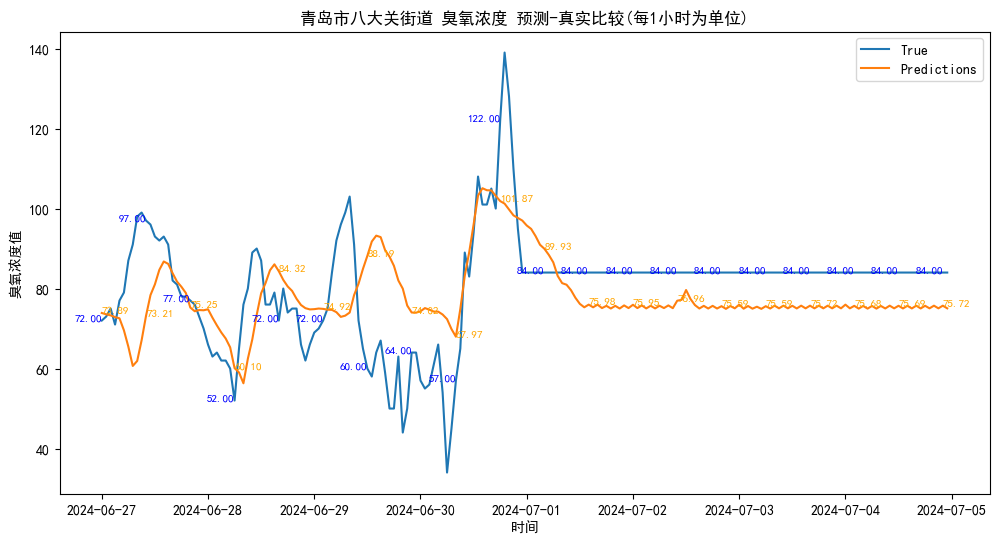

rmse: 13.332967834596834
r2 score: 0.0285064684228451
all
rmse: 13.332967834596834
r2 score: 0.0285064684228451
all-1
rmse: 14.564670461633835
r2 score: 0.11153268903348834
all-2
rmse: 15.519339600877794
r2 score: 0.14440447846253524


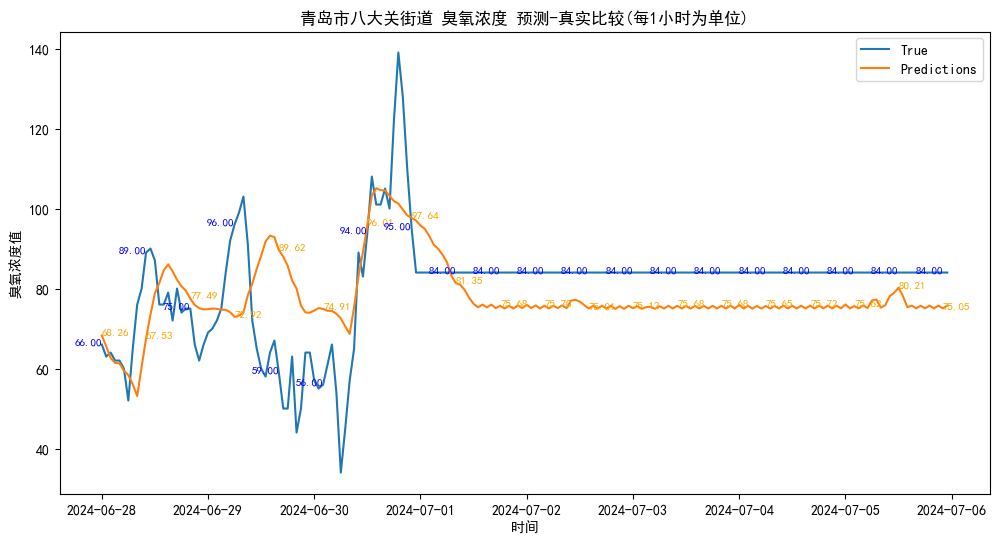

rmse: 12.65427414959617
r2 score: 0.07049942686001487
all
rmse: 12.65427414959617
r2 score: 0.07049942686001487
all-1
rmse: 13.801060194848954
r2 score: 0.15251939874300846
all-2
rmse: 14.60971565677274
r2 score: 0.1943741797830162


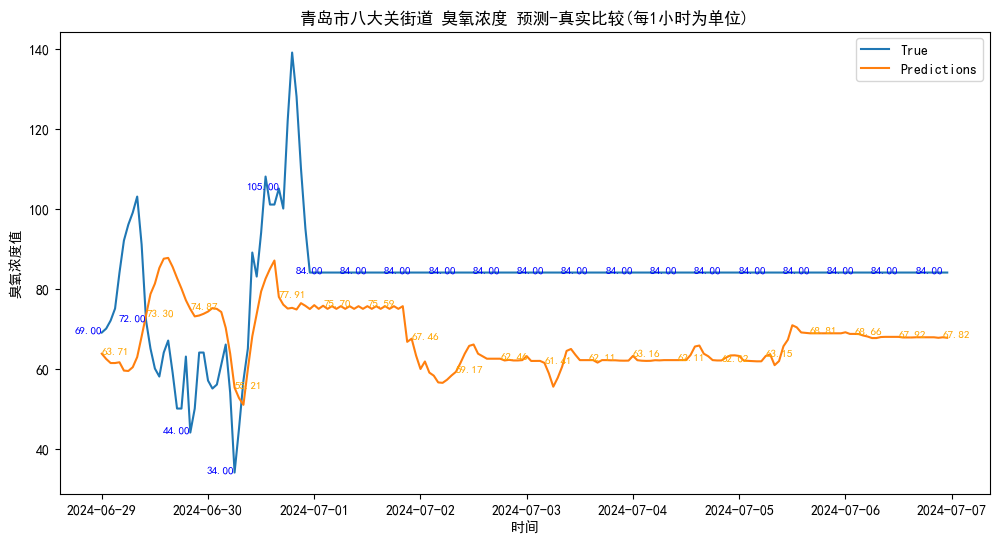

rmse: 20.658657641676694
r2 score: -1.8594173209861817
all
rmse: 20.658657641676694
r2 score: -1.8594173209861817
all-1
rmse: 21.6898296732633
r2 score: -1.380867703580194
all-2
rmse: 21.761194767925403
r2 score: -1.0086016452870692


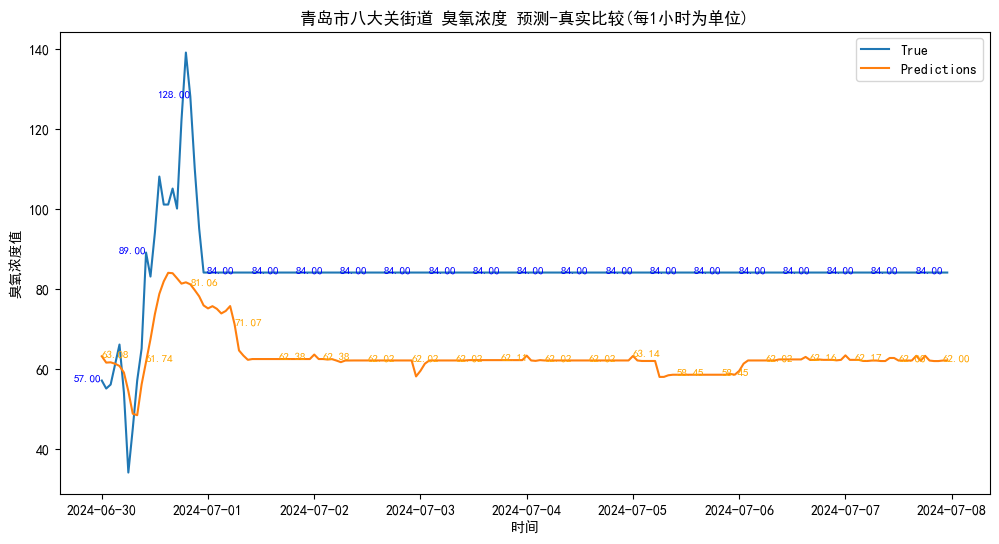

rmse: 22.123930894207096
r2 score: -4.108399239152735
all
rmse: 22.123930894207096
r2 score: -4.108399239152735
all-1
rmse: 22.20044038916836
r2 score: -2.8578620669046937
all-2
rmse: 21.660171587951943
r2 score: -2.0603257933018817


In [37]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
for i in range(len(df_list)):
# 绘制真实值和预测值的曲线
    plt.figure(figsize=(12, 6))
    plt.title("青岛市八大关街道 臭氧浓度 预测-真实比较(每1小时为单位)")
    plt.plot(df_list[i]['日期'],y_list[i].values, label='True')
    plt.plot(df_list[i]['日期'],y_pred_list[i], label='Predictions')
    plt.xlabel('时间')
    plt.ylabel('臭氧浓度值')

# 显示每个具体的数值
    for j in range(0, len(df_list[i]), 10):
        plt.text(df_list[i].loc[5*j]['日期'], y_list[i].values[j], f'{y_list[i].values[j]:.2f}', color='blue', fontsize=8, ha='right')
        plt.text(df_list[i].loc[5*j]['日期'], y_pred_list[i][j], f'{y_pred_list[i][j]:.2f}', color='orange', fontsize=8, ha='left')
    plt.legend()
    plt.show()
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values, y_pred_list[i])))
    print("r2 score:", r2_score(y_list[i].values, y_pred_list[i]))
    print("all")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values, y_pred_list[i])))
    print("r2 score:", r2_score(y_list[i].values, y_pred_list[i]))
    print("all-1")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values[:-(2*24)], y_pred_list[i][:-(2*24)])))
    print("r2 score:", r2_score(y_list[i].values[:-(2*24)], y_pred_list[i][:-(2*24)]))
    print("all-2")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values[:-(3 *24)], y_pred_list[i][:-(3 *24)])))
    print("r2 score:", r2_score(y_list[i].values[:-(3 *24)], y_pred_list[i][:-(3 *24)]))

In [38]:
# from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
# import matplotlib.dates as mdates
# from datetime import datetime, timedelta
# date_range_list = []
# date_range_list111 = []
# start_date111 = datetime(2024, 5, 16, 0, 0, 0) 
# end_date111 = datetime(2024, 5, 22, 23, 0, 0)
# date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
# merged_data111 = pd.merge(pd.DataFrame(date_range111, columns=['日期']), datat, on='日期', how='inner')
# while end_date111 < datetime(2024, 7, 1, 0, 0, 0):
#     date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
#     date_range_list111.append(date_range111)
#     end_date111 += timedelta(hours=1)
#     start_date111 = end_date111
#     end_date111 += timedelta(days=1)
#     end_date111 -= timedelta(hours=1)


# true_value_list1 = []
# true_value_list1 = merged_data111['O3VAL'].tolist()



# start_date = datetime(2024, 5, 16, 0, 0, 0) 
# end_date = datetime(2024, 5, 16, 23, 0, 0)
# while end_date < datetime(2024, 7, 1, 0, 0, 0):
#     date_range = pd.date_range(start=start_date, end=end_date, freq='H')
#     date_range_list.append(date_range)
#     end_date += timedelta(hours=1)
#     start_date = end_date
#     end_date += timedelta(days=1)
#     end_date -= timedelta(hours=1)

# num = 0
# colors = [
#  '#d3e5f3','#a1cae1', 
#     '#5d9fcd', '#4292c6',  '#3171ad',
#     '#2864a0', '#2171b5',   '#08306b','orange'
# ]
# true_legend_added = 0 
# pred_value_list_7 = np.array([])
# pred_value_list_6 = np.array([])
# pred_value_list_5 = np.array([])
# pred_value_list_4 = np.array([])
# pred_value_list_3 = np.array([])
# pred_value_list_2 = np.array([])
# pred_value_list_1 = np.array([])
# pred_value_list_0 = np.array([])

# for date_ranges in date_range_list:
#     num = 7
#     for i in range(len(df_list)):
#         is_in_list = df_list[i]['日期'].isin(date_ranges)
#         rmse_list = []
#         r2_list = []
#         if is_in_list.any():
#             matching_indices = df_list[i].index[is_in_list].tolist()
#             matching_values = df_list[i].loc[is_in_list, '日期'].tolist()
#             if num == 7:
#                 pred_value_list_7 = np.concatenate((pred_value_list_7, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 6:
#                 pred_value_list_6 = np.concatenate((pred_value_list_6, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 5:
#                 pred_value_list_5 = np.concatenate((pred_value_list_5, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 4:
#                 pred_value_list_4 = np.concatenate((pred_value_list_4, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 3:
#                 pred_value_list_3 = np.concatenate((pred_value_list_3, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 2:
#                 pred_value_list_2 = np.concatenate((pred_value_list_2, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 1:
#                 pred_value_list_1 = np.concatenate((pred_value_list_1, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 0:
#                 pred_value_list_0 = np.concatenate((pred_value_list_0, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             num-=1



# plt.figure(figsize=(15, 6))
# plt.title("青岛市八大关街道 臭氧浓度 预测-真实比较(每1小时为单位)")
# plt.plot(date_range111,pred_value_list_7,color=colors[0], label='n-7')
# plt.plot(date_range111,pred_value_list_6,color=colors[1], label='n-6')
# plt.plot(date_range111,pred_value_list_5,color=colors[2], label='n-5')
# plt.plot(date_range111,pred_value_list_4,color=colors[3], label='n-4')
# plt.plot(date_range111,pred_value_list_3,color=colors[4], label='n-3')
# plt.plot(date_range111,pred_value_list_2,color=colors[5], label='n-2')
# # plt.plot(date_range111,pred_value_list_1,color=colors[6], label='n-1')
# # plt.plot(date_range111,pred_value_list_0,color=colors[7], label='n-0')
# plt.plot(date_range111,true_value_list,color=colors[-1], label='True')
# plt.legend()
# plt.show()   


# print('n-7 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_7)))
# print('n-7 R2:',r2_score(true_value_list, pred_value_list_7))
# print('n-6 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_6)))
# print('n-6 R2:',r2_score(true_value_list, pred_value_list_6))
# print('n-5 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_5)))
# print('n-5 R2:',r2_score(true_value_list, pred_value_list_5))
# print('n-4 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_4)))
# print('n-4 R2:',r2_score(true_value_list, pred_value_list_4))
# print('n-3 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_3)))
# print('n-3 R2:',r2_score(true_value_list, pred_value_list_3))
# print('n-2 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_2)))
# print('n-2 R2:',r2_score(true_value_list, pred_value_list_2))
# # print('n-1 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_1)))
# # print('n-1 R2:',r2_score(true_value_list, pred_value_list_1))
# # print('n-0 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_0)))
# # print('n-0 R2:',r2_score(true_value_list, pred_value_list_0))
# # r2_list.append(r2_score(y_list[i].values[int(matching_indices[0]/5):int(matching_indices[(j+1)*24-1]/5)+1], y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[(j+1)*24-1]/5)+1]))
# # print(f"第{num}条线,前{j+1}天 rmse:", rmse_list[j])
# # print(f"第{num}条线,前{j+1}天 r2 score:", r2_list[j])

In [39]:
# for i in range(46):

#     mase7 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_7[i*24:i*24+24]))
#     mase6 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_6[i*24:i*24+24]))
#     mase5 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_5[i*24:i*24+24]))
#     mase4 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_4[i*24:i*24+24]))
#     mase3 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_3[i*24:i*24+24]))
#     mase2 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_2[i*24:i*24+24]))
#     mase1 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_1[i*24:i*24+24]))
#     mase0 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_0[i*24:i*24+24]))
    
#     r27 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_7[i*24:i*24+24])
#     r26 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_6[i*24:i*24+24])
#     r25 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_5[i*24:i*24+24])
#     r24 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_4[i*24:i*24+24])
#     r23 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_3[i*24:i*24+24])
#     r22 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_2[i*24:i*24+24])
#     r21 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_1[i*24:i*24+24])
#     r20 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_0[i*24:i*24+24])
#     rmse_list = []
#     r2_list = []
#     rmse_list.append(mase7)
#     rmse_list.append(mase6)
#     rmse_list.append(mase5)
#     rmse_list.append(mase4)
#     rmse_list.append(mase3)
#     rmse_list.append(mase2)
#     rmse_list.append(mase1)
#     rmse_list.append(mase0)
#     std_dev1 = np.std(rmse_list)
#     r2_list.append(r27)
#     r2_list.append(r26)
#     r2_list.append(r25)
#     r2_list.append(r24)
#     r2_list.append(r23)
#     r2_list.append(r22)
#     r2_list.append(r21)
#     r2_list.append(r20)
#     std_dev2 = np.std(r2_list)
#     col_name1 = 'rmse'
#     col_name2 = 'r2'
    
    
    


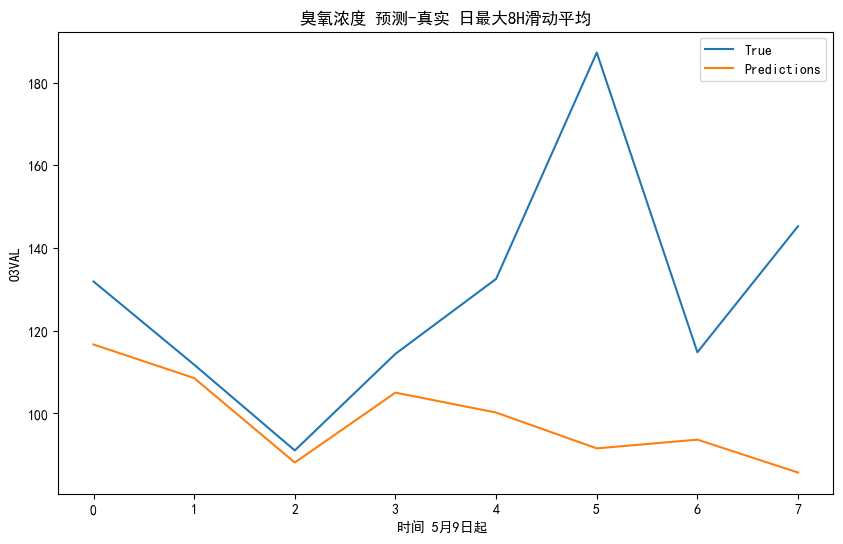

rmse: 42.64751772073735
r2 score: -1.4937266956231108
rmse: 11.01712796748686
r2 score: -0.19874001060557767
rmse: 9.152010634581657
r2 score: 0.6992297294018581
rmse: 9.21156093582475
r2 score: 0.5966440589770563
rmse: 16.641762746199184
r2 score: -0.18402662334735087
rmse: 41.937109180181935
r2 score: -0.9670891418425509


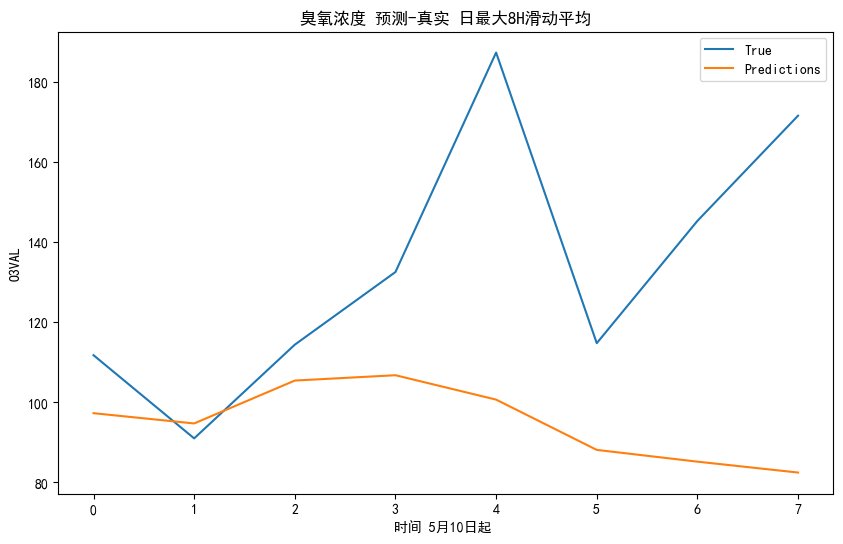

rmse: 50.87218243432086
r2 score: -1.7720618549596523
rmse: 10.563314646236986
r2 score: -0.03663107042907665
rmse: 10.054952631910094
r2 score: 0.07513906362712408
rmse: 15.541789108605931
r2 score: -0.11531418312175656
rmse: 41.13986096782192
r2 score: -0.5824856282200694
rmse: 39.09678515079023
r2 score: -0.6734858225180445


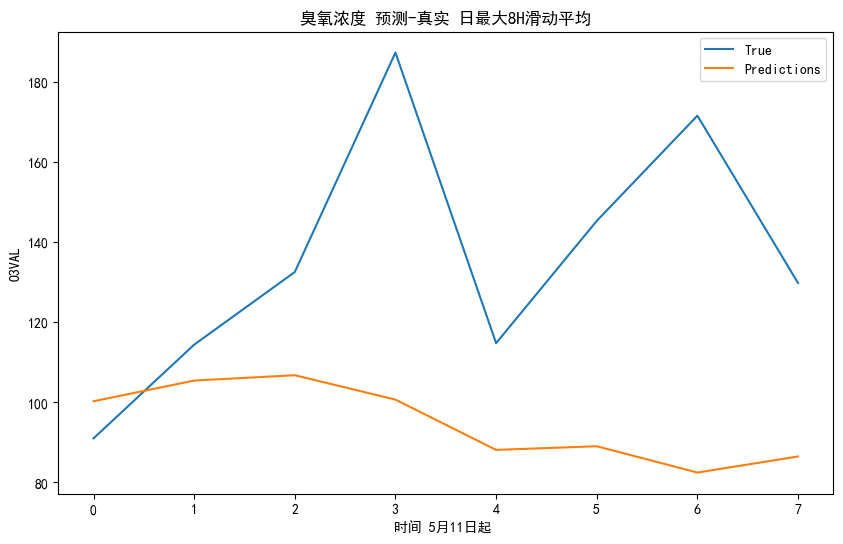

rmse: 52.430283162500835
r2 score: -2.1562663276551617
rmse: 9.106161001215877
r2 score: 0.39294589338852615
rmse: 16.62053903915063
r2 score: 0.04272957717989789
rmse: 45.6206612219969
r2 score: -0.6509996923426364
rmse: 42.50621077873813
r2 score: -0.7171390058154332
rmse: 45.08103603889381
r2 score: -1.213150935506012


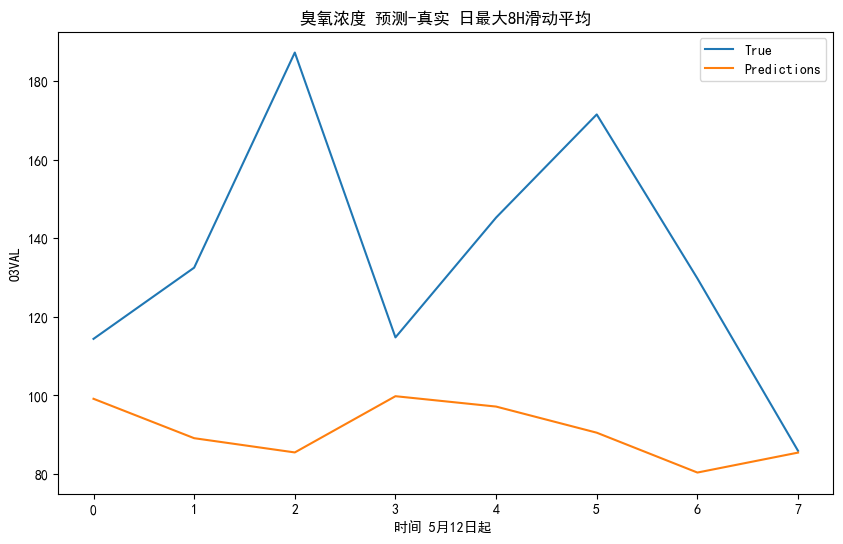

rmse: 54.789766902612094
r2 score: -2.223661784922852
rmse: 32.529362137213894
r2 score: -11.884128735782413
rmse: 64.48557253206543
r2 score: -3.333238236837902
rmse: 56.34523440909038
r2 score: -2.575134127386079
rmse: 54.79654063880692
r2 score: -3.1661094105051344
rmse: 59.965219305680755
r2 score: -3.8014916713711893


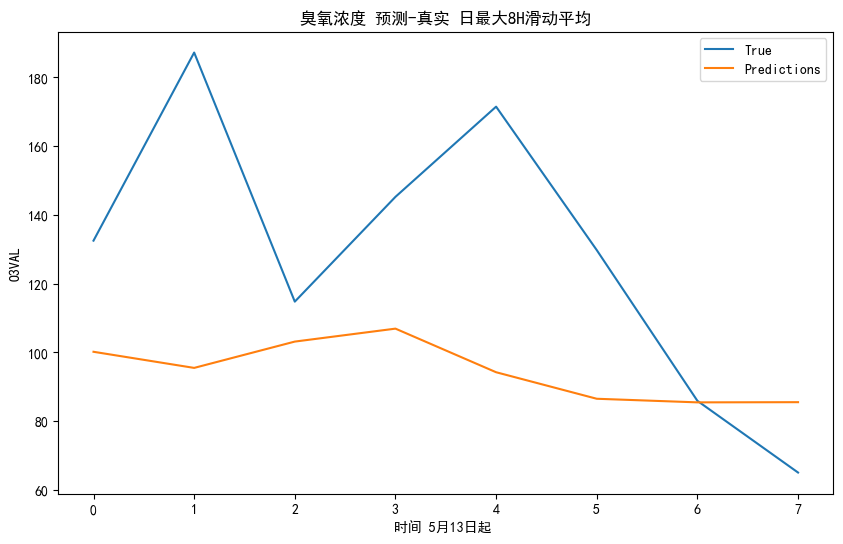

rmse: 49.176085650502834
r2 score: -0.6627654891381871
rmse: 68.8179227101238
r2 score: -5.319676718849495
rmse: 56.589396693045245
r2 score: -2.3634798456910104
rmse: 52.62751177373104
r2 score: -2.8784957078431543
rmse: 58.40209457061744
r2 score: -3.985281032243715
rmse: 56.16419546147451
r2 score: -4.018849873645934


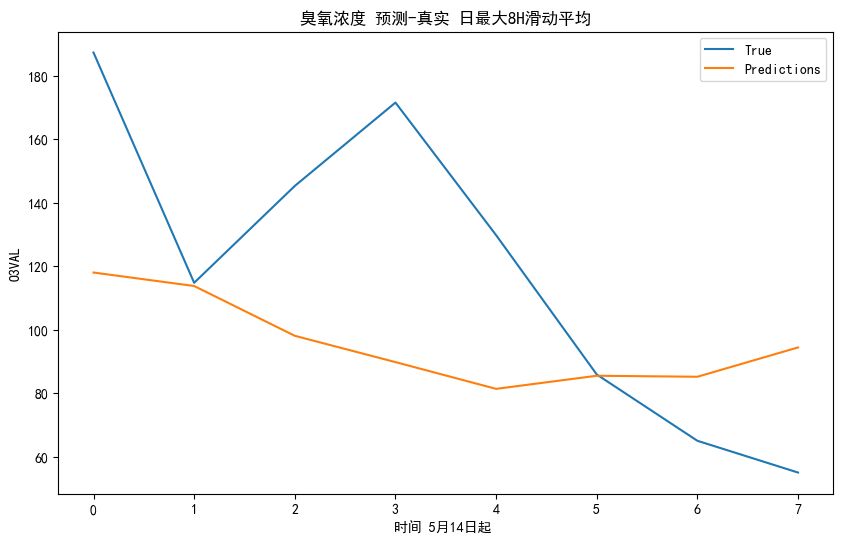

rmse: 47.4420999201215
r2 score: -0.10158490478252769
rmse: 48.98413832632825
r2 score: -0.8259754064763738
rmse: 48.39406198279124
r2 score: -1.6511373016474642
rmse: 58.533876893516556
r2 score: -3.527468368570079
rmse: 56.651912791436224
r2 score: -3.5529772920351457
rmse: 51.716135757539554
r2 score: -1.319235510377713


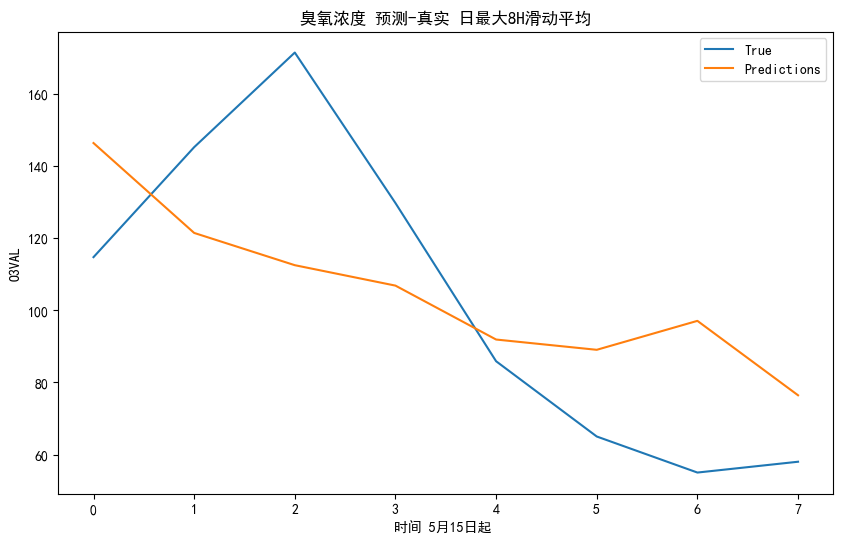

rmse: 32.20185872666263
r2 score: 0.3807830240182196
rmse: 27.99481236413932
r2 score: -2.3698877476092135
rmse: 41.01362599227132
r2 score: -2.1279852585666417
rmse: 37.31847906583378
r2 score: -2.161479752999361
rmse: 33.487126724816406
r2 score: -0.35669238323160224
rmse: 32.10712460706678
r2 score: 0.1852586148065335


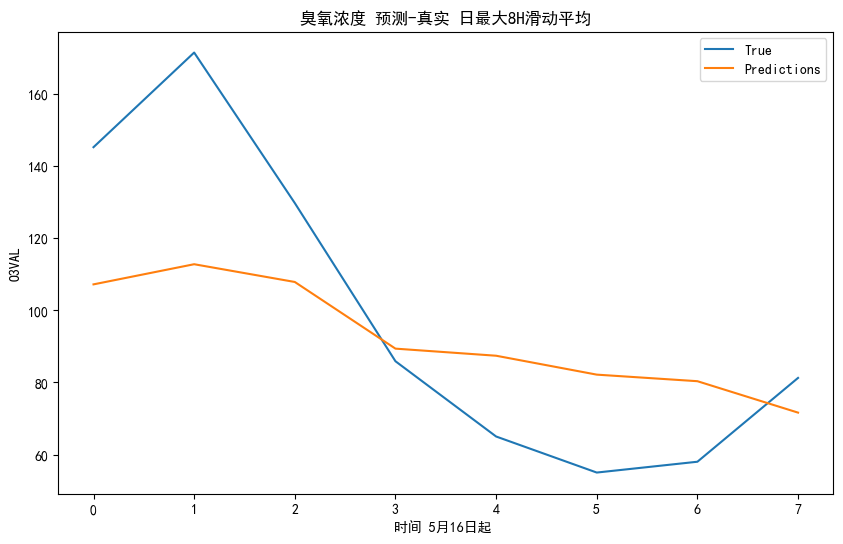

rmse: 30.037582750098878
r2 score: 0.4693072162808105
rmse: 49.47383190454333
r2 score: -13.208638800219195
rmse: 42.3256986887797
r2 score: -5.033278610015552
rmse: 36.69679856832921
r2 score: -0.3941951744883667
rmse: 34.31794601078993
r2 score: 0.22242210850735245
rmse: 33.23227631896453
r2 score: 0.39963896428876655


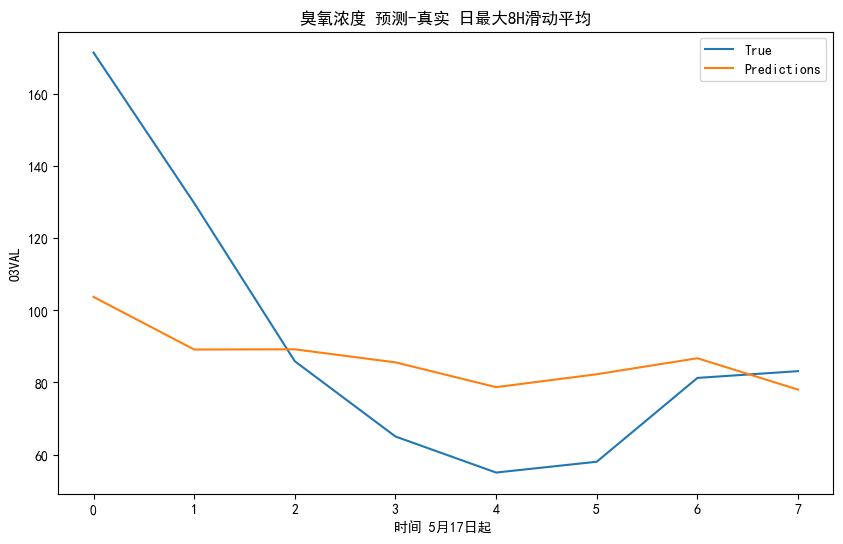

rmse: 31.391870285792372
r2 score: 0.2977299176839122
rmse: 55.872640095379815
r2 score: -6.163832418465417
rmse: 45.65987165989188
r2 score: -0.7058086071500851
rmse: 40.85757917005168
r2 score: 0.009670952678652811
rmse: 38.048925259119486
r2 score: 0.2329285932947457
rmse: 36.11913668829421
r2 score: 0.28892906231644466


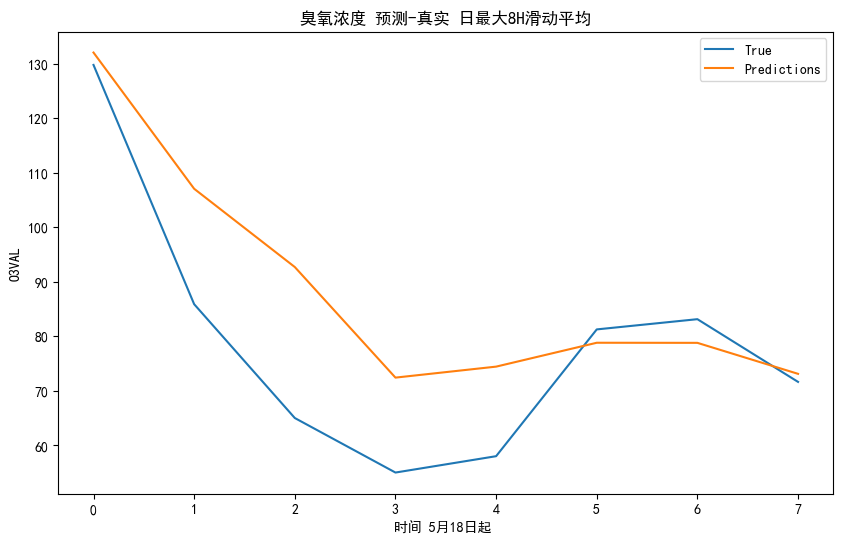

rmse: 15.081297623027636
r2 score: 0.5348276613606829
rmse: 15.051711476713406
r2 score: 0.5292422244557603
rmse: 20.1635973028274
r2 score: 0.4416383383344883
rmse: 19.511626924592687
r2 score: 0.5383372733340384
rmse: 18.934426014672074
r2 score: 0.5326330828128504
rmse: 17.313514346480705
r2 score: 0.5317215187714115


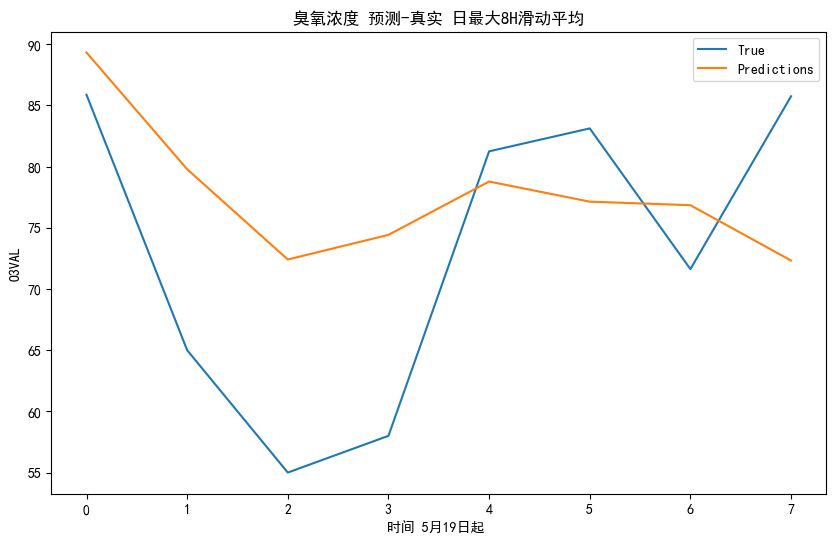

rmse: 11.472560921925789
r2 score: 0.05434339325288695
rmse: 10.738850880868222
r2 score: -0.058577470322714875
rmse: 13.33824860172551
r2 score: -0.07531650652254118
rmse: 14.172814900645085
r2 score: -0.38288902427028626
rmse: 12.724492227565564
r2 score: -0.05435940773858916
rmse: 11.870125022530804
r2 score: 0.09437685238021265


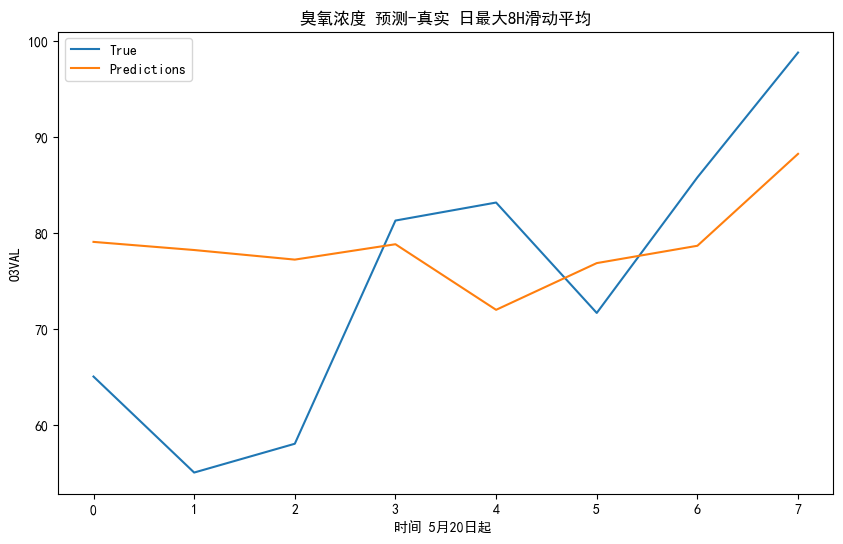

rmse: 13.332577238408835
r2 score: 0.10269452913508759
rmse: 19.158267121895605
r2 score: -13.681567964556246
rmse: 19.16584787807871
r2 score: -19.923845088423345
rmse: 16.64390247261783
r2 score: -1.683505101472417
rmse: 15.703164320937343
r2 score: -0.8099630775863151
rmse: 14.490840695571736
r2 score: -0.8273587952849604


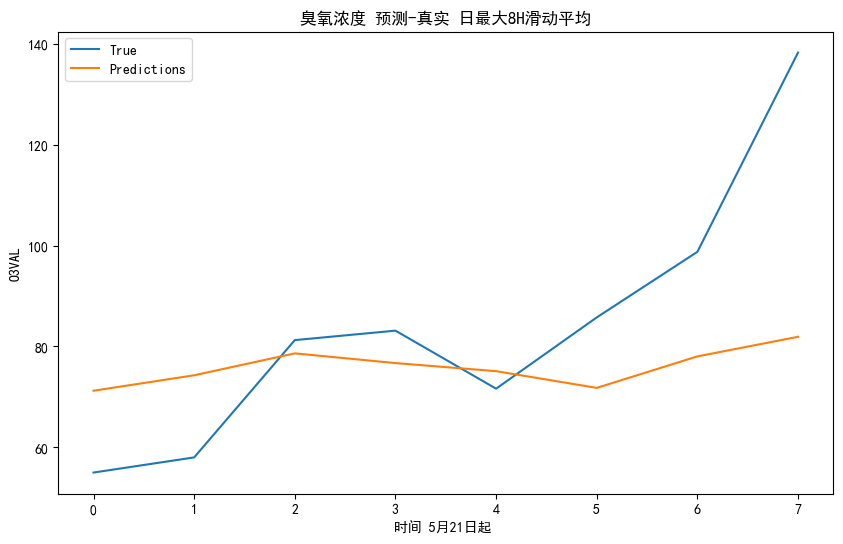

rmse: 23.418101128604114
r2 score: 0.09394357889173355
rmse: 16.24826566894617
r2 score: -116.33606099940214
rmse: 13.353213818567127
r2 score: -0.2956099493868998
rmse: 12.002503558812407
r2 score: 0.13491122089332352
rmse: 10.846923829183035
r2 score: 0.12232401886483035
rmse: 11.426612930867755
r2 score: 0.11205848722048295


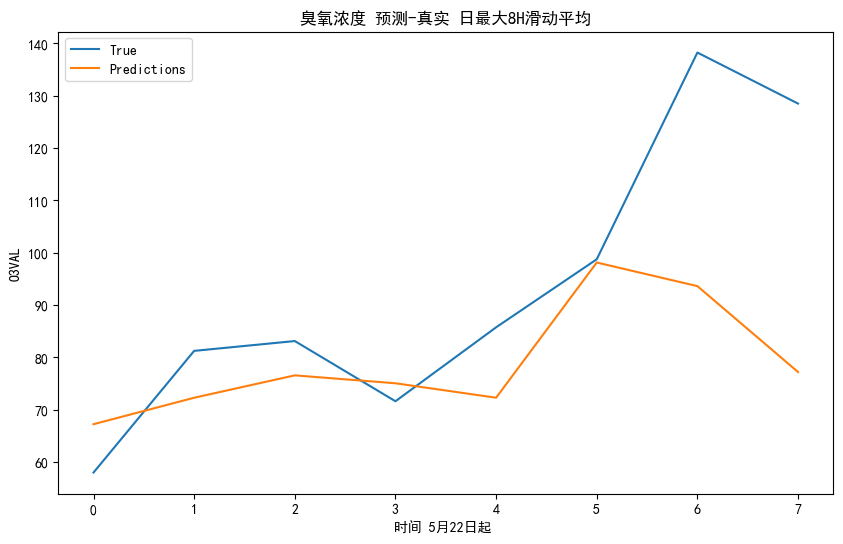

rmse: 25.060244030038714
r2 score: 0.053963451242590166
rmse: 9.097693811291299
r2 score: 0.3875414392673705
rmse: 8.336433542169523
r2 score: 0.4678449450834431
rmse: 7.4207788748853405
r2 score: 0.4444156407288641
rmse: 8.958142948852295
r2 score: 0.2231809097726648
rmse: 8.181513012261444
r2 score: 0.577113823414753


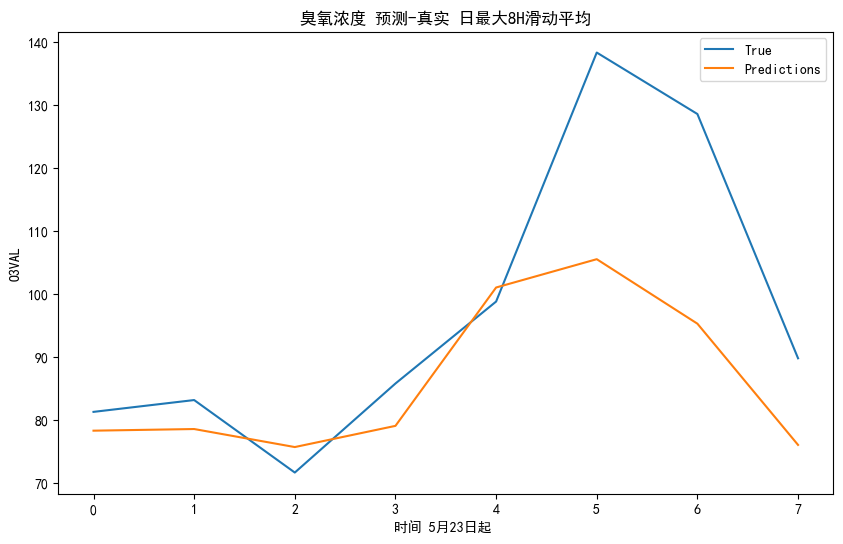

rmse: 17.556837882438078
r2 score: 0.37734181497712105
rmse: 3.8745799048677485
r2 score: -16.080740339717657
rmse: 3.9316044194803252
r2 score: 0.3909202580862168
rmse: 4.783274256772848
r2 score: 0.19554917874337374
rmse: 4.392849349465198
r2 score: 0.7474487489051083
rmse: 13.969772232060722
r2 score: 0.5855950037226467


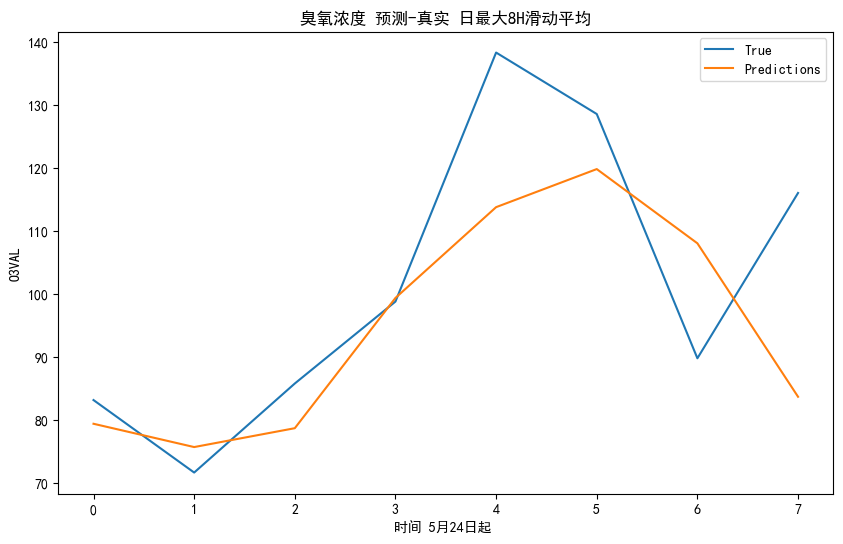

rmse: 16.342443785291454
r2 score: 0.45396214883824115
rmse: 3.9047390589205895
r2 score: 0.5388434898068795
rmse: 5.188053158016385
r2 score: 0.28469337231002223
rmse: 4.502157560485655
r2 score: 0.7819851178078163
rmse: 11.683911003724306
r2 score: 0.7430419606970109
rmse: 11.246328333219399
r2 score: 0.7870615382979569


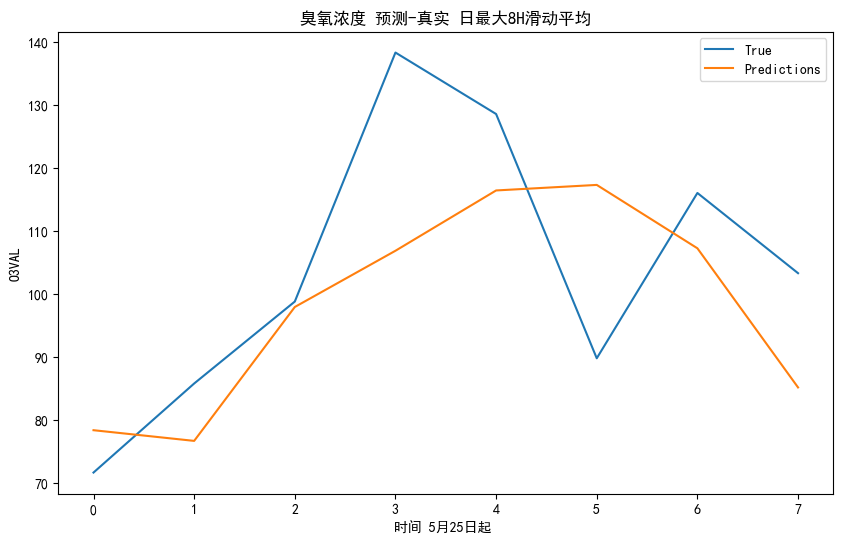

rmse: 17.41474066243728
r2 score: 0.31252021926063955
rmse: 7.998939646086702
r2 score: -0.28276741155962415
rmse: 6.5501119285144425
r2 score: 0.6503284860767086
rmse: 16.7128680812013
r2 score: 0.5467273750431786
rmse: 15.901648547350568
r2 score: 0.6024706972755898
rmse: 18.351790725677365
r2 score: 0.3992317625936027


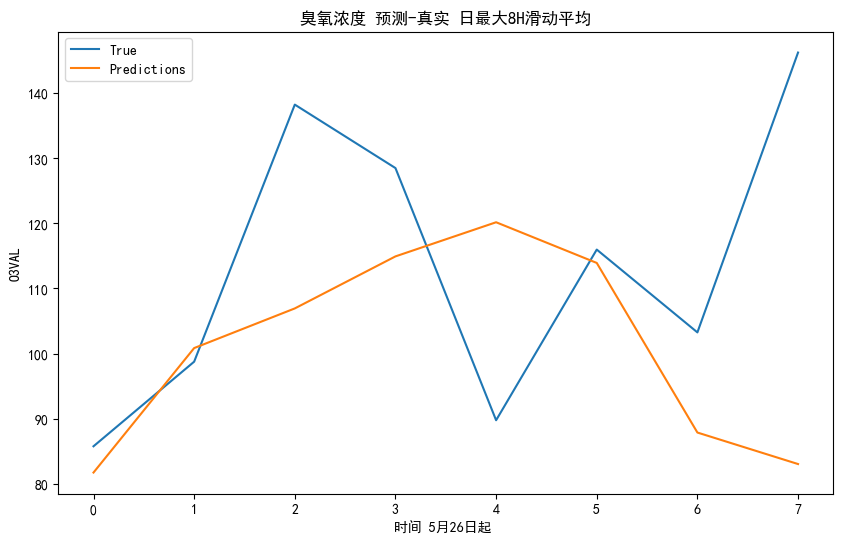

rmse: 28.174558597717237
r2 score: -0.7774871613637275
rmse: 3.2148482345208955
r2 score: 0.7553787178461038
rmse: 18.270754940201712
r2 score: 0.33020078591814783
rmse: 17.21681663852141
r2 score: 0.34970814851099297
rmse: 20.548826484178097
r2 score: 0.061156461497555825
rmse: 18.777125879244377
r2 score: 0.07989506736607088


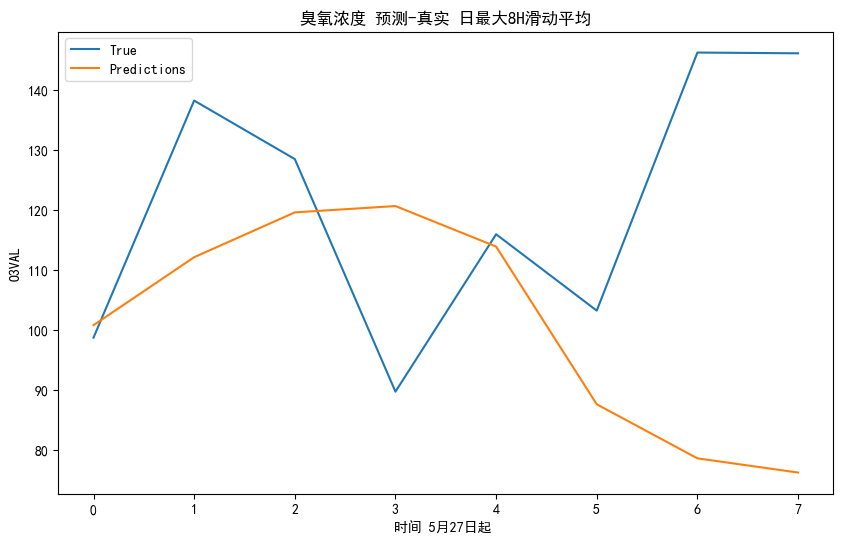

rmse: 37.77985119199218
r2 score: -2.3247416062477426
rmse: 18.512665541924022
r2 score: 0.12137468875592727
rmse: 15.961519669205485
r2 score: 0.0974045204531212
rmse: 20.74017155022569
r2 score: -0.06289979323759454
rmse: 18.573261706317506
r2 score: -0.0630445956007204
rmse: 18.11230542809118
r2 score: -0.14220208234350662


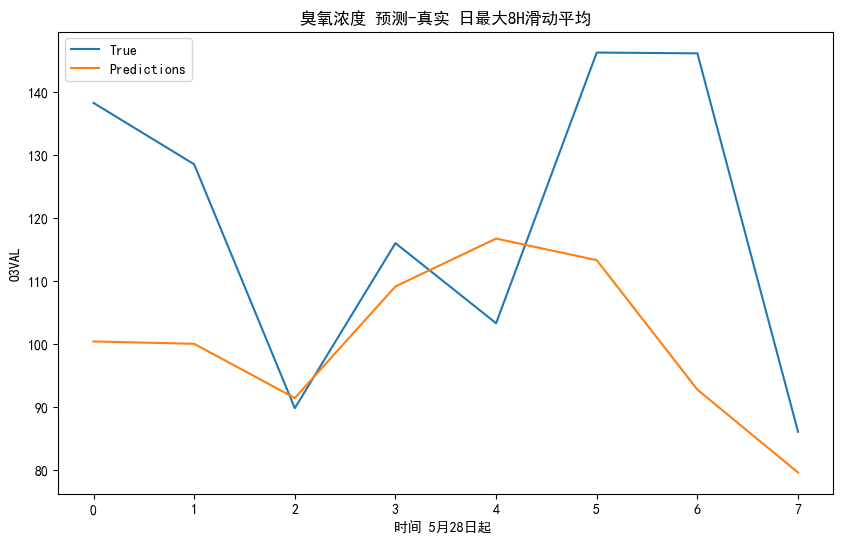

rmse: 28.42700299432029
r2 score: -0.5613976047794722
rmse: 33.535502864641735
r2 score: -46.32170739815991
rmse: 27.39751306419547
r2 score: -0.7107691428381129
rmse: 23.975168570039248
r2 score: -0.7386580588419713
rmse: 22.271318947705172
r2 score: -0.6541628487430706
rmse: 24.38552424135709
r2 score: -0.5475361406807395


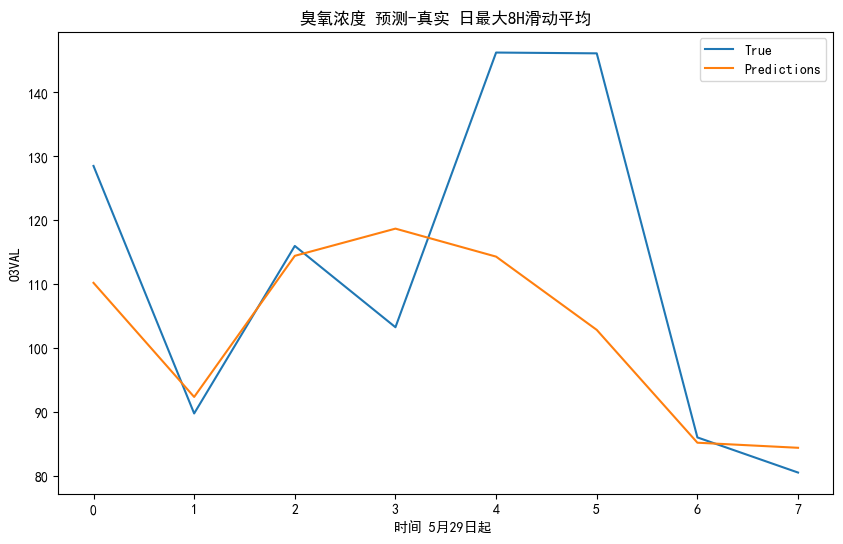

rmse: 20.89457520208564
r2 score: 0.2821550748973706
rmse: 13.069408336197636
r2 score: 0.5449821522360281
rmse: 10.70851209814153
r2 score: 0.5601163451984025
rmse: 12.065066155769046
r2 score: 0.30014894287923943
rmse: 17.90490089428622
r2 score: 0.16521285944419417
rmse: 24.0726601515012
r2 score: -0.3172872723644311


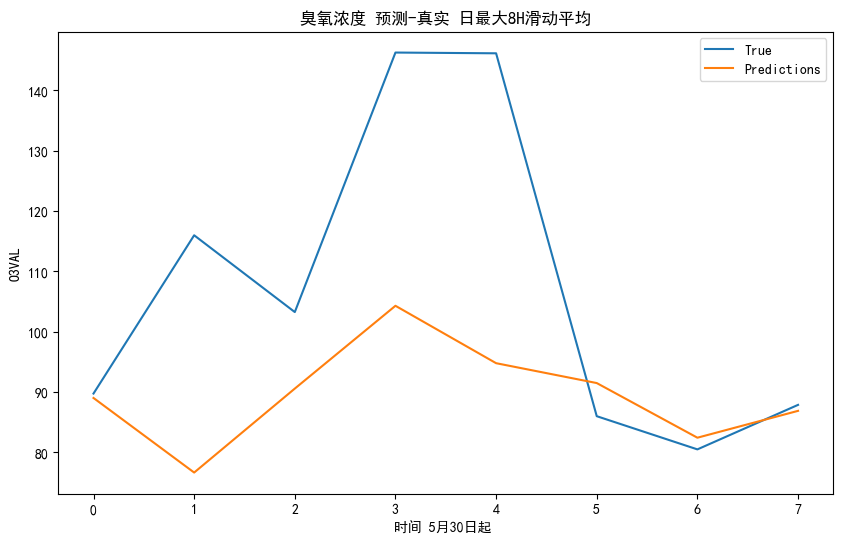

rmse: 27.699831363275045
r2 score: -0.234436000505041
rmse: 27.803515032303636
r2 score: -3.496021784940055
rmse: 23.85219116893242
r2 score: -3.961927474985429
rmse: 29.44156033954971
r2 score: -0.9841745245982061
rmse: 34.93820589949817
r2 score: -1.3628720149640174
rmse: 31.972700532862643
r2 score: -0.7220608344770401


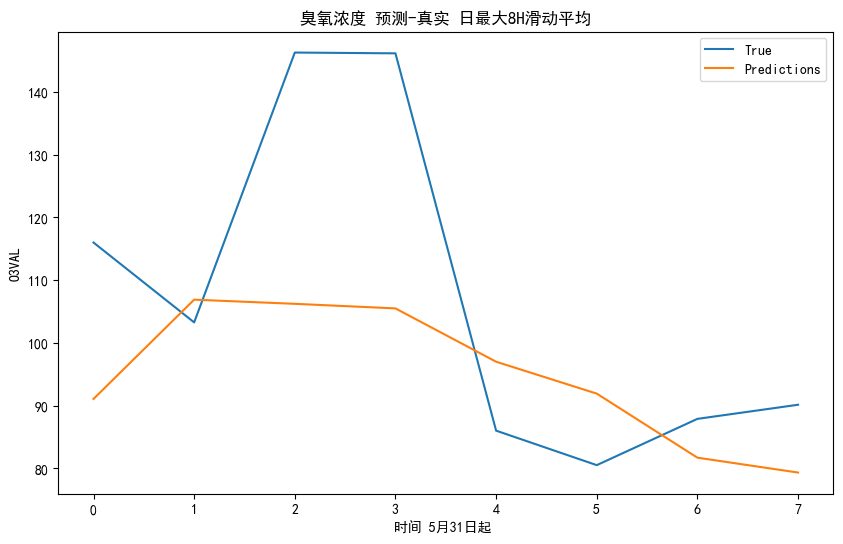

rmse: 23.171280608680707
r2 score: 0.1339702890823189
rmse: 17.808894091163268
r2 score: -6.834626761521413
rmse: 27.311067475256515
r2 score: -1.2930988192548605
rmse: 31.184092763026015
r2 score: -1.7417968129738703
rmse: 28.320872898456606
r2 score: -0.42050668712792416
rmse: 26.268813046897733
r2 score: -0.011806884900351866


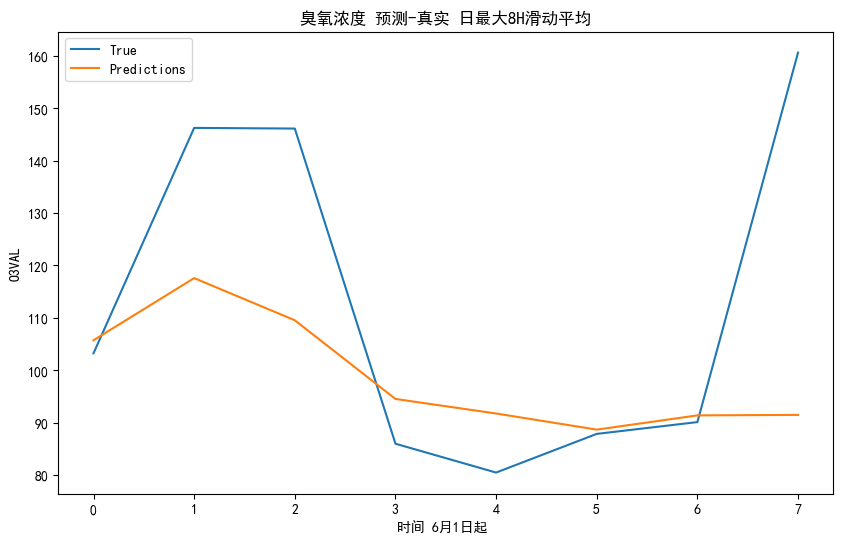

rmse: 29.886488239828598
r2 score: 0.047821324089385
rmse: 20.33880646143622
r2 score: 0.10510103131258042
rmse: 26.864865644148193
r2 score: -0.7615930584907795
rmse: 23.65428349281508
r2 score: 0.20280816370902655
rmse: 21.74841331811954
r2 score: 0.42056237847627953
rmse: 19.856281555241466
r2 score: 0.48390796200384745


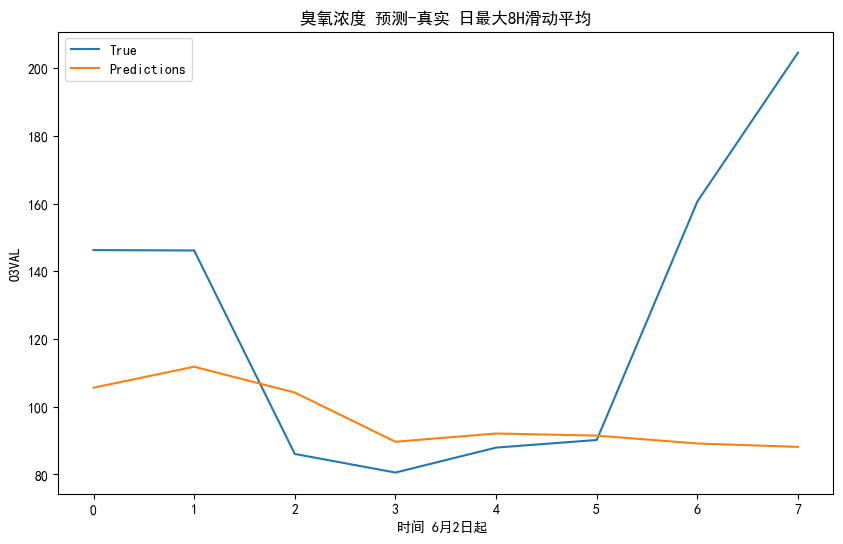

rmse: 52.39617881255021
r2 score: -0.5040669667792907
rmse: 37.64208731024071
r2 score: -362732.24469037686
rmse: 32.47129774309037
r2 score: -0.3097783026042735
rmse: 28.487005583832886
r2 score: 0.18364580147562648
rmse: 25.54758059944
r2 score: 0.2832007440754568
rmse: 23.327643082853722
r2 score: 0.3282752999459776


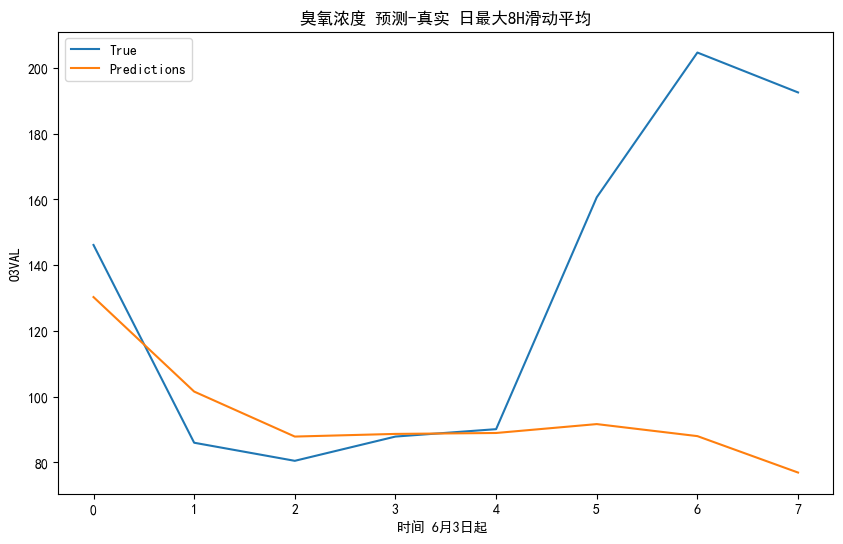

rmse: 63.50130112813129
r2 score: -0.7517901653165733
rmse: 15.698166242269542
r2 score: 0.7273235316985043
rmse: 13.50633224092817
r2 score: 0.7935351544894004
rmse: 11.703775097716957
r2 score: 0.8077981540087887
rmse: 10.481064550442683
r2 score: 0.8125840050149025
rmse: 29.733882365313363
r2 score: 0.14246927071320692


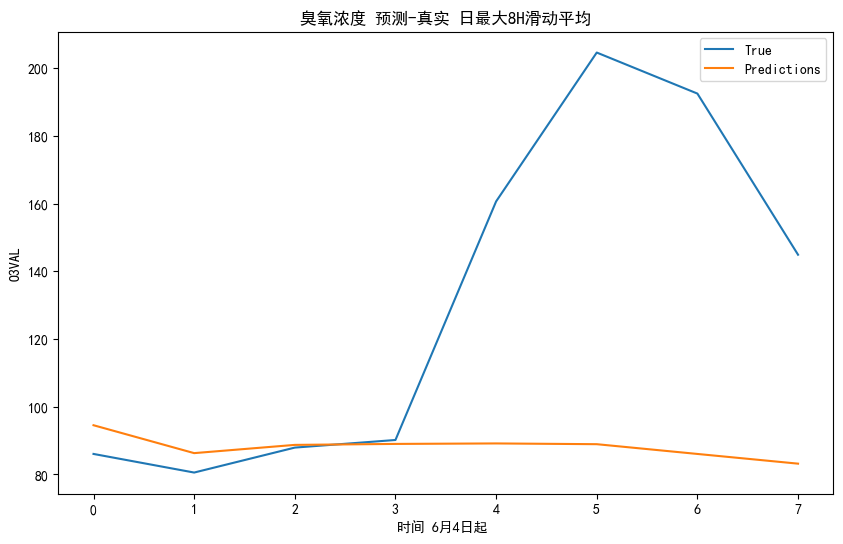

rmse: 64.9750976053512
r2 score: -0.8376733332490447
rmse: 7.244035438075331
r2 score: -5.93898174255752
rmse: 5.932702958044464
r2 score: -2.5933093739298787
rmse: 5.17063355616203
r2 score: -1.1085260478311314
rmse: 32.31757009504116
r2 score: -0.16281923030549028
rmse: 55.705595457318836
r2 score: -0.3858286574581955


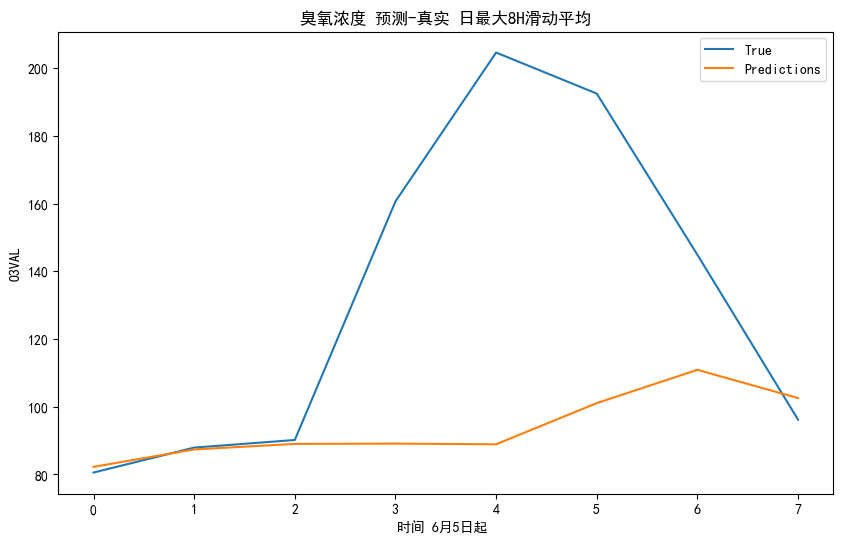

rmse: 59.263606543900245
r2 score: -0.6001345709381867
rmse: 1.2508286813486196
r2 score: 0.8849380833491561
rmse: 1.2220279734162176
r2 score: 0.9116323234169338
rmse: 35.80379021074735
r2 score: -0.21833546051328634
rmse: 60.87784106124059
r2 score: -0.5209239898543843
rmse: 66.95691656583602
r2 score: -0.6802863772068697


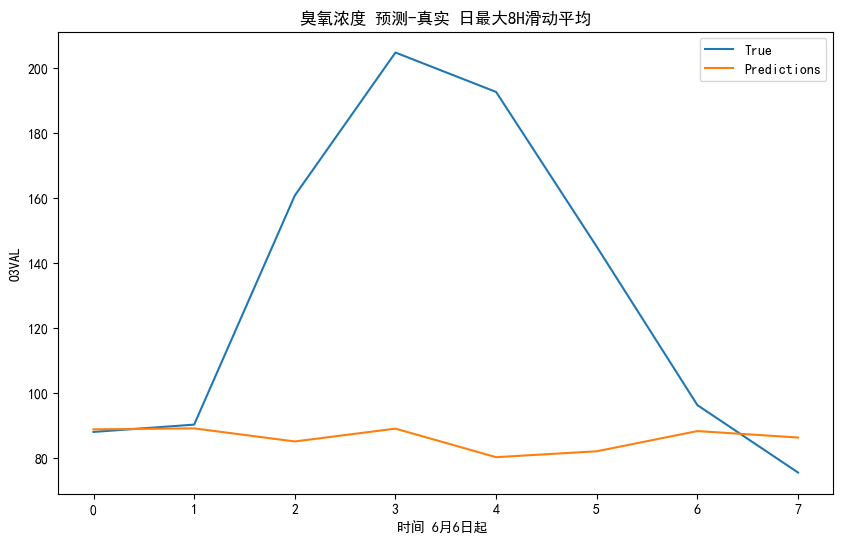

rmse: 66.98921110836314
r2 score: -0.9821509414052254
rmse: 0.996044049213868
r2 score: 0.21611555715606245
rmse: 43.70197666101562
r2 score: -0.6740333201095248
rmse: 69.14486838561521
r2 score: -0.9642269612517704
rmse: 79.69602938848236
r2 score: -1.5804350794834803
rmse: 77.15834054704226
r2 score: -1.9014453704216447


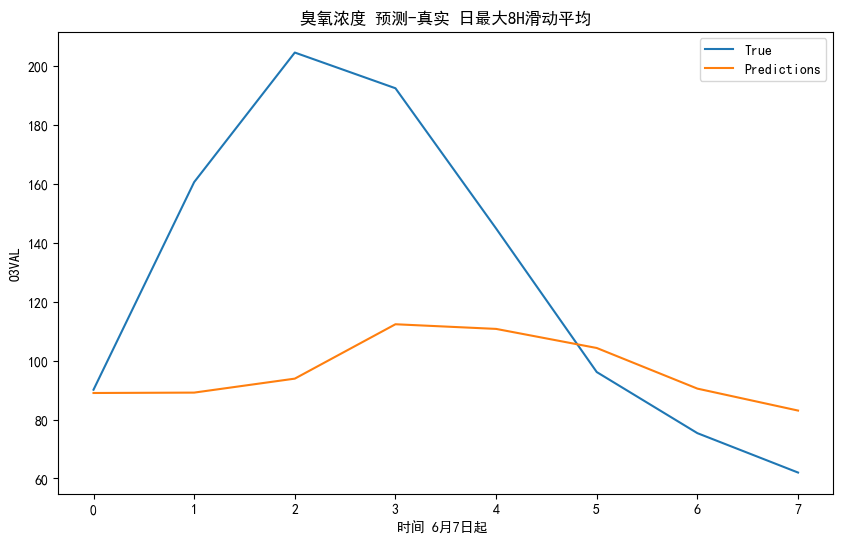

rmse: 56.673746907302736
r2 score: -0.22615018781362317
rmse: 50.54840704936636
r2 score: -1.0563484373851866
rmse: 76.09620386583346
r2 score: -1.6036365091356828
rmse: 77.12693644285892
r2 score: -2.006206964913162
rmse: 70.64940837485081
r2 score: -2.0626220447896864
rmse: 64.58002215827399
r2 score: -1.195773541017787


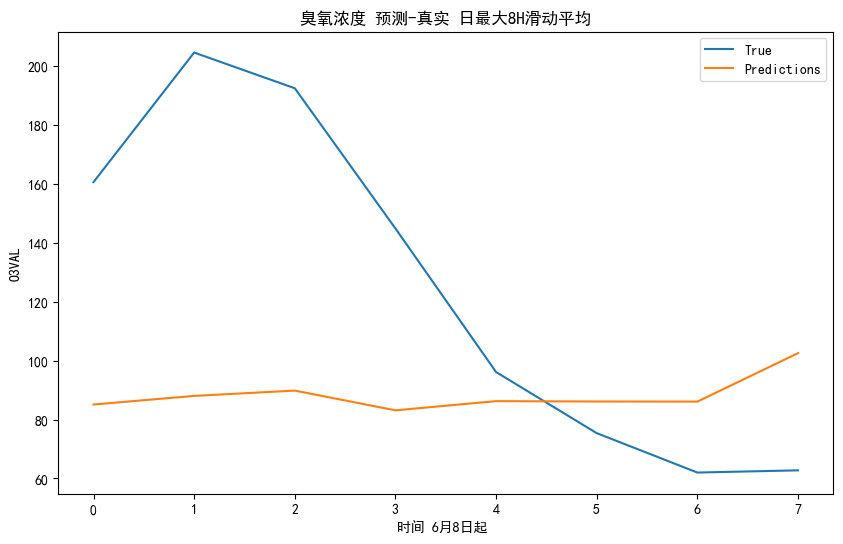

rmse: 67.10940474404296
r2 score: -0.5201719076856877
rmse: 98.23027419671692
r2 score: -18.93633629909543
rmse: 99.7306841509526
r2 score: -27.885118293322673
rmse: 91.72137852103661
r2 score: -13.6543962896995
rmse: 82.15693120210864
r2 score: -3.58761730751581
rmse: 75.12709795903392
r2 score: -1.5482870388359022


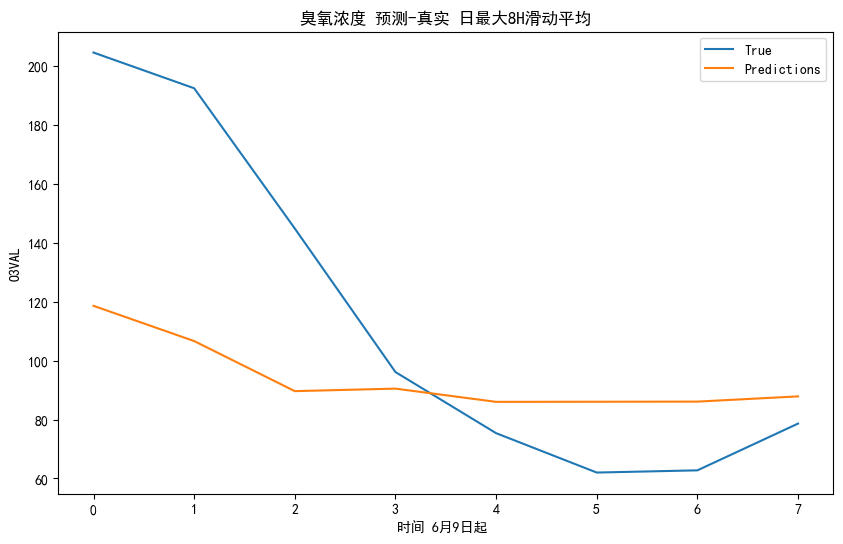

rmse: 48.95228115338069
r2 score: 0.19175461046392905
rmse: 85.92892288553936
r2 score: -199.89782397670913
rmse: 77.06630990532058
r2 score: -7.930825644727891
rmse: 66.80064925742775
r2 score: -1.426647093312928
rmse: 59.93716668885184
r2 score: -0.37945009621197867
rmse: 55.588425051358975
r2 score: -0.00498689919638573


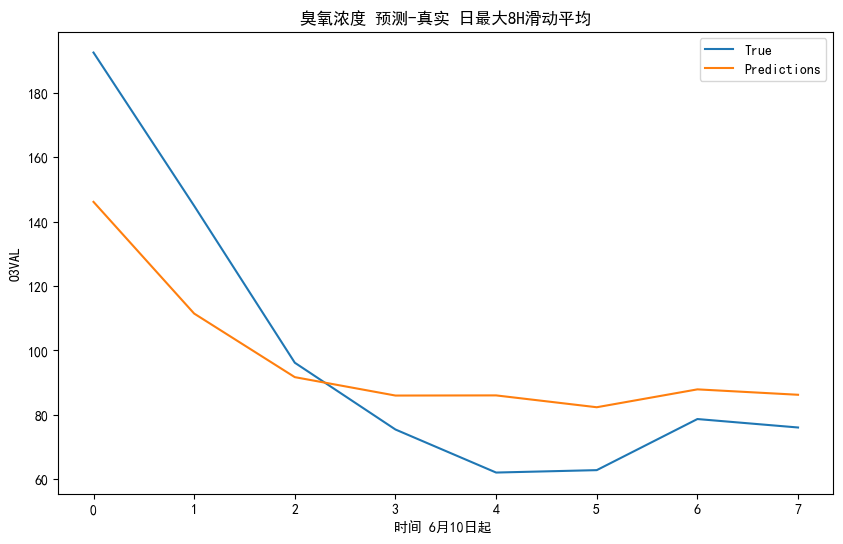

rmse: 23.84685116102529
r2 score: 0.6974869148108804
rmse: 40.45361118860174
r2 score: -1.8860550182131042
rmse: 33.13136736182705
r2 score: 0.29094248764692765
rmse: 29.17352988933885
r2 score: 0.5862436234813055
rmse: 28.21010799673644
r2 score: 0.6578858155065919
rmse: 26.959707180622395
r2 score: 0.6847778443426289


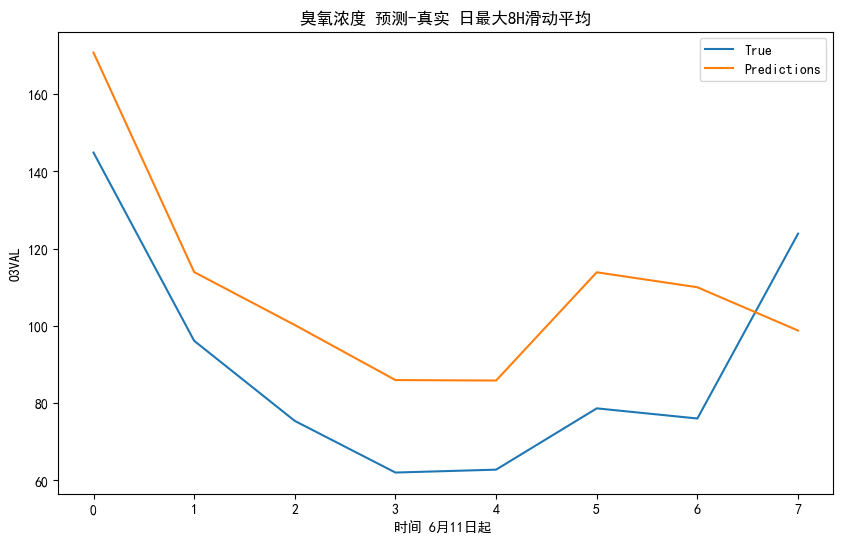

rmse: 26.784880926511416
r2 score: 0.08346758327539983
rmse: 22.229074496863113
r2 score: 0.16832525466998638
rmse: 23.131722591970682
r2 score: 0.36945752818907274
rmse: 23.340307987707153
r2 score: 0.4500413999579125
rmse: 23.289406363554725
r2 score: 0.43186490072964745
rmse: 25.671056563629577
r2 score: 0.18478565123240742


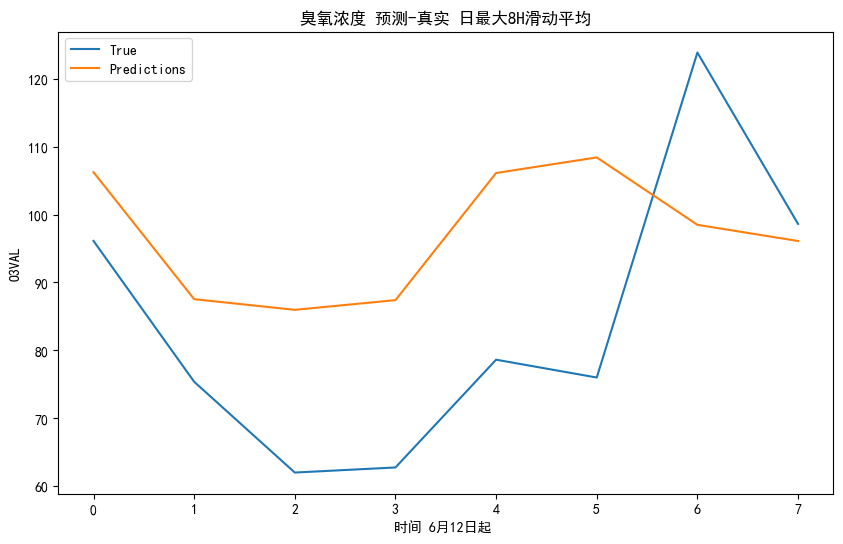

rmse: 22.053969254726802
r2 score: -0.2742699024009936
rmse: 11.19151641203863
r2 score: -0.1635945034779389
rmse: 16.58484911320105
r2 score: -0.3954670740219126
rmse: 18.92580010494889
r2 score: -0.88035666688805
rmse: 20.925215579758138
r2 score: -1.8118490383255512
rmse: 23.240243493124737
r2 score: -3.157446173826261


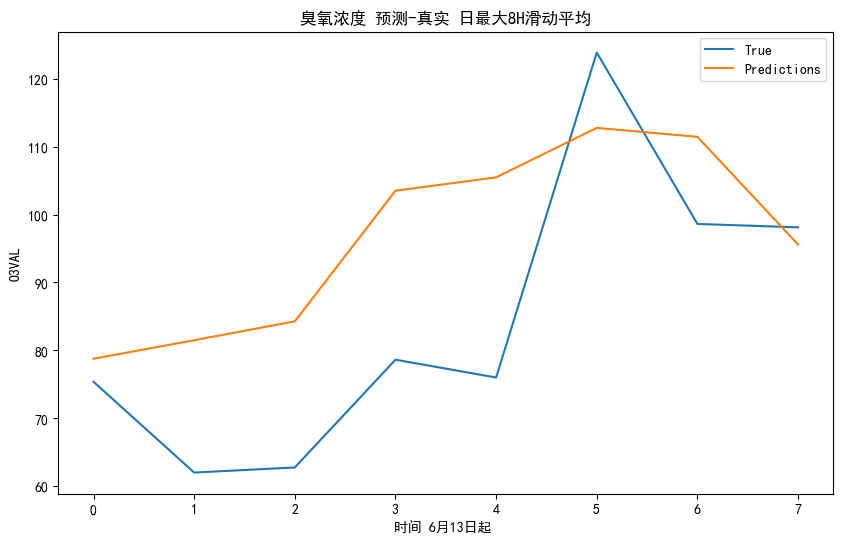

rmse: 18.159623660842225
r2 score: 0.15030277720344065
rmse: 13.989409333953816
r2 score: -3.3759380574116538
rmse: 16.87795745911696
r2 score: -6.5662869152104975
rmse: 19.198027506785678
r2 score: -5.717867611159322
rmse: 21.650842507606157
r2 score: -8.325521225258809
rmse: 20.27741449417308
r2 score: 0.045832918337204265


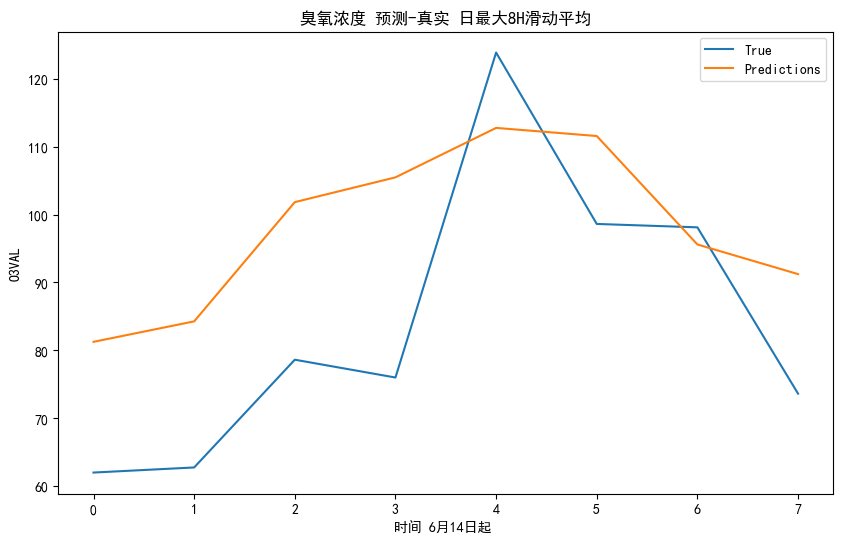

rmse: 18.87432753732934
r2 score: 0.09214607504543582
rmse: 20.421115424061316
r2 score: -2964.4894589357154
rmse: 21.392710539845826
r2 score: -6.786532906102064
rmse: 23.677426267256767
r2 score: -8.885069427340056
rmse: 21.751912024144897
r2 score: 0.0767371307051089
rmse: 20.54865663195873
r2 score: 0.1052840520213717


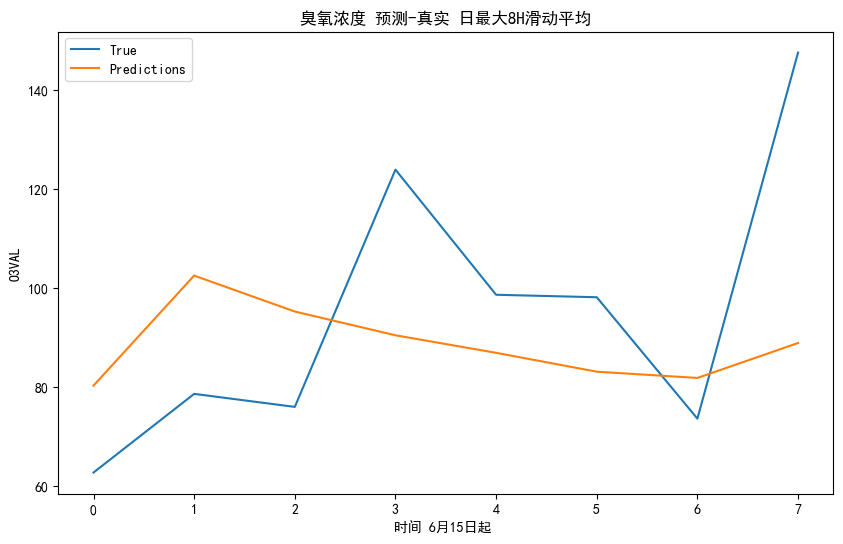

rmse: 27.907845002273028
r2 score: -0.08570647198218184
rmse: 20.948417381514375
r2 score: -5.965221950664902
rmse: 20.39499718305634
r2 score: -7.616507380270466
rmse: 24.31626949817869
r2 score: -0.11165076451997336
rmse: 22.37116189451287
r2 score: -0.10266707686487009
rmse: 21.322920651816723
r2 score: -0.15828465453885543


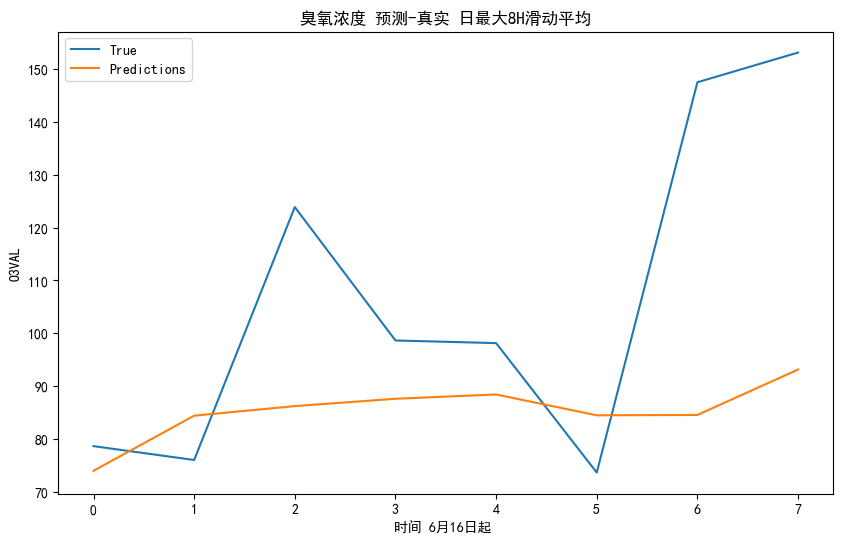

rmse: 34.29697549268175
r2 score: -0.32984890854925775
rmse: 6.786938622353281
r2 score: -25.73924984371702
rmse: 22.44430499580088
r2 score: -0.04308156838831345
rmse: 20.204985917886198
r2 score: -0.10786123587698859
rmse: 18.587671881944146
r2 score: -0.16267850986275767
rmse: 17.53496794969929
r2 score: 0.01256468136290012


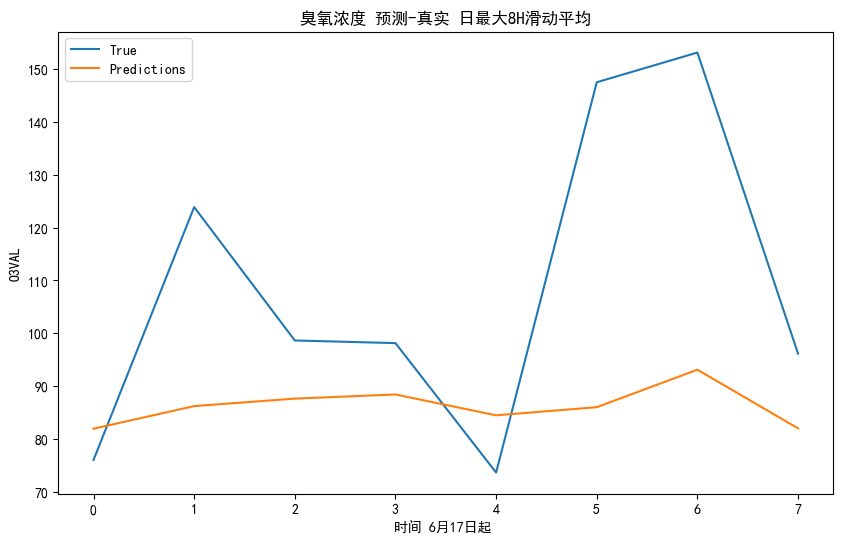

rmse: 34.23002966282888
r2 score: -0.46933229287237443
rmse: 26.96480636792586
r2 score: -0.2689281425989145
rmse: 22.91510053053158
r2 score: -0.3732266175362824
rmse: 20.43188319244749
r2 score: -0.45384370979228295
rmse: 18.906032260562107
r2 score: -0.07014177969945568
rmse: 30.46774522549492
r2 score: -0.37496250870168457


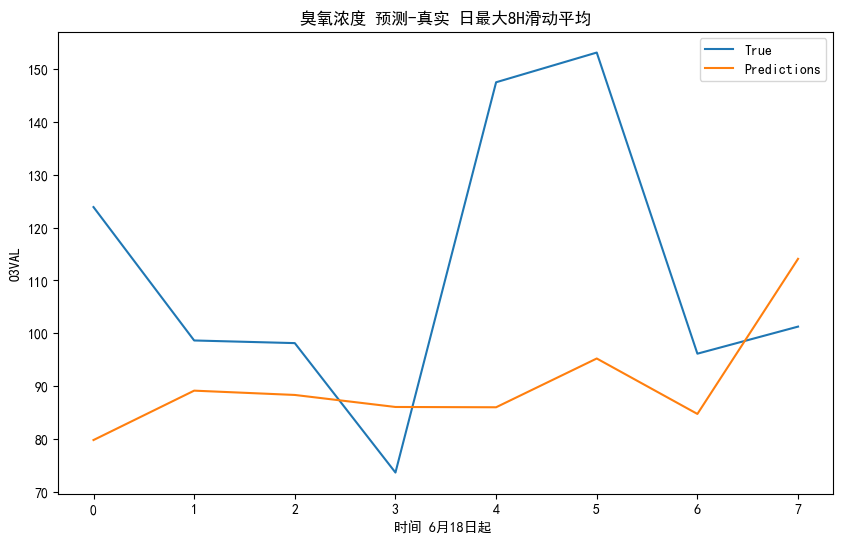

rmse: 34.853005434276284
r2 score: -0.8327283430242107
rmse: 31.895705720278084
r2 score: -5.382659227257438
rmse: 26.651706591447407
r2 score: -3.914247086099288
rmse: 23.900789985112965
r2 score: -0.8094684053204557
rmse: 34.84074035307284
r2 score: -0.9093925006295622
rmse: 39.62991420790295
r2 score: -0.9431773747808181


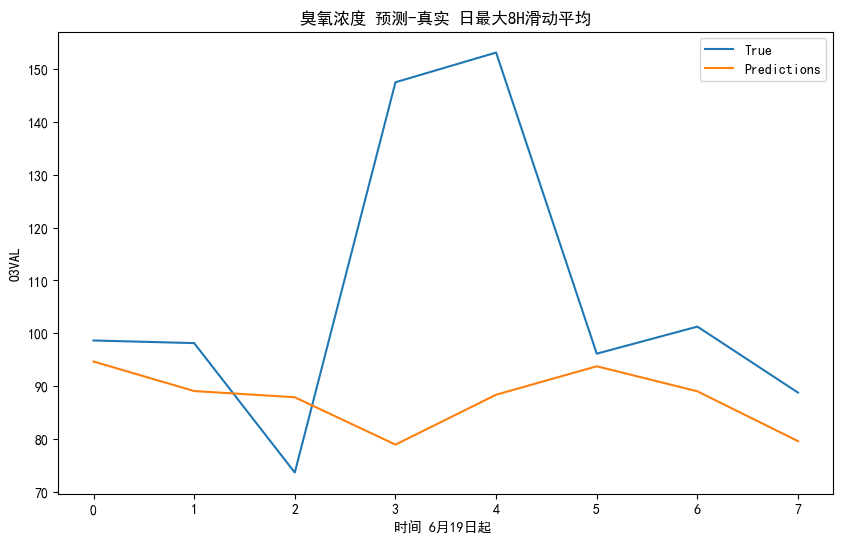

rmse: 34.351845592815835
r2 score: -0.7118305392671977
rmse: 7.004405761844475
r2 score: -783.9872012249613
rmse: 10.020318089341927
r2 score: 0.2626185463040902
rmse: 35.374817237463525
r2 score: -0.7395841802260887
rmse: 42.896035975685564
r2 score: -0.9282436646003216
rmse: 39.17063282312608
r2 score: -0.8252834250388821


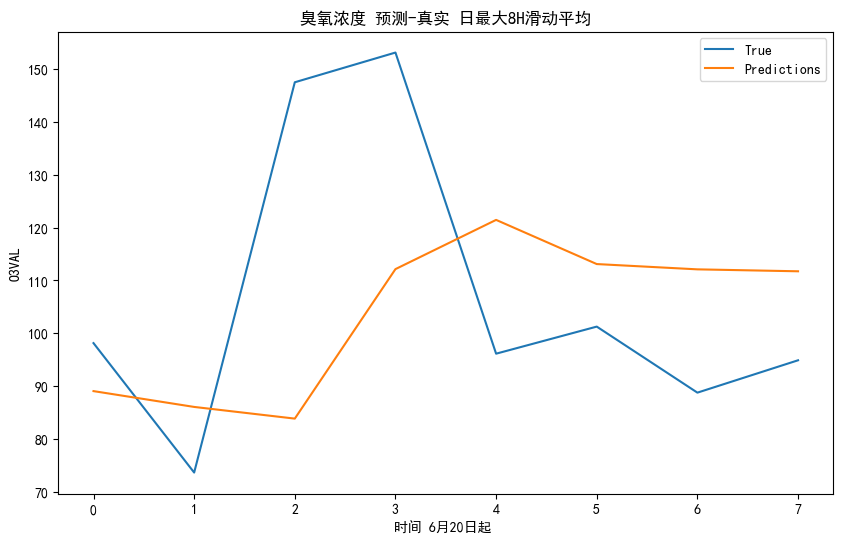

rmse: 30.782240844512504
r2 score: -0.35582468769328823
rmse: 10.881728828963128
r2 score: 0.21091530324306706
rmse: 37.81584616708192
r2 score: -0.514932291662771
rmse: 38.634314134517304
r2 score: -0.3362261028235807
rmse: 36.36432355612997
r2 score: -0.36207182662046167
rmse: 33.54595486550712
r2 score: -0.35489385940226015


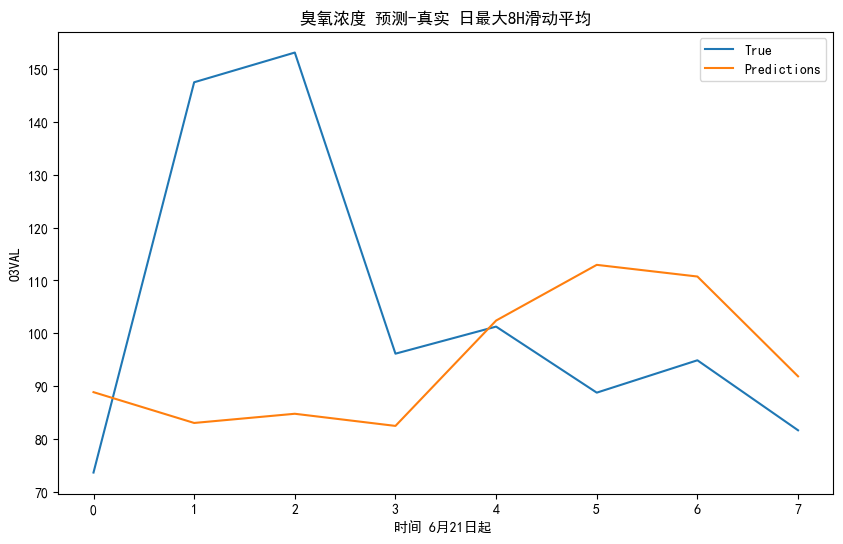

rmse: 35.69710475873077
r2 score: -0.6681195545363772
rmse: 46.85244031271628
r2 score: -0.6089014226187519
rmse: 54.97043461187469
r2 score: -1.3028878469453544
rmse: 48.0941125412109
r2 score: -1.0329929291080528
rmse: 43.019733417680165
r2 score: -0.9420897808005138
rmse: 40.49393710097704
r2 score: -0.8529140211789517


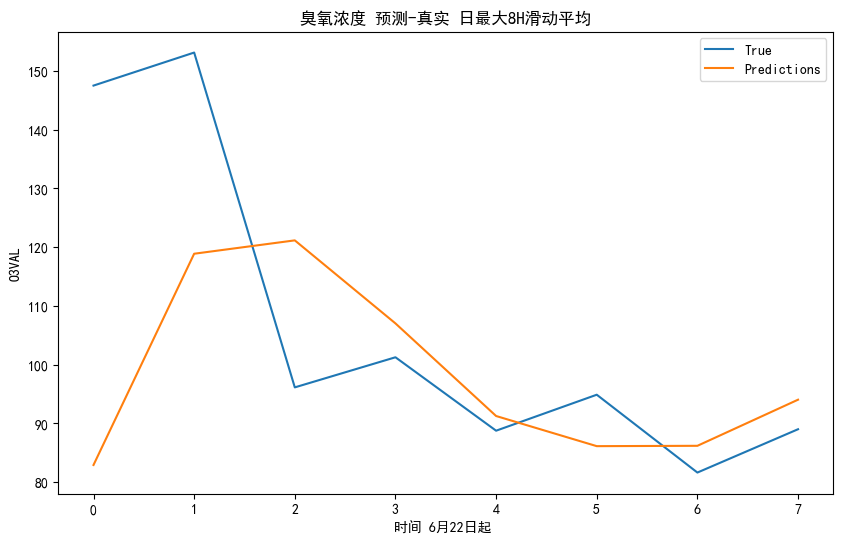

rmse: 27.688294122600073
r2 score: -0.14310992731610428
rmse: 51.69454323249065
r2 score: -336.8347678044723
rmse: 44.61297830259901
r2 score: -2.02580505757525
rmse: 38.74334267916539
r2 score: -1.228647910942577
rmse: 34.67113408178405
r2 score: -0.6172116075817042
rmse: 31.85150286017641
r2 score: -0.4712111723660708


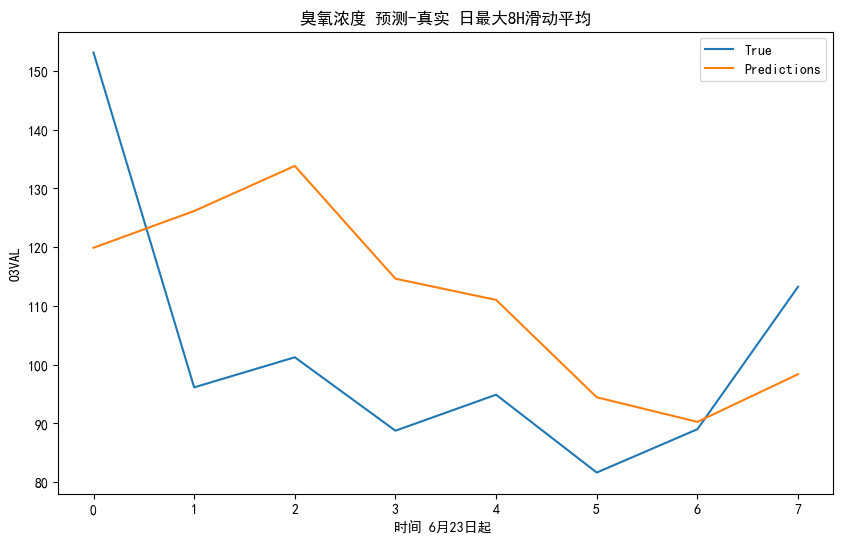

rmse: 23.410649846845182
r2 score: -0.22287576892591132
rmse: 31.669573254874972
r2 score: -0.23479454619377327
rmse: 31.97386797017664
r2 score: -0.5421589615421816
rmse: 30.56392331480656
r2 score: -0.44815076299499346
rmse: 28.27442612140957
r2 score: -0.44891298427069626
rmse: 26.335698854177352
r2 score: -0.2656489526634065


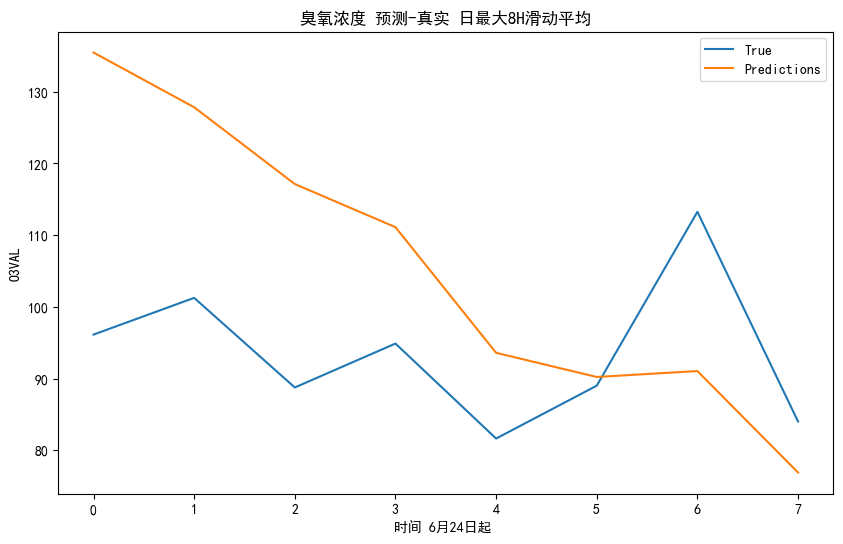

rmse: 22.395970080955085
r2 score: -4.4750959605781295
rmse: 33.58028501360368
r2 score: -170.72795874377337
rmse: 31.94031920050002
r2 score: -37.75649509317915
rmse: 28.827914357895875
r2 score: -40.995352039854296
rmse: 26.33337516464185
r2 score: -14.229289209910807
rmse: 24.044079462071192
r2 score: -13.572962139790802


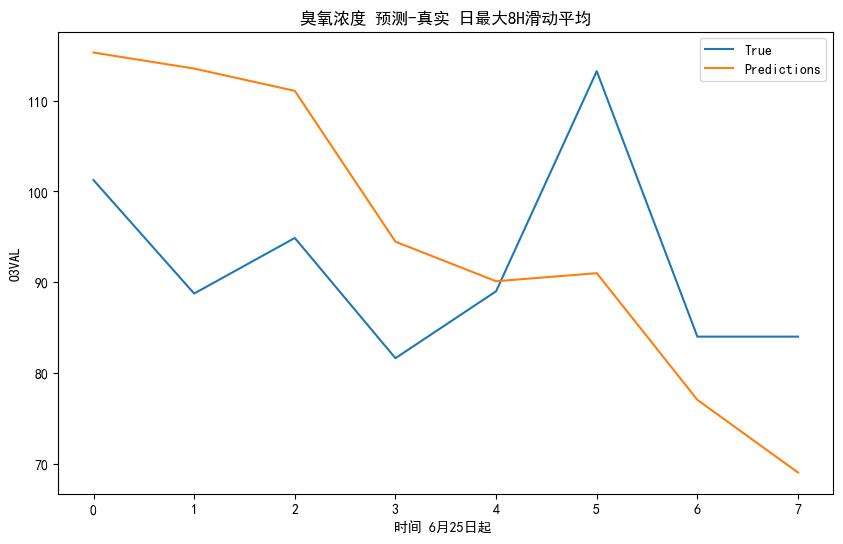

rmse: 15.846532420454277
r2 score: -1.5094839500187254
rmse: 20.149876744226216
r2 score: -9.394048839872218
rmse: 18.927844345810538
r2 score: -12.755476333131423
rmse: 17.603628504925755
r2 score: -4.861627054388595
rmse: 15.752914330575857
r2 score: -4.718335337879706
rmse: 17.010151694549418
r2 score: -1.7740158146942648


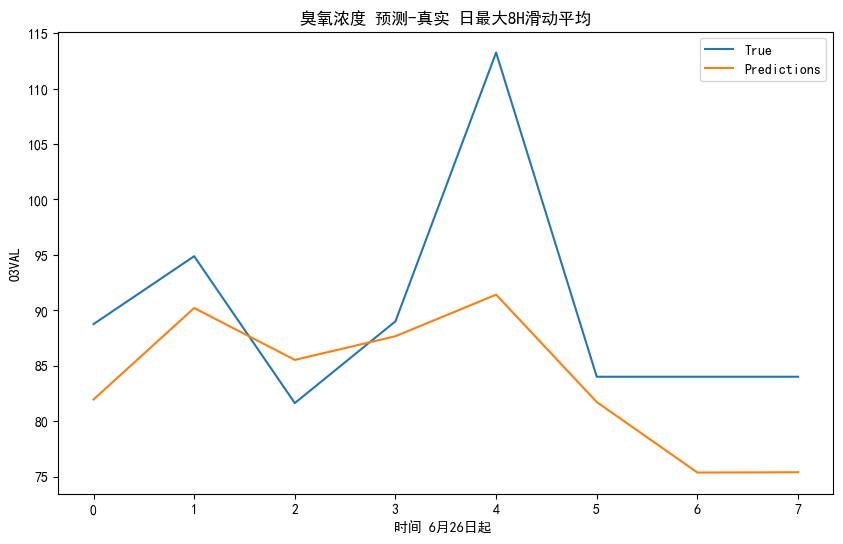

rmse: 9.462490854469873
r2 score: 0.0385102478289826
rmse: 5.835788810127414
r2 score: -2.6311729884716932
rmse: 5.26953213761911
r2 score: 0.05280409126763219
rmse: 4.612714977719533
r2 score: 0.035084552132223834
rmse: 10.603766801730679
r2 score: 0.02358864251410031
rmse: 9.724701823863178
r2 score: 0.1283747575915587


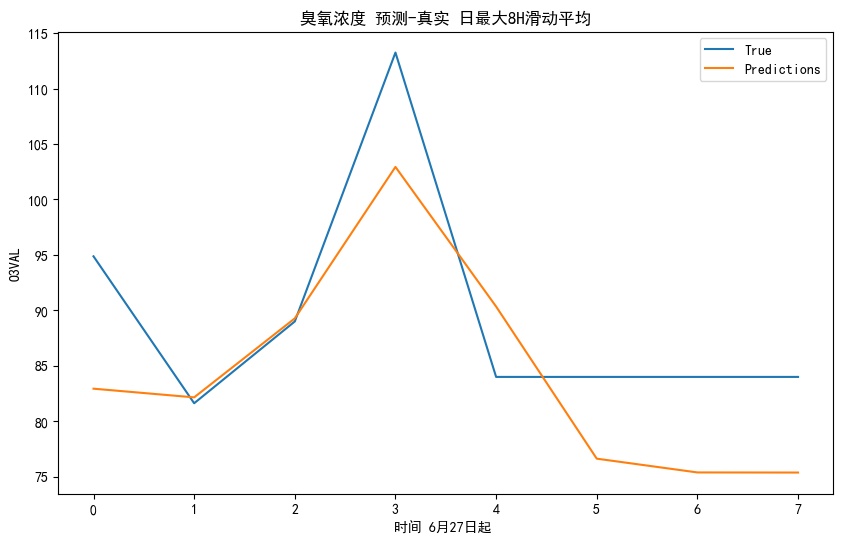

rmse: 7.845486291875439
r2 score: 0.3654660188687364
rmse: 8.448612791669651
r2 score: -0.6262939546557851
rmse: 6.900134987289706
r2 score: -0.6202548149275695
rmse: 7.89302850289409
r2 score: 0.5449058601638002
rmse: 7.609008530100885
r2 score: 0.5469407270752258
rmse: 7.570091294079259
r2 score: 0.5087155660594141


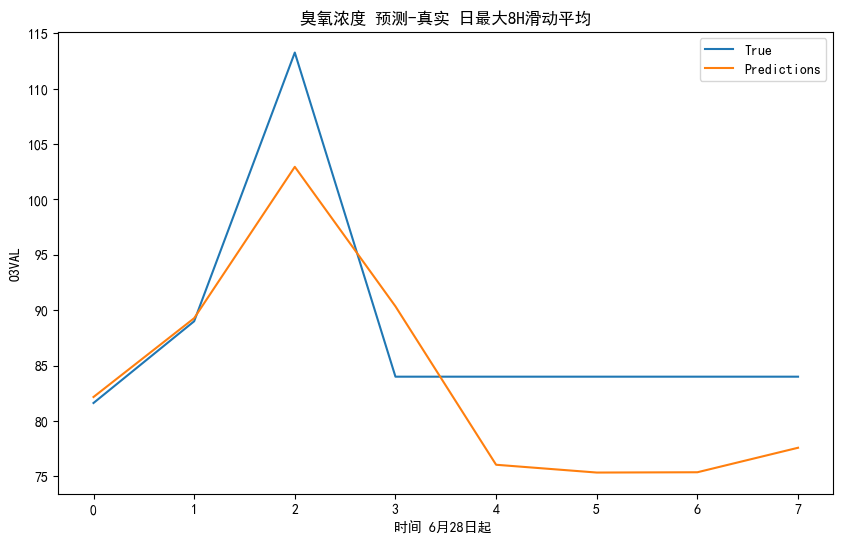

rmse: 7.0759233301340405
r2 score: 0.4724065996865573
rmse: 0.4308135019767449
r2 score: 0.9863505687985408
rmse: 5.964763415495663
r2 score: 0.8050609754082412
rmse: 6.06260393878432
r2 score: 0.7674456694759201
rmse: 6.483703620821477
r2 score: 0.6922517376086856
rmse: 6.892461529201253
r2 score: 0.602386382639231


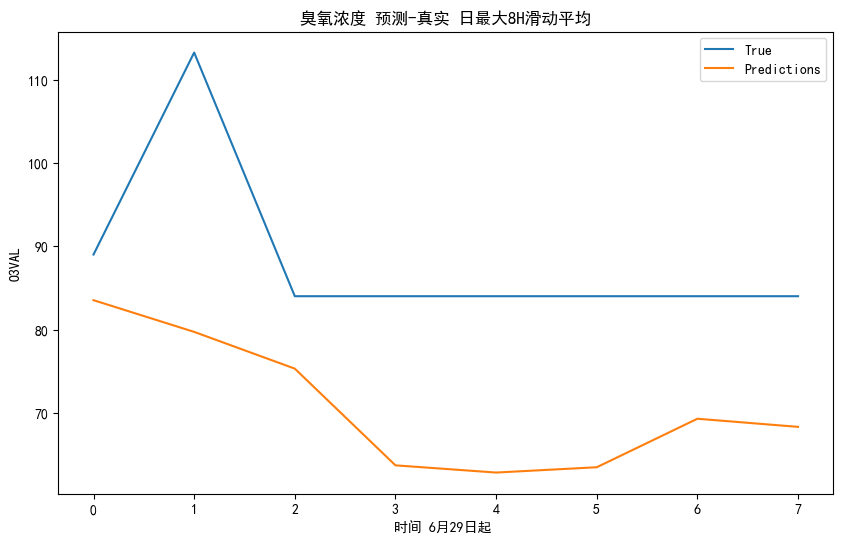

rmse: 19.28217245680333
r2 score: -3.0527280036362336
rmse: 24.025395615119145
r2 score: -2.9262468493603055
rmse: 20.248917157230053
r2 score: -1.5126685262495814
rmse: 20.26256820838786
r2 score: -1.7963484082871752
rmse: 20.44714540973469
r2 score: -2.2362083397076744
rmse: 20.461451386010417
r2 score: -2.6669123677565723


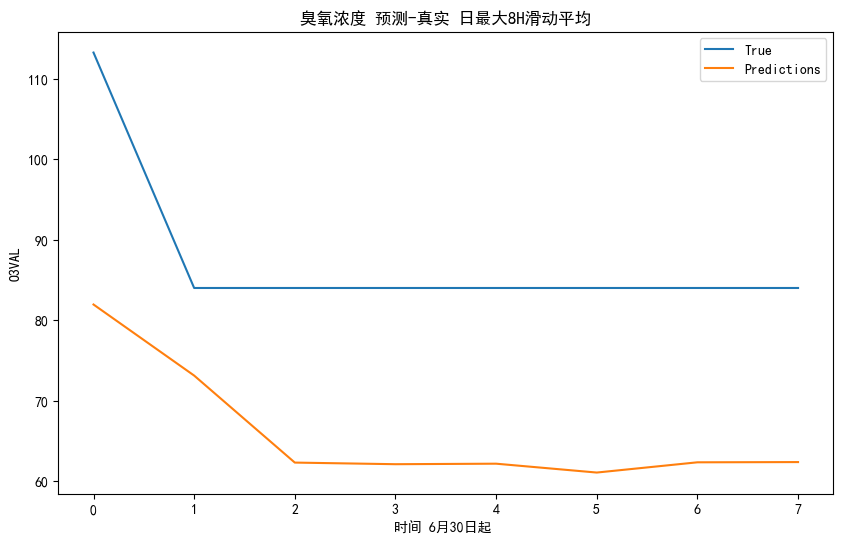

rmse: 22.325629688960433
r2 score: -4.3264472077976865
rmse: 23.433820422548884
r2 score: -1.5674053717701235
rmse: 22.868157148067546
r2 score: -1.7505725777710075
rmse: 22.628401119285027
r2 score: -2.191940037672742
rmse: 22.47095445190411
r2 score: -2.6886828400872895
rmse: 22.548242477123715
r2 score: -3.2786439557736538


In [40]:
# 创建滑动窗口计算平均值的函数
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
def sliding_window_average(data, window_size):
    # 保存滑动平均值的列表
    averaged_data = []
    # 用滑动窗口计算平均值
    len1 = len(data)
    for i in range(len1 - window_size + 1):
        avg = np.mean(data[i:i + window_size])
        averaged_data.append(avg)
    return averaged_data


def max_values(data, interval):
    averaged_data = []
    for i in range(0, len(data), 24):
        avg = max(data[i:i+interval])
        averaged_data.append(avg)
    return averaged_data

# 使用滑动窗口大小为8来计算滑动平均值
window_size = 8
for i in range(len(df_list)):
    y_test_sw_avg_8 = sliding_window_average(y_list[i].values, window_size)
    y_pred_sw_avg_8 = sliding_window_average(y_pred_list[i], window_size)
    y_test_sw_max_8 = max_values(y_test_sw_avg_8, 16)
    y_pred_sw_max_8 = max_values(y_pred_sw_avg_8, 16)   
    plt.figure(figsize=(10, 6))
    # 绘制每8小时为单位的滑动平均图像
    plt.title("臭氧浓度 预测-真实 日最大8H滑动平均")
    plt.plot(y_test_sw_max_8, label='True')
    plt.plot(y_pred_sw_max_8, label='Predictions')
    if 9+i <= 31:
        plt.xlabel('时间 5月'+str(9+i)+'日起 ')
    else:
        plt.xlabel('时间 6月'+str(9+i-31)+'日起 ')
    plt.ylabel('O3VAL')
    plt.legend()

    # for i in range(0, 32, 2):
    #     plt.text(i, y_test_sw_max_8[i], f'{y_test_sw_max_8[i]:.2f}', color='blue', fontsize=8, ha='right')
    #     plt.text(i, y_pred_sw_max_8[i], f'{y_pred_sw_max_8[i]:.2f}', color='orange', fontsize=8, ha='left')
    plt.show()

    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8, y_pred_sw_max_8)))
    print("r2 score:", r2_score(y_test_sw_max_8, y_pred_sw_max_8))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:2], y_pred_sw_max_8[:2])))
    print("r2 score:", r2_score(y_test_sw_max_8[:2], y_pred_sw_max_8[:2]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:3], y_pred_sw_max_8[:3])))
    print("r2 score:", r2_score(y_test_sw_max_8[:3], y_pred_sw_max_8[:3]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:4], y_pred_sw_max_8[:4])))
    print("r2 score:", r2_score(y_test_sw_max_8[:4], y_pred_sw_max_8[:4]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:5], y_pred_sw_max_8[:5])))
    print("r2 score:", r2_score(y_test_sw_max_8[:5], y_pred_sw_max_8[:5]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:6], y_pred_sw_max_8[:6])))
    print("r2 score:", r2_score(y_test_sw_max_8[:6], y_pred_sw_max_8[:6]))

# print("\ny_pred_sw_max_8   y_test_sw_max_8 ")
# for i in range(0,15):
#     print(y_pred_sw_max_8[i] , y_test_sw_max_8[i])